In [1]:
import sys
sys.path.append('../..')
import pandas as pd
pd.options.mode.chained_assignment = None
import matplotlib.pyplot as plt
import ta
import numpy as np
import datetime
from IPython.display import clear_output
from utilities.data_manager import ExchangeDataManager
from utilities.custom_indicators import get_n_columns
from utilities.bt_analysis import get_metrics, backtest_analysis
from utilities.plot_analysis import plot_equity_vs_asset, plot_futur_simulations, plot_bar_by_month
import nest_asyncio
from scipy.stats import qmc  # For Latin Hypercube Sampling
nest_asyncio.apply()

In [2]:
class LHS:
    def __init__(self, param_ranges):
        self.param_ranges = param_ranges
        self.n_params = len(param_ranges)
        
    def generate_samples(self, n_samples):
        # Generate Latin Hypercube samples
        samples = []
        for _ in range(n_samples):
            sample = {}
            for param, (min_val, max_val) in self.param_ranges.items():
                # Generate random values in the range [0, 1)
                u = np.random.uniform()
                # Calculate the segment boundaries for this parameter
                segment_min = min_val
                segment_max = max_val
                # Generate the sample value
                value = segment_min + u * (segment_max - segment_min)
                sample[param] = value
            samples.append(sample)
        return samples

# Rest of your code follows...

In [3]:
#DEFINE CLASS OF STRATEGY

class Strategy():
    def __init__(
        self,
        df_list,
        oldest_pair,
        type=["long"],
        params={},
    ):
        self.df_list = df_list
        self.oldest_pair = oldest_pair
        self.use_long = True if "long" in type else False
        self.use_short = True if "short" in type else False
        self.params = params

        
    def populate_indicators(self):
        for pair in self.df_list:
            params = self.params[pair]
            df = self.df_list[pair]
            df.drop(
                columns=df.columns.difference(['open','high','low','close','volume']), 
                inplace=True
            )
            
            # -- Populate indicators --    
            if params["src"] == "close":
                src = df["close"]
            elif params["src"] == "ohlc4":
                src = (df["close"] + df["high"] + df["low"] + df["open"]) / 4

            df['ma_base'] = ta.trend.sma_indicator(close=src, window=params["ma_base_window"]).shift(1)
            high_envelopes = [round(1/(1-e)-1, 3) for e in params["envelopes"]]
            for i in range(1, len(params["envelopes"]) + 1):
                df[f'ma_high_{i}'] = df['ma_base'] * (1 + high_envelopes[i-1])
                df[f'ma_low_{i}'] = df['ma_base'] * (1 - params["envelopes"][i-1])
        
            self.df_list[pair] = df
                
        return self.df_list[self.oldest_pair]
    
    def populate_buy_sell(self): 
        data_open_long = []
        data_close_long = []
        data_open_short = []
        data_close_short = []

        for pair in self.df_list:
            params = self.params[pair]
            df = self.df_list[pair]
            # -- Initiate populate --
            df["close_long"] = False
            df["close_short"] = False
            for i in range(1, len(params["envelopes"]) + 1):
                df[f"open_short_{i}"] = False
                df[f"open_long_{i}"] = False
            df["pair"] = pair
            df["null"] = np.nan
            
            
            if self.use_long:
                for i in range(1, len(params["envelopes"]) + 1):
                    df.loc[
                        (df['low'] <= df[f'ma_low_{i}'])
                        , f"open_long_{i}"
                    ] = True
                
                # -- Populate close long --
                df.loc[
                    (df['high'] >= df['ma_base'])
                    , "close_long"
                ] = True
                
            
            if self.use_short:
                for i in range(1, len(params["envelopes"]) + 1):
                    df.loc[
                        (df['high'] >= df[f'ma_high_{i}'])
                        , f"open_short_{i}"
                    ] = True
                
                df.loc[
                    (df['low'] <= df['ma_base'])
                    , "close_short"
                ] = True
                
                
            # -- Populate pair list per date (do not touch)--
            data_open_long.append(
                df.loc[
                (df['open_long_1']  == True) 
                ]['pair']
            )
            data_close_long.append(
                df.loc[
                (df['close_long']  == True) 
                ]['pair']
            )
            data_open_short.append(
                df.loc[
                (df['open_short_1']  == True) 
                ]['pair']
            )
            data_close_short.append(
                df.loc[
                (df['close_short']  == True) 
                ]['pair']
            )
        
        del df["pair"]
        del df["null"]
        self.df_list[pair] = df

        data_open_long.append(self.df_list[self.oldest_pair]['null'])
        data_close_long.append(self.df_list[self.oldest_pair]['null'])
        data_open_short.append(self.df_list[self.oldest_pair]['null'])
        data_close_short.append(self.df_list[self.oldest_pair]['null'])
        df_open_long = pd.concat(data_open_long, axis=1)
        df_open_long['combined']= df_open_long.values.tolist()
        df_open_long['combined'] = [[i for i in j if i == i] for j in list(df_open_long['combined'])]
        df_close_long = pd.concat(data_close_long, axis=1)
        df_close_long['combined']= df_close_long.values.tolist()
        df_close_long['combined'] = [[i for i in j if i == i] for j in list(df_close_long['combined'])]
        df_open_short = pd.concat(data_open_short, axis=1)
        df_open_short['combined']= df_open_short.values.tolist()
        df_open_short['combined'] = [[i for i in j if i == i] for j in list(df_open_short['combined'])]
        df_close_short = pd.concat(data_close_short, axis=1)
        df_close_short['combined']= df_close_short.values.tolist()
        df_close_short['combined'] = [[i for i in j if i == i] for j in list(df_close_short['combined'])]
        self.open_long_obj = df_open_long['combined']
        self.close_long_obj = df_close_long['combined']
        self.open_short_obj = df_open_short['combined']
        self.close_short_obj = df_close_short['combined']
        
        
        return self.df_list[self.oldest_pair]
        
    def run_backtest(self, initial_wallet=1000, leverage=1):
        params = self.params
        df_ini = self.df_list[self.oldest_pair][:]
        wallet = initial_wallet
        long_exposition = 0
        short_exposition = 0
        maker_fee = 0.0002
        taker_fee = 0.0006
        trades = []
        days = []
        current_day = 0
        previous_day = 0
        current_positions = {}
        
        for index, row in df_ini.iterrows():
            # -- Add daily report --
            current_day = index.day
            if previous_day != current_day:
                temp_wallet = wallet
                for pair in current_positions:
                    actual_row = self.df_list[pair].loc[index]
                    if current_positions[pair]['side'] == "LONG":
                        close_price = actual_row['open']
                        trade_result = (close_price - current_positions[pair]['price']) / current_positions[pair]['price']
                        close_size = current_positions[pair]['size'] + current_positions[pair]['size']  * trade_result
                        fee = close_size * taker_fee
                        temp_wallet += close_size - current_positions[pair]['size'] - fee
                    elif current_positions[pair]['side'] == "SHORT":
                        close_price = actual_row['open']
                        trade_result = (current_positions[pair]['price'] - close_price) / current_positions[pair]['price']
                        close_size = current_positions[pair]['size'] + current_positions[pair]['size']  * trade_result
                        fee = close_size * taker_fee
                        temp_wallet += close_size - current_positions[pair]['size'] - fee
                    
                days.append({
                    "day":str(index.year)+"-"+str(index.month)+"-"+str(index.day),
                    "wallet":temp_wallet,
                    "price":row['open'],
                    "long_exposition":0,
                    "short_exposition":0,
                    "risk":0,
                })
            previous_day = current_day 
            
            
            close_long_row = self.close_long_obj.loc[index]
            close_short_row = self.close_short_obj.loc[index]
            closed_pair = []
            if len(current_positions) > 0:
                # -- Close LONG --
                long_position_to_close = set({k: v for k,v in current_positions.items() if v['side'] == "LONG"}).intersection(set(close_long_row))
                for pair in long_position_to_close:
                    actual_row = self.df_list[pair].loc[index]
                    close_price = actual_row['ma_base']
                    trade_result = (close_price - current_positions[pair]['price']) / current_positions[pair]['price']
                    close_size = current_positions[pair]['size'] + current_positions[pair]['size'] * trade_result
                    fee = close_size * maker_fee
                    wallet += close_size - current_positions[pair]['size'] - fee
                    trades.append({
                        "pair": pair,
                        "open_date": current_positions[pair]['date'],
                        "close_date": index,
                        "position": current_positions[pair]['side'],
                        "open_reason": current_positions[pair]['reason'],
                        "close_reason": "Market",
                        "open_price": current_positions[pair]['price'],
                        "close_price": close_price,
                        "open_fee": current_positions[pair]['fee'],
                        "close_fee": fee,
                        "open_trade_size":current_positions[pair]['size'],
                        "close_trade_size":close_size,
                        "wallet": wallet,
                    })
                    del current_positions[pair]
                    closed_pair.append(pair)
                    
                # -- Close SHORT market --
                short_position_to_close = set({k: v for k,v in current_positions.items() if v['side'] == "SHORT"}).intersection(set(close_short_row))
                for pair in short_position_to_close:
                    actual_row = self.df_list[pair].loc[index]
                    close_price = actual_row['ma_base']
                    trade_result = (current_positions[pair]['price'] - close_price) / current_positions[pair]['price']
                    close_size = current_positions[pair]['size'] + current_positions[pair]['size'] * trade_result
                    fee = close_size * taker_fee
                    wallet += close_size - current_positions[pair]['size'] - fee
                    trades.append({
                        "pair": pair,
                        "open_date": current_positions[pair]['date'],
                        "close_date": index,
                        "position": current_positions[pair]['side'],
                        "open_reason": current_positions[pair]['reason'],
                        "close_reason": "Market",
                        "open_price": current_positions[pair]['price'],
                        "close_price": close_price,
                        "open_fee": current_positions[pair]['fee'],
                        "close_fee": fee,
                        "open_trade_size":current_positions[pair]['size'],
                        "close_trade_size":close_size,
                        "wallet": wallet,
                    })
                    del current_positions[pair]
                    closed_pair.append(pair)
                    
            # -- Check for opening position --
            # -- Open LONG market --
            open_long_row = self.open_long_obj.loc[index]
            for pair in open_long_row:
                actual_position = None
                actual_row = self.df_list[pair].loc[index]
                for i in range(1, len(params[pair]["envelopes"]) + 1):
                    if pair in current_positions:
                        actual_position = current_positions[pair]
                    if (actual_position and actual_position["side"] == "SHORT") or (actual_row[f"open_long_{i}"] == False) or (pair in closed_pair):
                        break
                    if actual_position and actual_position["envelope"] >= i:
                        continue
                    if actual_row[f"open_long_{i}"]:
                        open_price = actual_row[f'ma_low_{i}']
                        pos_size = (params[pair]["size"] * wallet * leverage) / len(params[pair]["envelopes"])
                        fee = pos_size * maker_fee
                        pos_size -= fee
                        wallet -= fee
                        if actual_position:
                            actual_position["price"] = (actual_position["size"] * actual_position["price"] + open_price * pos_size) / (actual_position["size"] + pos_size)
                            actual_position["size"] = actual_position["size"] + pos_size
                            actual_position["fee"] = actual_position["fee"] + fee
                            actual_position["envelope"] = i
                            actual_position["reason"] = f"Limit Envelop {i}"
                        else:
                            current_positions[pair] = {
                                "size": pos_size,
                                "date": index,
                                "price": open_price,
                                "fee":fee,
                                "reason": f"Limit Envelop {i}",
                                "side": "LONG",
                                "envelope": i,
                            }
                        long_exposition += 0
            # -- Open SHORT market --
            open_short_row = self.open_short_obj.loc[index]
            for pair in open_short_row:
                actual_position = None
                actual_row = self.df_list[pair].loc[index]
                for i in range(1, len(params[pair]["envelopes"]) + 1):
                    if pair in current_positions:
                        actual_position = current_positions[pair]
                    if (actual_position and actual_position["side"] == "LONG") or actual_row[f"open_short_{i}"] == False or (pair in closed_pair):
                        break
                    if actual_position and actual_position["envelope"] >= i:
                        continue
                    if actual_row[f"open_short_{i}"]:
                        open_price = actual_row[f'ma_high_{i}']
                        pos_size = (params[pair]["size"] * wallet * leverage) / len(params[pair]["envelopes"])
                        fee = pos_size * maker_fee
                        pos_size -= fee
                        wallet -= fee
                        if actual_position:
                            actual_position["price"] = (actual_position["size"] * actual_position["price"] + open_price * pos_size) / (actual_position["size"] + pos_size)
                            actual_position["size"] = actual_position["size"] + pos_size
                            actual_position["fee"] = actual_position["fee"] + fee
                            actual_position["envelope"] = i
                            actual_position["reason"] = f"Limit Envelop {i}"
                        else:
                            current_positions[pair] = {
                                "size": pos_size,
                                "date": index,
                                "price": open_price,
                                "fee":fee,
                                "reason": f"Limit Envelop {i}",
                                "side": "SHORT",
                                "envelope": i,
                            }
                        short_exposition += 0             
                        
        df_days = pd.DataFrame(days)
        df_days['day'] = pd.to_datetime(df_days['day'])
        df_days = df_days.set_index(df_days['day'])

        df_trades = pd.DataFrame(trades)
        df_trades['open_date'] = pd.to_datetime(df_trades['open_date'])
        df_trades = df_trades.set_index(df_trades['open_date'])   
        
        return get_metrics(df_trades, df_days) | {
            "wallet": wallet,
            "trades": df_trades,
            "days": df_days
        }      

In [4]:
# Walk-Forward Optimization Class
class WalkForwardOptimizer:
    def __init__(self, data, train_size=0.7, n_splits=5):
        self.data = data
        self.train_size = train_size
        self.n_splits = n_splits
        
    def generate_splits(self):
        total_samples = len(self.data)
        window_size = total_samples // self.n_splits
        train_size = int(window_size * self.train_size)
        
        splits = []
        for i in range(self.n_splits):
            start_idx = i * window_size
            train_end = start_idx + train_size
            test_end = start_idx + window_size if i < self.n_splits - 1 else total_samples
            
            train_data = self.data.iloc[start_idx:train_end]
            test_data = self.data.iloc[train_end:test_end]
            
            splits.append({
                'train': train_data,
                'test': test_data,
                'window_id': i
            })
            
        return splits

class ParameterSampler:
    def __init__(self, param_ranges, n_samples=50):
        self.param_ranges = param_ranges
        self.n_samples = n_samples
        
    def sample_parameters(self):
        sampler = qmc.LatinHypercube(d=len(self.param_ranges))
        samples = sampler.random(n=self.n_samples)
        
        param_sets = []
        for sample in samples:
            param_set = {}
            for (param_name, (low, high)), value in zip(self.param_ranges.items(), sample):
                if isinstance(low, int):
                    param_set[param_name] = int(low + (high - low) * value)
                else:
                    param_set[param_name] = round(low + (high - low) * value, 2)
            param_sets.append(param_set)
            
        return param_sets

MACHINERIE OPTIMISATION

WALK FORWARD + LHS

In [5]:
# Configuration variables - Restored to original values
N_WINDOWS = 4  # Original number of windows
N_SAMPLES = 500  # Original number of samples
TRAIN_SIZE = 0.7
INITIAL_WALLET = 1000
LEVERAGE = 2

# Restore full pair list
pair_list = [
    "BTC/USDT:USDT", "ETH/USDT:USDT", "ADA/USDT:USDT", "AVAX/USDT:USDT",
    "EGLD/USDT:USDT", "KSM/USDT:USDT", "ACH/USDT:USDT", "APE/USDT:USDT",
    "CRV/USDT:USDT", "DOGE/USDT:USDT", "ENJ/USDT:USDT", "FET/USDT:USDT",
    "ICP/USDT:USDT", "IMX/USDT:USDT", "LDO/USDT:USDT", "MAGIC/USDT:USDT",
    "SAND/USDT:USDT", "TRX/USDT:USDT", "XTZ/USDT:USDT", "SOL/USDT:USDT",
    "LINK/USDT:USDT", "SUI/USDT:USDT", "ARB/USDT:USDT", "ENS/USDT:USDT",
    "DOT/USDT:USDT", "OP/USDT:USDT"
]

# Restore full 4-envelope coins list
coins_with_4_envelopes = [
    "ADA/USDT:USDT", "AVAX/USDT:USDT", "EGLD/USDT:USDT", "KSM/USDT:USDT",
    "ACH/USDT:USDT", "APE/USDT:USDT", "CRV/USDT:USDT", "DOGE/USDT:USDT",
    "ENJ/USDT:USDT", "FET/USDT:USDT", "ICP/USDT:USDT", "IMX/USDT:USDT",
    "LDO/USDT:USDT", "MAGIC/USDT:USDT", "SAND/USDT:USDT", "TRX/USDT:USDT",
    "XTZ/USDT:USDT"
]

# Parameter ranges
param_ranges_3env = {
    "ma_base_window": (5, 20),
    "envelope1": (0.05, 0.09),
    "envelope2": (0.09, 0.12),
    "envelope3": (0.12, 0.17),
    "size": (0.03, 0.12)
}

param_ranges_4env = {
    "ma_base_window": (5, 20),
    "envelope1": (0.05, 0.09),
    "envelope2": (0.09, 0.12),
    "envelope3": (0.12, 0.17),
    "envelope4": (0.17, 0.22),
    "size": (0.03, 0.12)
}

# Initialize data manager and load data
exchange_name = "bitget"
tf = '1h'
oldest_pair = "BTC/USDT:USDT"

print("=== Data Loading Phase ===")
print(f"Exchange: {exchange_name}")
print(f"Timeframe: {tf}")
print(f"Number of pairs: {len(pair_list)}")

exchange = ExchangeDataManager(
    exchange_name=exchange_name,
    path_download="../database/exchanges"
)

df_list = {}
total_hours = 0
for pair in pair_list:
    df = exchange.load_data(pair, tf)
    df_list[pair] = df.loc[:]
    hours = len(df)
    total_hours = max(total_hours, hours)
    print(f"Loaded {pair} - {hours} hours ({hours/24:.1f} days) from {df.index[0]} to {df.index[-1]}")

# Initialize Walk-Forward Optimizer
wfo = WalkForwardOptimizer(df_list[oldest_pair], train_size=TRAIN_SIZE, n_splits=N_WINDOWS)
splits = wfo.generate_splits()

# Create parameter samplers
sampler_3env = ParameterSampler(param_ranges_3env, n_samples=N_SAMPLES)
sampler_4env = ParameterSampler(param_ranges_4env, n_samples=N_SAMPLES)

print("\n=== Optimization Configuration ===")
print(f"Number of windows: {N_WINDOWS}")
print(f"Training size: {TRAIN_SIZE*100}%")
print(f"Parameters per iteration: {N_SAMPLES}")

# Initialize results storage
optimization_results = {
    'windows': {},
    'all_iterations': []
}

# Perform Walk-Forward Optimization
for split in splits:
    window_id = split['window_id']
    train_data = split['train']
    test_data = split['test']
    
    print(f"\n{'='*50}")
    print(f"Processing Window {window_id + 1}/{N_WINDOWS}")
    print(f"{'='*50}")
    print(f"Train period: {train_data.index[0]} to {train_data.index[-1]}")
    print(f"Test period: {test_data.index[0]} to {test_data.index[-1]}")
    
    # Initialize window results
    optimization_results['windows'][window_id] = {
        'train_period': {
            'start': str(train_data.index[0]),
            'end': str(train_data.index[-1])
        },
        'test_period': {
            'start': str(test_data.index[0]),
            'end': str(test_data.index[-1])
        },
        'iterations': []
    }
    
    for iteration in range(N_SAMPLES):
        print(f"\nStarting iteration {iteration + 1}/{N_SAMPLES} for window {window_id + 1}")
        print(f"Train period: {train_data.index[0]} to {train_data.index[-1]}")
        print(f"Test period: {test_data.index[0]} to {test_data.index[-1]}")
        
        try:
            # Generate parameters
            iteration_params = {}
            for pair in pair_list:
                if pair in coins_with_4_envelopes:
                    params = sampler_4env.sample_parameters()[0]
                    envelopes = sorted([
                        float(params["envelope1"]),
                        float(params["envelope2"]),
                        float(params["envelope3"]),
                        float(params["envelope4"])
                    ])
                else:
                    params = sampler_3env.sample_parameters()[0]
                    envelopes = sorted([
                        float(params["envelope1"]),
                        float(params["envelope2"]),
                        float(params["envelope3"])
                    ])
                
                iteration_params[pair] = {
                    "src": "close",
                    "ma_base_window": int(round(float(params["ma_base_window"]))),
                    "envelopes": envelopes,
                    "size": float(params["size"])
                }
            
            print(f"Generated parameters for iteration {iteration + 1}")
            print(f"Sample parameters for {oldest_pair}:", iteration_params[oldest_pair])
            
            # Create train dataset and run training backtest
            train_df_list = {}
            for pair in pair_list:
                mask = (df_list[pair].index >= train_data.index[0]) & (df_list[pair].index <= train_data.index[-1])
                train_df_list[pair] = df_list[pair][mask]
            
            # Run strategy on train set
            train_strategy = Strategy(
                df_list=train_df_list,
                oldest_pair=oldest_pair,
                type=["long", "short"],
                params=iteration_params
            )
            
            train_strategy.populate_indicators()
            train_strategy.populate_buy_sell()
            
            print("Running train backtest...")
            train_bt_result = train_strategy.run_backtest(initial_wallet=INITIAL_WALLET, leverage=LEVERAGE)
            
            # Create test dataset and run test backtest
            test_df_list = {}
            for pair in pair_list:
                mask = (df_list[pair].index >= test_data.index[0]) & (df_list[pair].index <= test_data.index[-1])
                test_df_list[pair] = df_list[pair][mask]
            
            # Run strategy on test set
            test_strategy = Strategy(
                df_list=test_df_list,
                oldest_pair=oldest_pair,
                type=["long", "short"],
                params=iteration_params
            )
            
            test_strategy.populate_indicators()
            test_strategy.populate_buy_sell()
            
            print("Running test backtest...")
            test_bt_result = test_strategy.run_backtest(initial_wallet=INITIAL_WALLET, leverage=LEVERAGE)
            
            print("\nBacktests completed. Storing results...")
            
            # Create clean versions of results
            clean_train_result = {
                'sharpe_ratio': train_bt_result['sharpe_ratio'],
                'win_rate': train_bt_result['win_rate'],
                'avg_profit': train_bt_result['avg_profit'],
                'total_trades': train_bt_result['total_trades'],
                'max_drawdown': train_bt_result['max_drawdown'],
                'wallet': train_bt_result['wallet']
            }
            
            clean_test_result = {
                'sharpe_ratio': test_bt_result['sharpe_ratio'],
                'win_rate': test_bt_result['win_rate'],
                'avg_profit': test_bt_result['avg_profit'],
                'total_trades': test_bt_result['total_trades'],
                'max_drawdown': test_bt_result['max_drawdown'],
                'wallet': test_bt_result['wallet']
            }
            
            # Store results
            current_iteration = {
                'window_id': window_id,
                'parameters': iteration_params,
                'train_result': clean_train_result,
                'test_result': clean_test_result
            }
            
            # Store results
            optimization_results['windows'][window_id]['iterations'].append(current_iteration)
            optimization_results['all_iterations'].append(current_iteration)
            
            print(f"\n✅ Successfully stored iteration {iteration + 1}")
            print(f"Train period: {train_data.index[0]} to {train_data.index[-1]}")
            print(f"Test period: {test_data.index[0]} to {test_data.index[-1]}")
            print(f"Train Sharpe: {clean_train_result['sharpe_ratio']:.2f} | Test Sharpe: {clean_test_result['sharpe_ratio']:.2f}")
            print(f"Train Win Rate: {clean_train_result['win_rate']:.2f}% | Test Win Rate: {clean_test_result['win_rate']:.2f}%")
            print(f"Current window iterations: {len(optimization_results['windows'][window_id]['iterations'])}")
            print(f"Total iterations stored: {len(optimization_results['all_iterations'])}")
            
        except Exception as e:
            print(f"❌ Error in iteration {iteration}:")
            print(f"Type: {type(e)}")
            print(f"Message: {str(e)}")
            print(f"Location of error:", e.__traceback__.tb_lineno if e.__traceback__ else "Unknown")
            continue
        
    print(f"\nWindow {window_id + 1} Summary:")
    print(f"Train period: {train_data.index[0]} to {train_data.index[-1]}")
    print(f"Test period: {test_data.index[0]} to {test_data.index[-1]}")
    print(f"Iterations stored: {len(optimization_results['windows'][window_id]['iterations'])}")

print("\n=== Final Results ===")
for window_id in optimization_results['windows']:
    iterations = optimization_results['windows'][window_id]['iterations']
    window_data = optimization_results['windows'][window_id]
    print(f"\nWindow {window_id + 1}:")
    print(f"Train period: {window_data['train_period']['start']} to {window_data['train_period']['end']}")
    print(f"Test period: {window_data['test_period']['start']} to {window_data['test_period']['end']}")
    print(f"Total iterations: {len(iterations)}")

print(f"\nOptimization Complete")
print(f"Total iterations stored: {len(optimization_results['all_iterations'])}")

# Store results for further use
backtest_results = optimization_results

=== Data Loading Phase ===
Exchange: bitget
Timeframe: 1h
Number of pairs: 26
Loaded BTC/USDT:USDT - 48693 hours (2028.9 days) from 2019-07-10 11:00:00 to 2025-01-28 07:00:00
Loaded ETH/USDT:USDT - 47953 hours (1998.0 days) from 2019-08-10 07:00:00 to 2025-01-28 07:00:00
Loaded ADA/USDT:USDT - 38952 hours (1623.0 days) from 2020-08-19 08:00:00 to 2025-01-28 07:00:00
Loaded AVAX/USDT:USDT - 29214 hours (1217.2 days) from 2021-09-29 02:00:00 to 2025-01-28 07:00:00
Loaded EGLD/USDT:USDT - 27168 hours (1132.0 days) from 2021-12-23 08:00:00 to 2025-01-28 07:00:00
Loaded KSM/USDT:USDT - 27023 hours (1126.0 days) from 2021-12-29 09:00:00 to 2025-01-28 07:00:00
Loaded ACH/USDT:USDT - 16800 hours (700.0 days) from 2023-02-28 08:00:00 to 2025-01-28 07:00:00
Loaded APE/USDT:USDT - 24621 hours (1025.9 days) from 2022-04-08 11:00:00 to 2025-01-28 07:00:00
Loaded CRV/USDT:USDT - 27337 hours (1139.0 days) from 2021-12-16 07:00:00 to 2025-01-28 07:00:00
Loaded DOGE/USDT:USDT - 32354 hours (1348.1 days

MACHINE LEARNING ENSEMBLE OF RANDOM FOREST

In [6]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

=== Performance Distribution Analysis ===

Sharpe Ratio Statistics:
Train Sharpe - Mean: 2.08, Std: 1.31
Test Sharpe - Mean: 2.40, Std: 1.03
Sharpe Degradation - Mean: -0.32, Std: 2.02


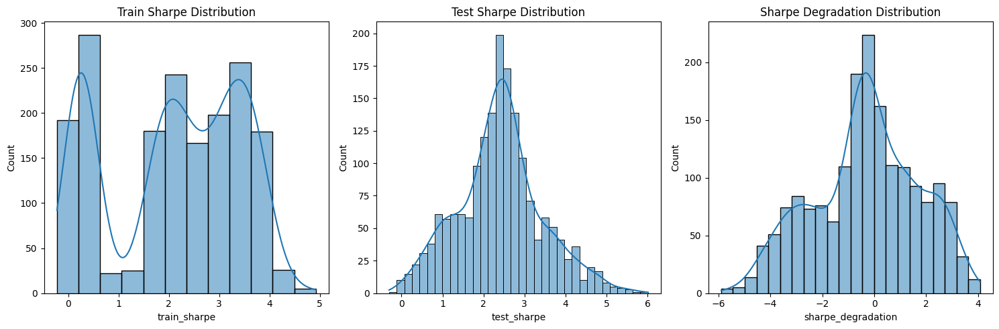

In [7]:
def prepare_and_analyze_data(backtest_results):
    """Prepare dataset and analyze distribution of results"""
    rows = []
    
    # Collect all data from backtest results
    for window_id, window_data in backtest_results['windows'].items():
        for iteration in window_data['iterations']:
            row = {
                'window_id': window_id,
                'train_sharpe': iteration['train_result']['sharpe_ratio'],
                'test_sharpe': iteration['test_result']['sharpe_ratio'],
                'sharpe_degradation': iteration['train_result']['sharpe_ratio'] - iteration['test_result']['sharpe_ratio'],
                'train_winrate': iteration['train_result']['win_rate'],
                'test_winrate': iteration['test_result']['win_rate'],
                'train_maxdd': iteration['train_result']['max_drawdown'],
                'test_maxdd': iteration['test_result']['max_drawdown']
            }
            
            # Extract parameters for each coin
            for pair, params in iteration['parameters'].items():
                pair_prefix = pair.split('/')[0].lower()
                row.update({
                    f'{pair_prefix}_ma_window': params['ma_base_window'],
                    f'{pair_prefix}_size': params['size']
                })
                for i, env in enumerate(params['envelopes']):
                    row[f'{pair_prefix}_envelope_{i+1}'] = env
            
            rows.append(row)
    
    df = pd.DataFrame(rows)
    
    # Print performance statistics
    print("=== Performance Distribution Analysis ===")
    print("\nSharpe Ratio Statistics:")
    print(f"Train Sharpe - Mean: {df['train_sharpe'].mean():.2f}, Std: {df['train_sharpe'].std():.2f}")
    print(f"Test Sharpe - Mean: {df['test_sharpe'].mean():.2f}, Std: {df['test_sharpe'].std():.2f}")
    print(f"Sharpe Degradation - Mean: {df['sharpe_degradation'].mean():.2f}, Std: {df['sharpe_degradation'].std():.2f}")
    
    # Create distribution plots
    plt.figure(figsize=(15, 5))
    
    plt.subplot(131)
    sns.histplot(df['train_sharpe'], kde=True)
    plt.title('Train Sharpe Distribution')
    
    plt.subplot(132)
    sns.histplot(df['test_sharpe'], kde=True)
    plt.title('Test Sharpe Distribution')
    
    plt.subplot(133)
    sns.histplot(df['sharpe_degradation'], kde=True)
    plt.title('Sharpe Degradation Distribution')
    
    plt.tight_layout()
    plt.show()
    
    return df

# Run data preparation and analysis
df = prepare_and_analyze_data(backtest_results)

VERSION TRAIN / TEST / DEGRADATION SHARP prediction (BETTER)

NEW (3 parameters optimizations range)

In [9]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score

def train_and_evaluate_rf_model(df):
    """Train Random Forest models on Train Sharpe, Test Sharpe, and Sharpe Degradation"""
    
    # Define features (strategy parameters)
    feature_cols = [col for col in df.columns if col not in 
                   ['window_id', 'train_sharpe', 'test_sharpe', 'sharpe_degradation',
                    'train_winrate', 'test_winrate', 'train_maxdd', 'test_maxdd']]
    
    X = df[feature_cols]
    
    # Define multiple targets
    y_train_sharpe = df['train_sharpe']
    y_test_sharpe = df['test_sharpe']
    y_sharpe_degradation = df['sharpe_degradation']
    
    # Initialize Random Forest models
    rf_train = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_test = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_degradation = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Perform 5-fold cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    print("\n=== Cross-Validation Results ===")
    
    for target_name, y_target, rf_model in zip(
        ["Train Sharpe", "Test Sharpe", "Sharpe Degradation"],
        [y_train_sharpe, y_test_sharpe, y_sharpe_degradation],
        [rf_train, rf_test, rf_degradation]):
        
        cv_scores = []
        
        print(f"\n--- {target_name} ---")
        for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y_target.iloc[train_idx], y_target.iloc[val_idx]
            
            # Train the model
            rf_model.fit(X_train, y_train)
            
            # Evaluate
            train_score = r2_score(y_train, rf_model.predict(X_train))
            val_score = r2_score(y_val, rf_model.predict(X_val))
            
            print(f"Fold {fold + 1}: Train R² = {train_score:.3f}, Validation R² = {val_score:.3f}")
            cv_scores.append(val_score)
        
        # Train final model on full dataset
        rf_model.fit(X, y_target)
    
    return rf_train, rf_test, rf_degradation, X

# Train and evaluate models
rf_train, rf_test, rf_degradation, X = train_and_evaluate_rf_model(df)



=== Cross-Validation Results ===

--- Train Sharpe ---
Fold 1: Train R² = 0.860, Validation R² = -0.037
Fold 2: Train R² = 0.858, Validation R² = -0.017
Fold 3: Train R² = 0.857, Validation R² = -0.008
Fold 4: Train R² = 0.858, Validation R² = -0.007
Fold 5: Train R² = 0.857, Validation R² = -0.015

--- Test Sharpe ---
Fold 1: Train R² = 0.867, Validation R² = 0.039
Fold 2: Train R² = 0.868, Validation R² = 0.044
Fold 3: Train R² = 0.868, Validation R² = 0.023
Fold 4: Train R² = 0.865, Validation R² = 0.035
Fold 5: Train R² = 0.866, Validation R² = 0.063

--- Sharpe Degradation ---
Fold 1: Train R² = 0.858, Validation R² = -0.028
Fold 2: Train R² = 0.856, Validation R² = 0.001
Fold 3: Train R² = 0.860, Validation R² = -0.014
Fold 4: Train R² = 0.860, Validation R² = 0.006
Fold 5: Train R² = 0.859, Validation R² = -0.013



=== Cross-Validation Results ===

--- Train Sharpe ---
Fold 1: Train R² = 0.712, Validation R² = -0.021
Fold 2: Train R² = 0.708, Validation R² = -0.014
Fold 3: Train R² = 0.706, Validation R² = 0.002
Fold 4: Train R² = 0.711, Validation R² = 0.003
Fold 5: Train R² = 0.711, Validation R² = -0.021

--- Test Sharpe ---
Fold 1: Train R² = 0.724, Validation R² = 0.060
Fold 2: Train R² = 0.721, Validation R² = 0.049
Fold 3: Train R² = 0.728, Validation R² = 0.038
Fold 4: Train R² = 0.721, Validation R² = 0.030
Fold 5: Train R² = 0.726, Validation R² = 0.059

--- Sharpe Degradation ---
Fold 1: Train R² = 0.718, Validation R² = -0.014
Fold 2: Train R² = 0.716, Validation R² = 0.009
Fold 3: Train R² = 0.719, Validation R² = -0.002
Fold 4: Train R² = 0.721, Validation R² = 0.012
Fold 5: Train R² = 0.720, Validation R² = -0.014

=== Feature Importance from RF Test ===
             feature  importance
117   link_ma_window    0.049089
112    sol_ma_window    0.023607
46     crv_ma_window    0.020

C:\Users\jonat\AppData\Local\Temp\ipykernel_30320\1503770604.py:86: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance_df, x='importance', y='feature', palette='viridis')


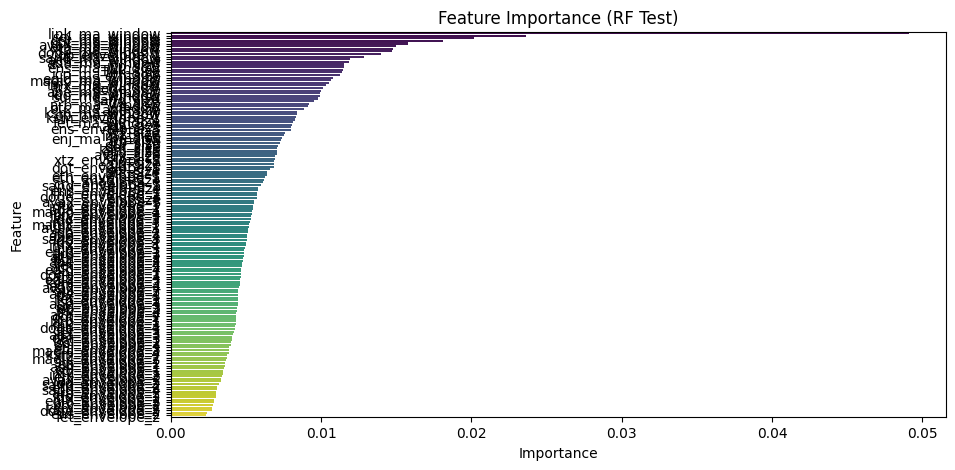


=== Robust Parameter Analysis ===
Total parameter sets analyzed: 1780
Number of robust parameter sets identified: 571
Performance threshold (predicted Test Sharpe): 2.502
Performance threshold (predicted Train Sharpe): 2.338
Performance threshold (predicted Sharpe Degradation): -0.821

=== Parameter Stability Analysis ===

btc_ma_window:
Mean: 11.900
Std Dev: 4.320
CV: 0.363
Range: 14.000

btc_size:
Mean: 0.075
Std Dev: 0.026
CV: 0.345
Range: 0.090

btc_envelope_1:
Mean: 0.071
Std Dev: 0.012
CV: 0.173
Range: 0.040

btc_envelope_2:
Mean: 0.106
Std Dev: 0.010
CV: 0.091
Range: 0.030

btc_envelope_3:
Mean: 0.146
Std Dev: 0.015
CV: 0.105
Range: 0.050

eth_ma_window:
Mean: 11.152
Std Dev: 4.341
CV: 0.389
Range: 14.000

eth_size:
Mean: 0.078
Std Dev: 0.026
CV: 0.330
Range: 0.090

eth_envelope_1:
Mean: 0.071
Std Dev: 0.012
CV: 0.173
Range: 0.040

eth_envelope_2:
Mean: 0.105
Std Dev: 0.010
CV: 0.093
Range: 0.030

eth_envelope_3:
Mean: 0.145
Std Dev: 0.015
CV: 0.101
Range: 0.050

ada_ma_window:

In [12]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

def train_and_evaluate_rf_model(df):
    """Train Random Forest models on Train Sharpe, Test Sharpe, and Sharpe Degradation"""

    # Définir les features utilisées comme entrées
    feature_cols = [col for col in df.columns if col not in 
                   ['window_id', 'train_sharpe', 'test_sharpe', 'sharpe_degradation',
                    'train_winrate', 'test_winrate', 'train_maxdd', 'test_maxdd']]
    
    X = df[feature_cols]
    
    # Normaliser les features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Définir plusieurs cibles
    y_train_sharpe = df['train_sharpe']
    y_test_sharpe = df['test_sharpe']
    y_sharpe_degradation = df['sharpe_degradation']
    
    # Initialiser les modèles Random Forest
    rf_train = RandomForestRegressor(n_estimators=100, min_samples_leaf=5, random_state=42)
    rf_test = RandomForestRegressor(n_estimators=100, min_samples_leaf=5, random_state=42)
    rf_degradation = RandomForestRegressor(n_estimators=100, min_samples_leaf=5, random_state=42)
    
    # Faire une validation croisée en 5-fold
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    print("\n=== Cross-Validation Results ===")
    
    for target_name, y_target, rf_model in zip(
        ["Train Sharpe", "Test Sharpe", "Sharpe Degradation"],
        [y_train_sharpe, y_test_sharpe, y_sharpe_degradation],
        [rf_train, rf_test, rf_degradation]):
        
        cv_scores = []
        
        print(f"\n--- {target_name} ---")
        for fold, (train_idx, val_idx) in enumerate(kf.split(X_scaled)):
            X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
            y_train, y_val = y_target.iloc[train_idx], y_target.iloc[val_idx]
            
            # Entraîner le modèle
            rf_model.fit(X_train, y_train)
            
            # Évaluer la performance
            train_score = r2_score(y_train, rf_model.predict(X_train))
            val_score = r2_score(y_val, rf_model.predict(X_val))
            
            print(f"Fold {fold + 1}: Train R² = {train_score:.3f}, Validation R² = {val_score:.3f}")
            cv_scores.append(val_score)
        
        # Entraîner le modèle final sur tout le dataset
        rf_model.fit(X_scaled, y_target)
    
    return rf_train, rf_test, rf_degradation, X, scaler

# Entraîner et évaluer les modèles
rf_train, rf_test, rf_degradation, X, scaler = train_and_evaluate_rf_model(df)

# Assurez-vous que feature_cols est défini
feature_cols = X.columns.tolist()

# Obtenir l'importance des features
def get_feature_importance(rf_model, feature_cols):
    """Extraire l'importance des features depuis le modèle Random Forest"""
    
    importance_df = pd.DataFrame({
        'feature': feature_cols,
        'importance': rf_model.feature_importances_
    }).sort_values(by='importance', ascending=False)
    
    # Afficher et visualiser l'importance des features
    print("\n=== Feature Importance from RF Test ===")
    print(importance_df)
    
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='importance', y='feature', palette='viridis')
    plt.title('Feature Importance (RF Test)')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()
    
    return importance_df

feature_importance = get_feature_importance(rf_test, feature_cols)


def identify_robust_parameters(df, rf_train, rf_test, rf_degradation, scaler):
    """Identifier les paramètres robustes basés sur les prédictions du Random Forest"""
    
    # Obtenir les colonnes des features
    feature_cols = X.columns.tolist()
    
    # Standardiser les features
    X_predict = df[feature_cols]
    X_scaled_predict = scaler.transform(X_predict)

    # Obtenir les prédictions des modèles RF
    pred_train_sharpe = rf_train.predict(X_scaled_predict)
    pred_test_sharpe = rf_test.predict(X_scaled_predict)
    pred_sharpe_degradation = rf_degradation.predict(X_scaled_predict)
    
    # Définir les seuils de filtrage
    threshold_test_sharpe = np.percentile(pred_test_sharpe, 60)
    threshold_train_sharpe = np.percentile(pred_train_sharpe, 60)
    threshold_degradation = np.percentile(pred_sharpe_degradation, 30)

    # Calculer le score de robustesse basé sur les trois critères
    stability_score = (
        (pred_test_sharpe >= threshold_test_sharpe).astype(int) +
        (pred_train_sharpe >= threshold_train_sharpe).astype(int) +
        (pred_sharpe_degradation <= threshold_degradation).astype(int)
    )

    # Sélectionner les ensembles de paramètres où au moins 2 des 3 conditions sont satisfaites
    robust_mask = stability_score >= 2
    robust_params = X_predict[robust_mask]
    
    print("\n=== Robust Parameter Analysis ===")
    print(f"Total parameter sets analyzed: {len(X_predict)}")
    print(f"Number of robust parameter sets identified: {len(robust_params)}")
    print(f"Performance threshold (predicted Test Sharpe): {threshold_test_sharpe:.3f}")
    print(f"Performance threshold (predicted Train Sharpe): {threshold_train_sharpe:.3f}")
    print(f"Performance threshold (predicted Sharpe Degradation): {threshold_degradation:.3f}")

    # Calculer des métriques de stabilité pour chaque paramètre
    stability_metrics = {}
    for param in feature_cols:
        values = robust_params[param]
        if len(values) > 0:
            stability_metrics[param] = {
                'mean': values.mean(),
                'std': values.std(),
                'cv': values.std() / values.mean() if values.mean() != 0 else float('inf'),
                'range': values.max() - values.min()
            }
        else:
            stability_metrics[param] = {
                'mean': np.nan,
                'std': np.nan,
                'cv': np.nan,
                'range': np.nan
            }
    
    # Afficher l'analyse de stabilité
    print("\n=== Parameter Stability Analysis ===")
    for param, metrics in stability_metrics.items():
        print(f"\n{param}:")
        print(f"Mean: {metrics['mean']:.3f}")
        print(f"Std Dev: {metrics['std']:.3f}")
        print(f"CV: {metrics['cv']:.3f}")
        print(f"Range: {metrics['range']:.3f}")
    
    return robust_params

# Identifier les paramètres robustes
robust_params = identify_robust_parameters(df, rf_train, rf_test, rf_degradation, scaler)


SUITE


=== Recommended Parameter Ranges by Coin ===

==================== LINK ====================

ma_window:
Conservative Range: [7.000, 13.000]
Extended Range: [5.000, 18.671]
Mean ± Std: 10.448 ± 4.111

size:
Conservative Range: [0.050, 0.090]
Extended Range: [0.030, 0.120]
Mean ± Std: 0.072 ± 0.026

envelope_3:
Conservative Range: [0.130, 0.160]
Extended Range: [0.120, 0.170]
Mean ± Std: 0.145 ± 0.015

envelope_2:
Conservative Range: [0.100, 0.110]
Extended Range: [0.090, 0.120]
Mean ± Std: 0.106 ± 0.010

envelope_1:
Conservative Range: [0.060, 0.080]
Extended Range: [0.050, 0.090]
Mean ± Std: 0.070 ± 0.012

==================== DOT ====================

ma_window:
Conservative Range: [7.000, 15.000]
Extended Range: [5.000, 19.000]
Mean ± Std: 11.364 ± 4.385

size:
Conservative Range: [0.050, 0.100]
Extended Range: [0.030, 0.120]
Mean ± Std: 0.074 ± 0.027

envelope_3:
Conservative Range: [0.130, 0.160]
Extended Range: [0.120, 0.170]
Mean ± Std: 0.146 ± 0.015

envelope_1:
Conservative R

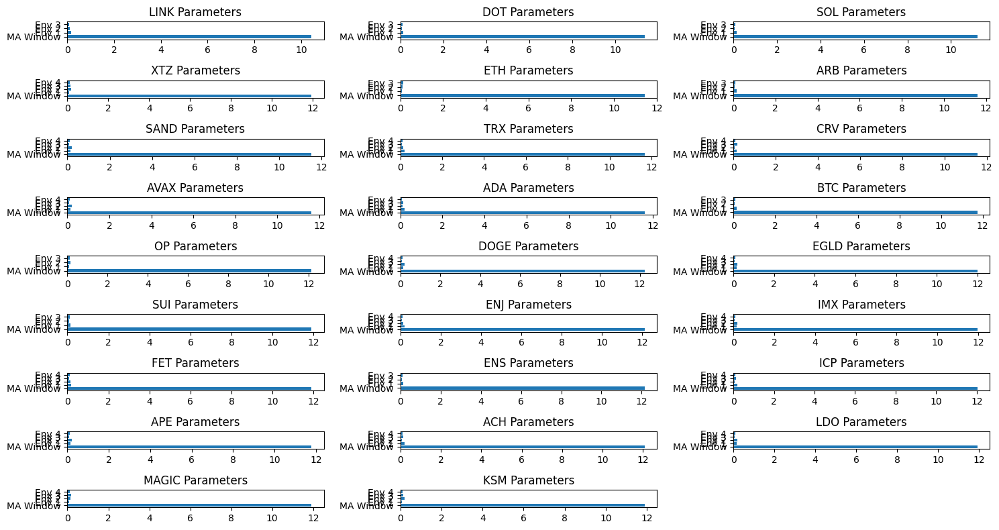

In [13]:
def generate_parameter_ranges(robust_params, feature_importance):
    """Generate final parameter ranges organized by coin"""
    
    # First, organize features by coin
    coin_parameters = {}
    
    # Get all column names
    all_features = feature_importance['feature'].tolist()
    
    # Group parameters by coin
    for feature in all_features:
        # Extract coin name from feature (e.g., 'btc_ma_window' -> 'btc')
        coin = feature.split('_')[0]
        param_type = '_'.join(feature.split('_')[1:])  # Get parameter type (ma_window, size, envelope_1, etc.)
        
        if coin not in coin_parameters:
            coin_parameters[coin] = []
        coin_parameters[coin].append(feature)
    
    # Calculate ranges for each coin
    final_ranges = {}
    
    print("\n=== Recommended Parameter Ranges by Coin ===")
    for coin, features in coin_parameters.items():
        print(f"\n{'='*20} {coin.upper()} {'='*20}")
        final_ranges[coin] = {}
        
        for feature in features:
            values = robust_params[feature]
            
            # Calculate statistical ranges
            mean = values.mean()
            std = values.std()
            
            final_ranges[coin][feature] = {
                'min': max(values.min(), mean - 2*std),
                'max': min(values.max(), mean + 2*std),
                'mean': mean,
                'std': std,
                'confidence_95': [mean - 2*std, mean + 2*std],
                'quartiles': [values.quantile(0.25), values.quantile(0.75)]
            }
            
            # Print ranges for this parameter
            param_type = '_'.join(feature.split('_')[1:])
            print(f"\n{param_type}:")
            print(f"Conservative Range: [{final_ranges[coin][feature]['quartiles'][0]:.3f}, "
                  f"{final_ranges[coin][feature]['quartiles'][1]:.3f}]")
            print(f"Extended Range: [{final_ranges[coin][feature]['min']:.3f}, "
                  f"{final_ranges[coin][feature]['max']:.3f}]")
            print(f"Mean ± Std: {mean:.3f} ± {std:.3f}")
    
    print(f"\nAnalysis based on {len(robust_params)} robust samples")
    print(f"Total coins analyzed: {len(coin_parameters)}")
    
    # Optional: Create a summary visualization
    plt.figure(figsize=(15, 8))
    coin_count = len(coin_parameters)
    cols = 3
    rows = (coin_count + cols - 1) // cols
    
    for i, (coin, features) in enumerate(coin_parameters.items()):
        plt.subplot(rows, cols, i+1)
        
        # Plot MA window and envelope ranges for each coin
        ma_feature = [f for f in features if 'ma_window' in f][0]
        env_features = [f for f in features if 'envelope' in f]
        
        y_pos = np.arange(len(env_features) + 1)
        param_means = [final_ranges[coin][ma_feature]['mean']]
        param_means.extend([final_ranges[coin][f]['mean'] for f in env_features])
        
        plt.barh(y_pos, param_means)
        plt.yticks(y_pos, ['MA Window'] + [f'Env {i+1}' for i in range(len(env_features))])
        plt.title(f'{coin.upper()} Parameters')
    
    plt.tight_layout()
    plt.show()
    
    return final_ranges

# Generate final parameter ranges
final_ranges = generate_parameter_ranges(robust_params, feature_importance)

GAUSSIAN + Bayesian process



=== Gaussian Filtering Phase ===

==================== LINK ====================

Analyzing parameters for LINK:
- link_ma_window
- link_size
- link_envelope_3
- link_envelope_2
- link_envelope_1

Found 334 stable parameter sets for LINK

Parameter distributions in stable regions for LINK:

ma_window:
Stable range: [7.0000, 10.7500]
Mean ± Std: 8.8952 ± 2.4952

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0746 ± 0.0211

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1440 ± 0.0112

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1063 ± 0.0065

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0716 ± 0.0102


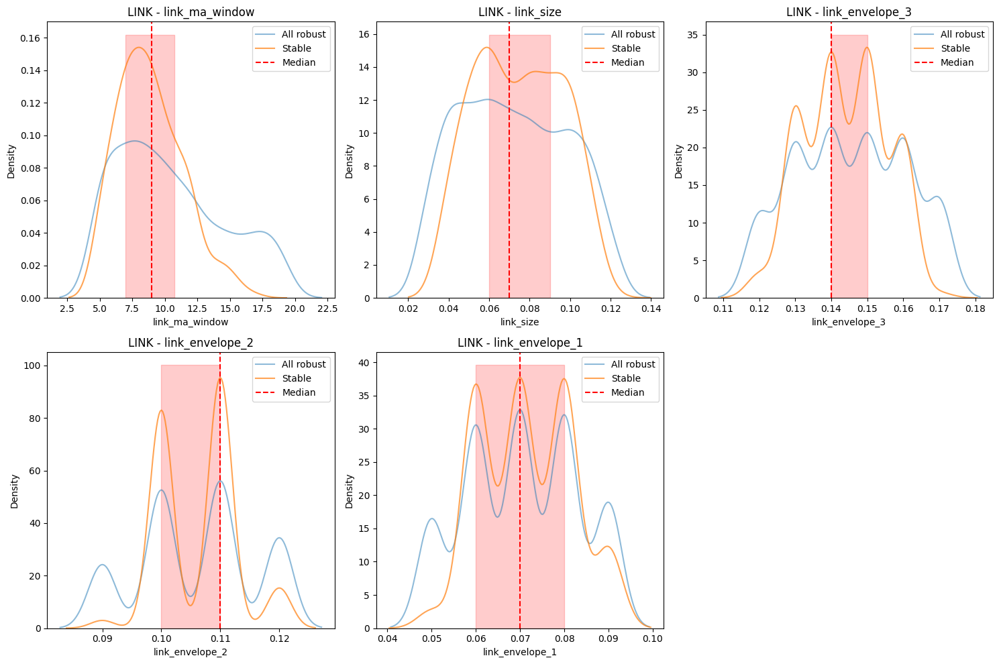


==================== DOT ====================

Analyzing parameters for DOT:
- dot_ma_window
- dot_size
- dot_envelope_3
- dot_envelope_1
- dot_envelope_2

Found 334 stable parameter sets for DOT

Parameter distributions in stable regions for DOT:

ma_window:
Stable range: [8.0000, 13.0000]
Mean ± Std: 10.5389 ± 3.6781

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0754 ± 0.0233

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1463 ± 0.0112

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0714 ± 0.0086

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1052 ± 0.0061


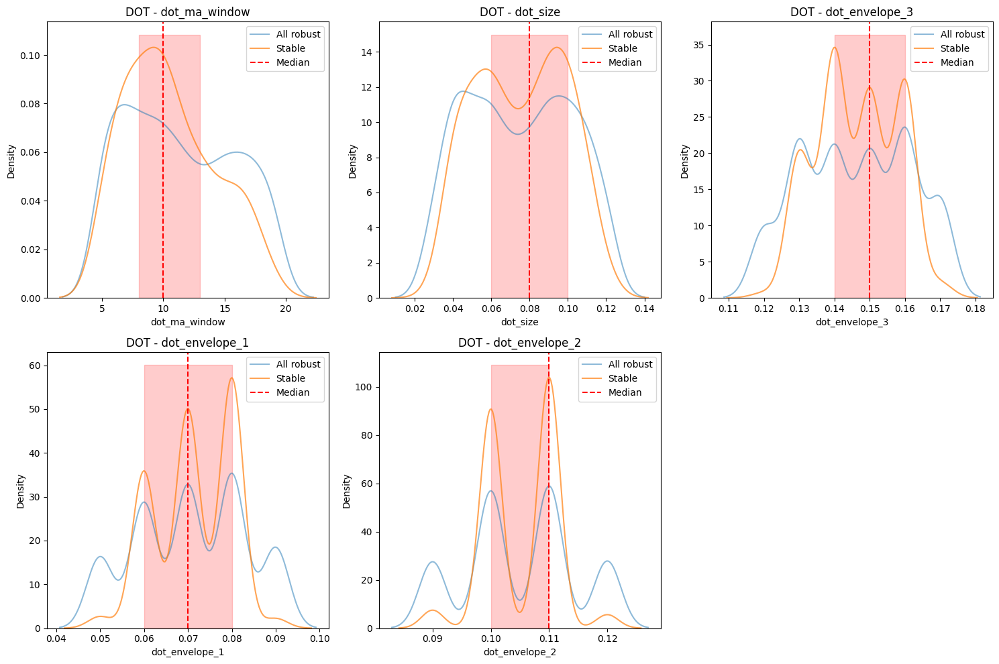


==================== SOL ====================

Analyzing parameters for SOL:
- sol_ma_window
- sol_size
- sol_envelope_3
- sol_envelope_1
- sol_envelope_2

Found 334 stable parameter sets for SOL

Parameter distributions in stable regions for SOL:

ma_window:
Stable range: [7.0000, 14.0000]
Mean ± Std: 10.8413 ± 3.8651

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0773 ± 0.0215

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1456 ± 0.0109

envelope_1:
Stable range: [0.0700, 0.0800]
Mean ± Std: 0.0726 ± 0.0091

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1052 ± 0.0053


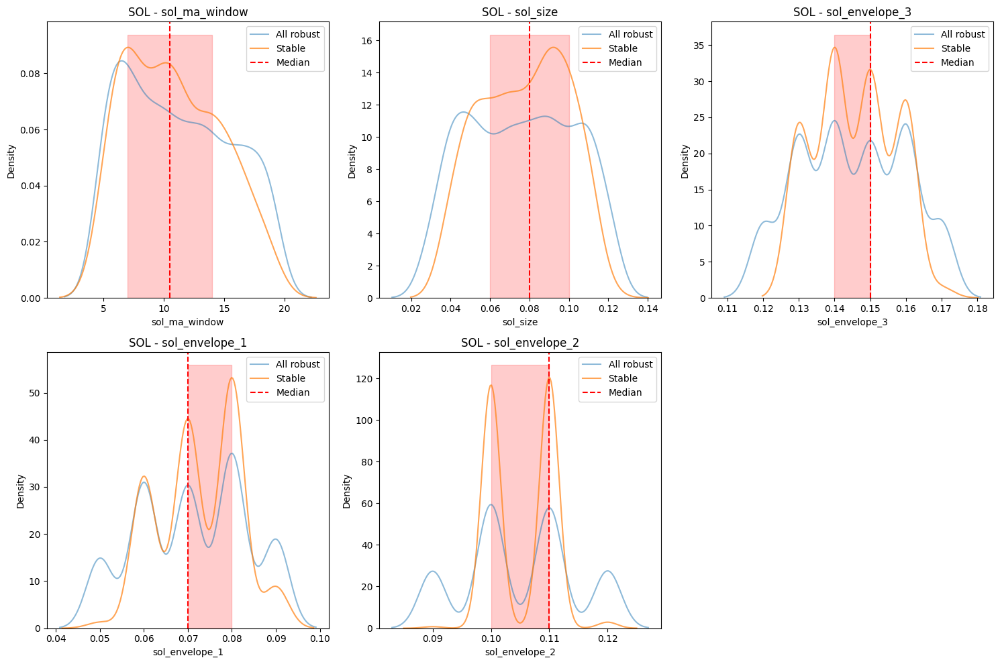


==================== XTZ ====================

Analyzing parameters for XTZ:
- xtz_ma_window
- xtz_size
- xtz_envelope_1
- xtz_envelope_4
- xtz_envelope_3
- xtz_envelope_2

Found 334 stable parameter sets for XTZ

Parameter distributions in stable regions for XTZ:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.0838 ± 3.7775

size:
Stable range: [0.0500, 0.0900]
Mean ± Std: 0.0731 ± 0.0220

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0702 ± 0.0096

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1959 ± 0.0109

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1460 ± 0.0129

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1041 ± 0.0065


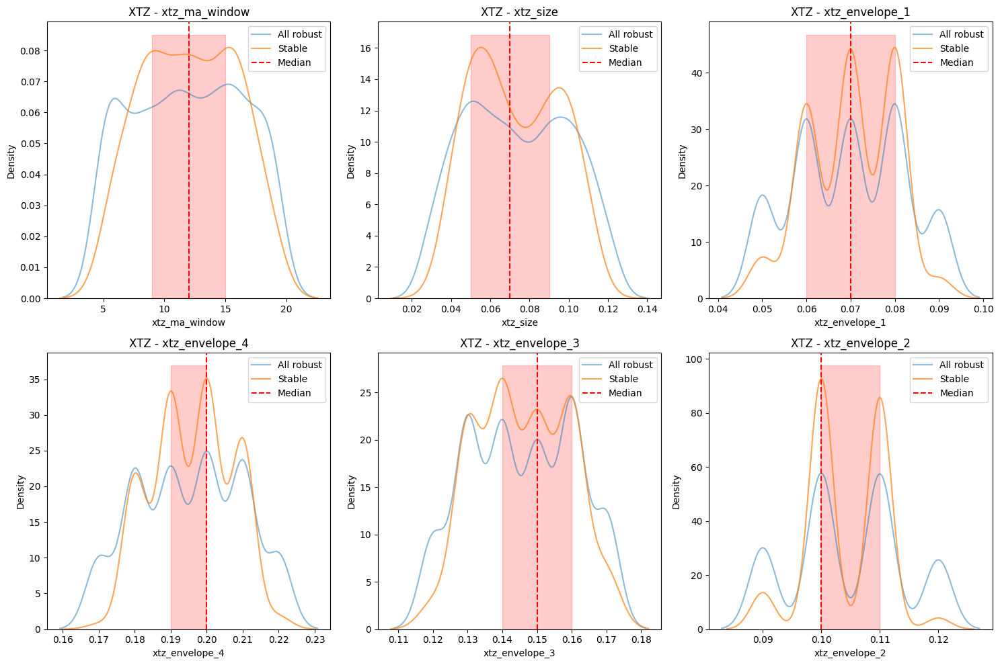


==================== ETH ====================

Analyzing parameters for ETH:
- eth_ma_window
- eth_envelope_1
- eth_size
- eth_envelope_2
- eth_envelope_3

Found 335 stable parameter sets for ETH

Parameter distributions in stable regions for ETH:

ma_window:
Stable range: [7.0000, 13.0000]
Mean ± Std: 10.4209 ± 3.4501

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0699 ± 0.0086

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0740 ± 0.0216

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1051 ± 0.0055

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1472 ± 0.0109


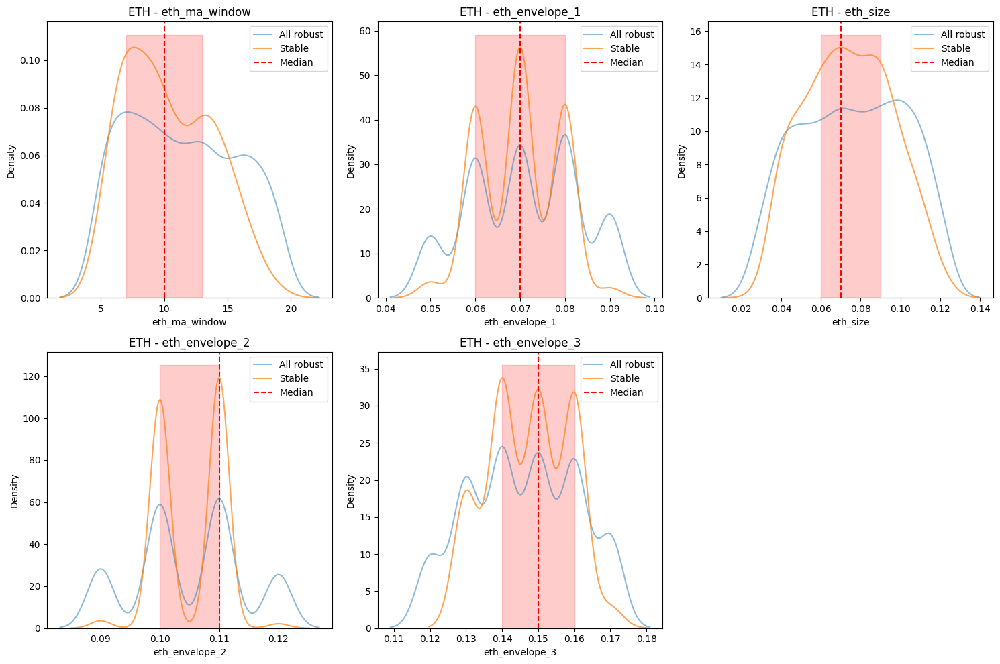


==================== ARB ====================

Analyzing parameters for ARB:
- arb_ma_window
- arb_size
- arb_envelope_3
- arb_envelope_1
- arb_envelope_2

Found 334 stable parameter sets for ARB

Parameter distributions in stable regions for ARB:

ma_window:
Stable range: [8.0000, 14.0000]
Mean ± Std: 11.2485 ± 3.3163

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0742 ± 0.0222

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1448 ± 0.0115

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0704 ± 0.0087

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1055 ± 0.0057


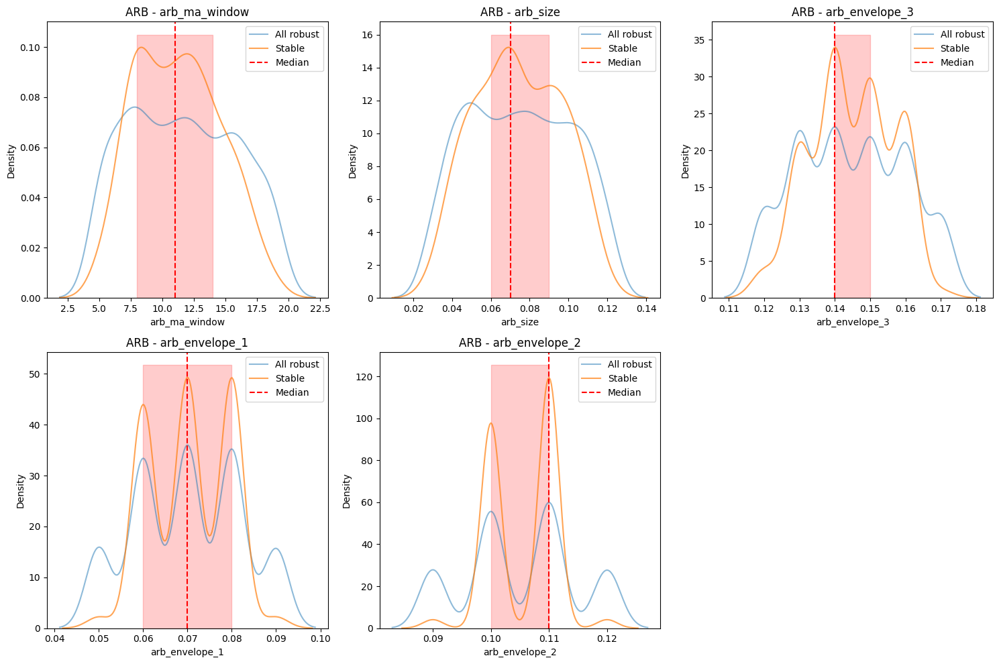


==================== SAND ====================

Analyzing parameters for SAND:
- sand_ma_window
- sand_size
- sand_envelope_3
- sand_envelope_4
- sand_envelope_1
- sand_envelope_2

Found 334 stable parameter sets for SAND

Parameter distributions in stable regions for SAND:

ma_window:
Stable range: [8.0000, 13.0000]
Mean ± Std: 10.6228 ± 3.8346

size:
Stable range: [0.0500, 0.0900]
Mean ± Std: 0.0729 ± 0.0230

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1490 ± 0.0107

envelope_4:
Stable range: [0.1825, 0.2000]
Mean ± Std: 0.1947 ± 0.0122

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0695 ± 0.0106

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1033 ± 0.0061


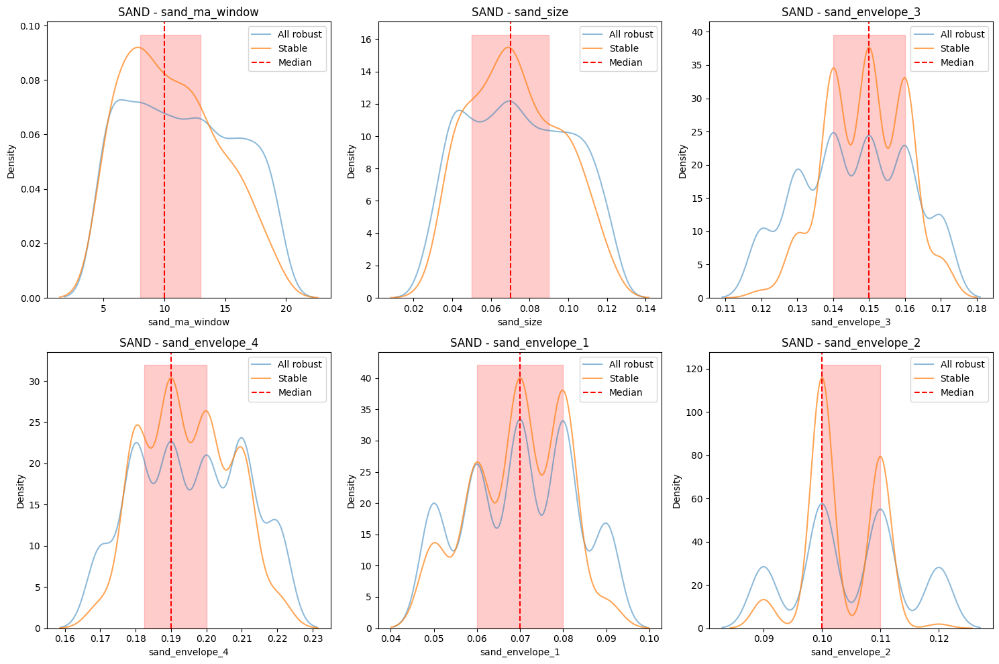


==================== TRX ====================

Analyzing parameters for TRX:
- trx_ma_window
- trx_size
- trx_envelope_4
- trx_envelope_3
- trx_envelope_1
- trx_envelope_2

Found 334 stable parameter sets for TRX

Parameter distributions in stable regions for TRX:

ma_window:
Stable range: [8.0000, 14.0000]
Mean ± Std: 11.3862 ± 3.6380

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0779 ± 0.0236

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1950 ± 0.0115

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1455 ± 0.0120

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0706 ± 0.0100

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1053 ± 0.0066


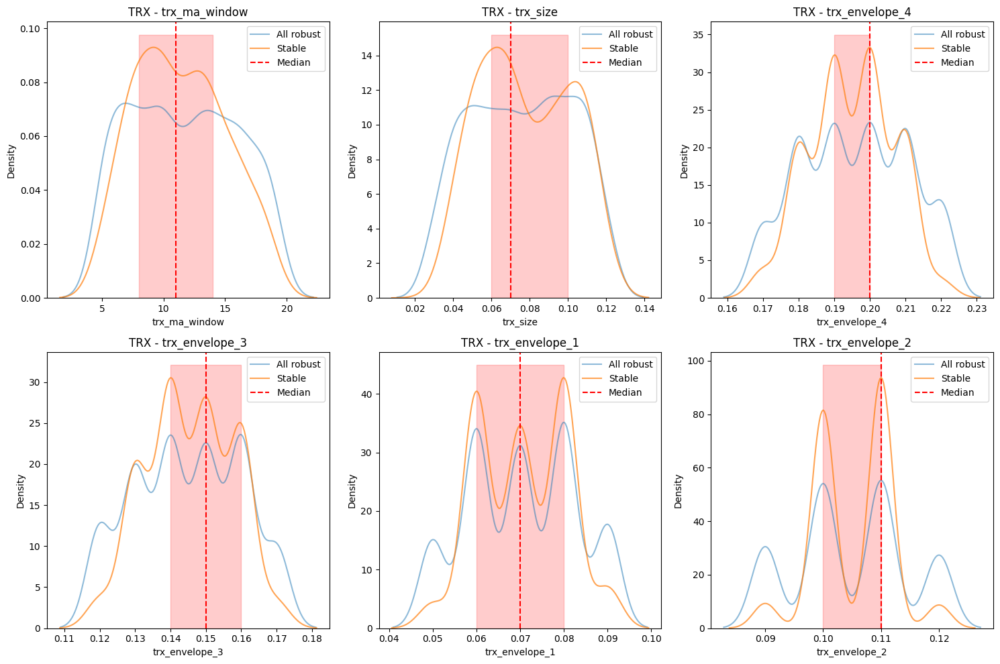


==================== CRV ====================

Analyzing parameters for CRV:
- crv_ma_window
- crv_size
- crv_envelope_3
- crv_envelope_1
- crv_envelope_4
- crv_envelope_2

Found 334 stable parameter sets for CRV

Parameter distributions in stable regions for CRV:

ma_window:
Stable range: [8.0000, 13.0000]
Mean ± Std: 10.8204 ± 3.5831

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0757 ± 0.0208

envelope_3:
Stable range: [0.1300, 0.1500]
Mean ± Std: 0.1447 ± 0.0121

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0701 ± 0.0100

envelope_4:
Stable range: [0.1900, 0.2100]
Mean ± Std: 0.1955 ± 0.0123

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1053 ± 0.0069


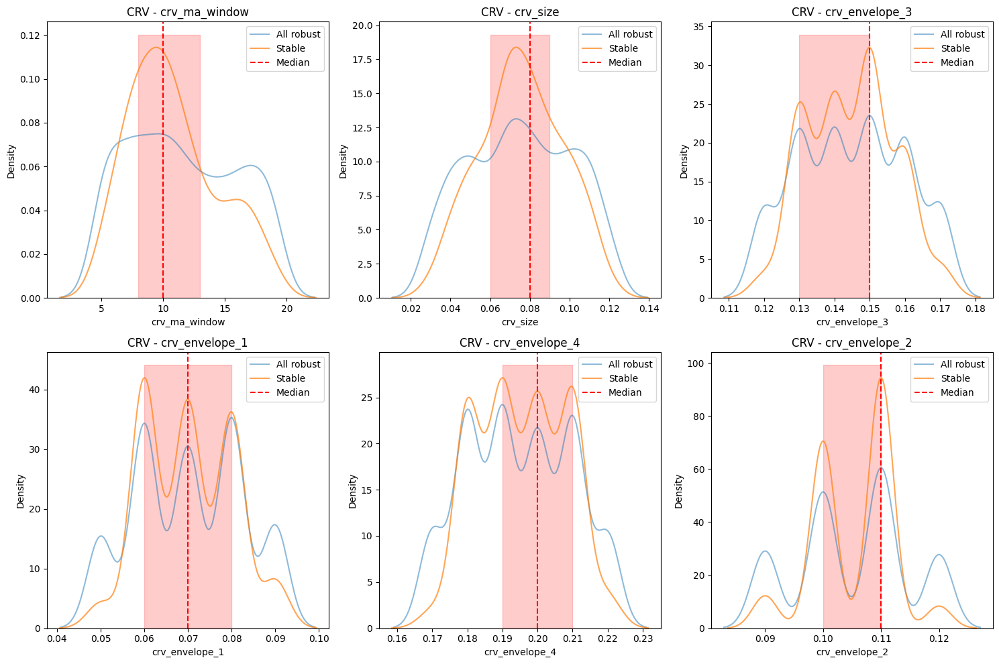


==================== AVAX ====================

Analyzing parameters for AVAX:
- avax_ma_window
- avax_size
- avax_envelope_3
- avax_envelope_4
- avax_envelope_1
- avax_envelope_2

Found 334 stable parameter sets for AVAX

Parameter distributions in stable regions for AVAX:

ma_window:
Stable range: [8.0000, 15.0000]
Mean ± Std: 11.4341 ± 3.8164

size:
Stable range: [0.0500, 0.0900]
Mean ± Std: 0.0692 ± 0.0219

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1456 ± 0.0115

envelope_4:
Stable range: [0.1900, 0.2100]
Mean ± Std: 0.1962 ± 0.0118

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0692 ± 0.0097

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1053 ± 0.0067


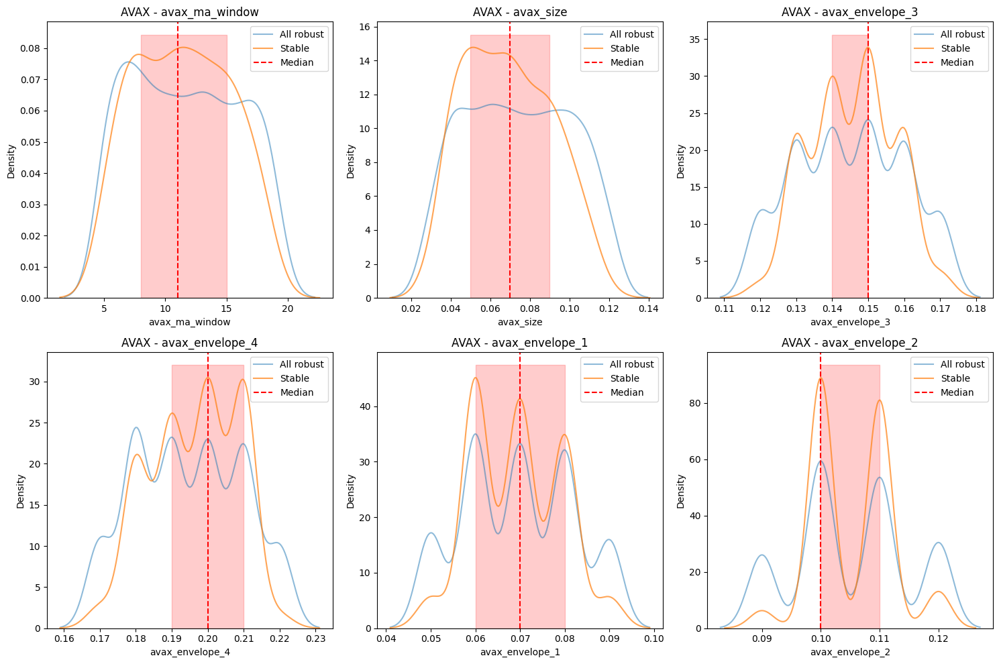


==================== ADA ====================

Analyzing parameters for ADA:
- ada_ma_window
- ada_size
- ada_envelope_4
- ada_envelope_2
- ada_envelope_3
- ada_envelope_1

Found 334 stable parameter sets for ADA

Parameter distributions in stable regions for ADA:

ma_window:
Stable range: [9.0000, 14.0000]
Mean ± Std: 11.3533 ± 3.6990

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0784 ± 0.0215

envelope_4:
Stable range: [0.1900, 0.2100]
Mean ± Std: 0.1964 ± 0.0127

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1048 ± 0.0068

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1449 ± 0.0120

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0707 ± 0.0092


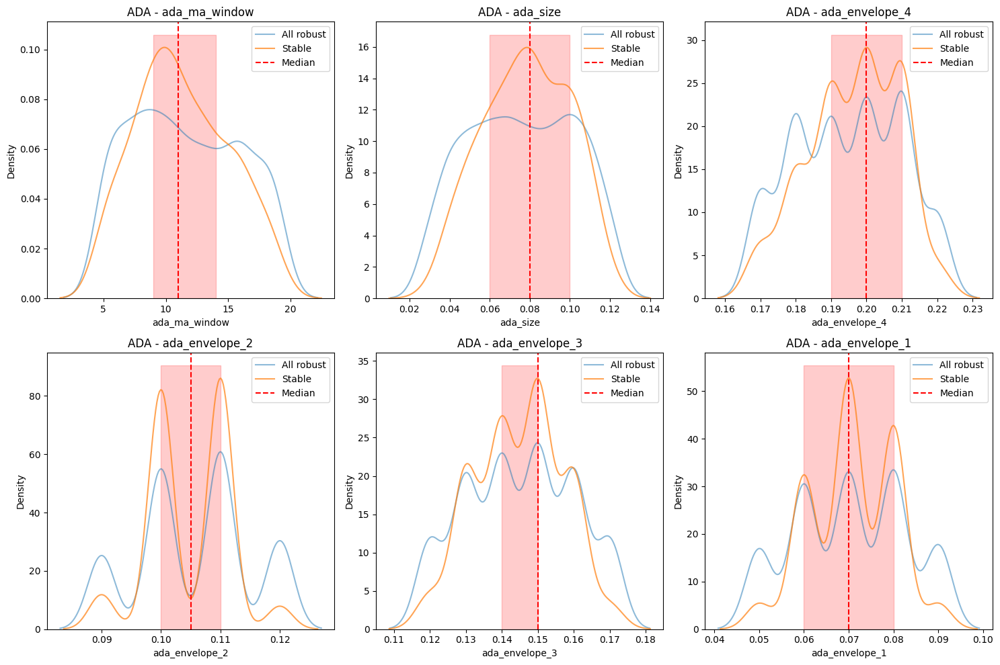


==================== BTC ====================

Analyzing parameters for BTC:
- btc_ma_window
- btc_size
- btc_envelope_3
- btc_envelope_1
- btc_envelope_2

Found 334 stable parameter sets for BTC

Parameter distributions in stable regions for BTC:

ma_window:
Stable range: [8.0000, 14.0000]
Mean ± Std: 11.3204 ± 3.8040

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0754 ± 0.0209

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1445 ± 0.0109

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0710 ± 0.0085

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1051 ± 0.0059


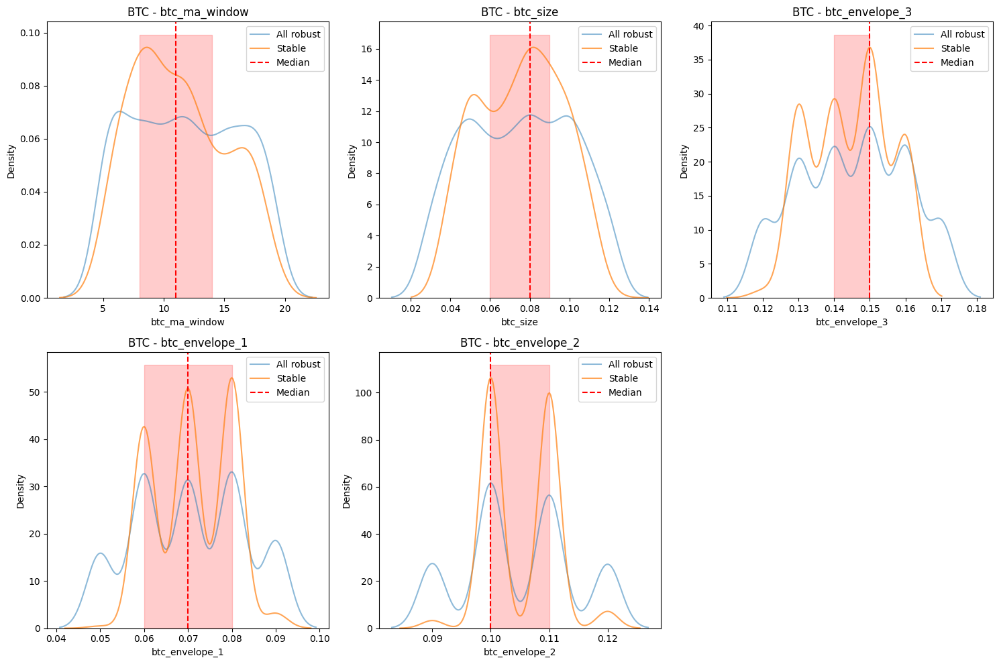


==================== OP ====================

Analyzing parameters for OP:
- op_ma_window
- op_envelope_1
- op_size
- op_envelope_3
- op_envelope_2

Found 334 stable parameter sets for OP

Parameter distributions in stable regions for OP:

ma_window:
Stable range: [9.0000, 16.0000]
Mean ± Std: 12.1317 ± 3.8936

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0690 ± 0.0088

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0716 ± 0.0202

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1455 ± 0.0121

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1049 ± 0.0067


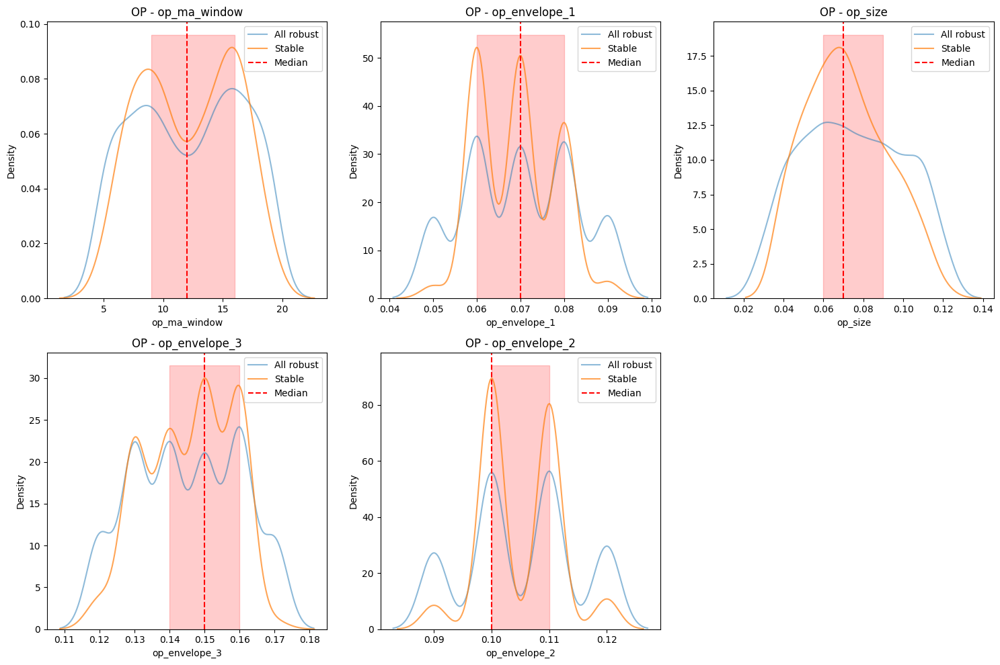


==================== DOGE ====================

Analyzing parameters for DOGE:
- doge_ma_window
- doge_size
- doge_envelope_3
- doge_envelope_4
- doge_envelope_1
- doge_envelope_2

Found 334 stable parameter sets for DOGE

Parameter distributions in stable regions for DOGE:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.1018 ± 3.7619

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0807 ± 0.0235

envelope_3:
Stable range: [0.1300, 0.1500]
Mean ± Std: 0.1440 ± 0.0117

envelope_4:
Stable range: [0.1825, 0.2000]
Mean ± Std: 0.1941 ± 0.0113

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0705 ± 0.0091

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1058 ± 0.0066


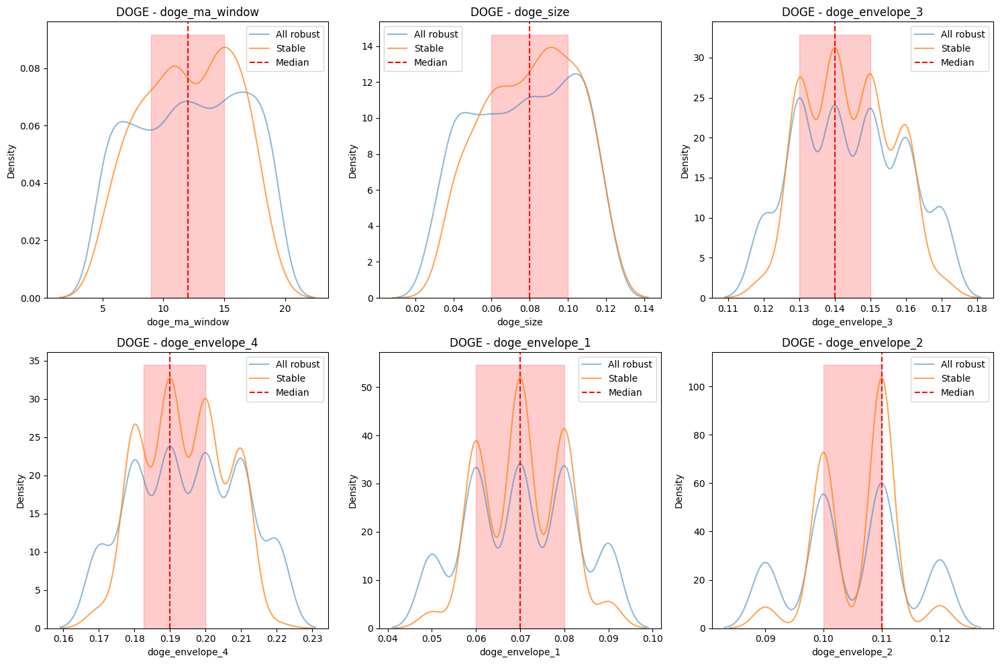


==================== EGLD ====================

Analyzing parameters for EGLD:
- egld_ma_window
- egld_size
- egld_envelope_3
- egld_envelope_4
- egld_envelope_1
- egld_envelope_2

Found 334 stable parameter sets for EGLD

Parameter distributions in stable regions for EGLD:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.0329 ± 3.7563

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0758 ± 0.0222

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1472 ± 0.0117

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1952 ± 0.0121

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0688 ± 0.0102

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1049 ± 0.0059


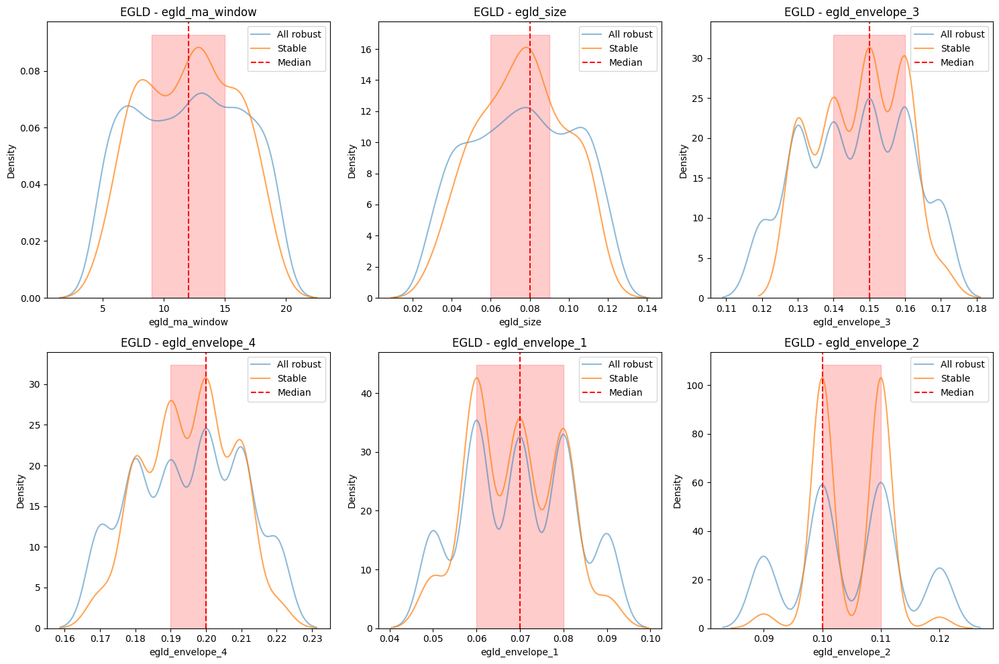


==================== SUI ====================

Analyzing parameters for SUI:
- sui_ma_window
- sui_size
- sui_envelope_3
- sui_envelope_1
- sui_envelope_2

Found 334 stable parameter sets for SUI

Parameter distributions in stable regions for SUI:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 11.8563 ± 3.5349

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0766 ± 0.0213

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1453 ± 0.0117

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0705 ± 0.0092

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1043 ± 0.0065


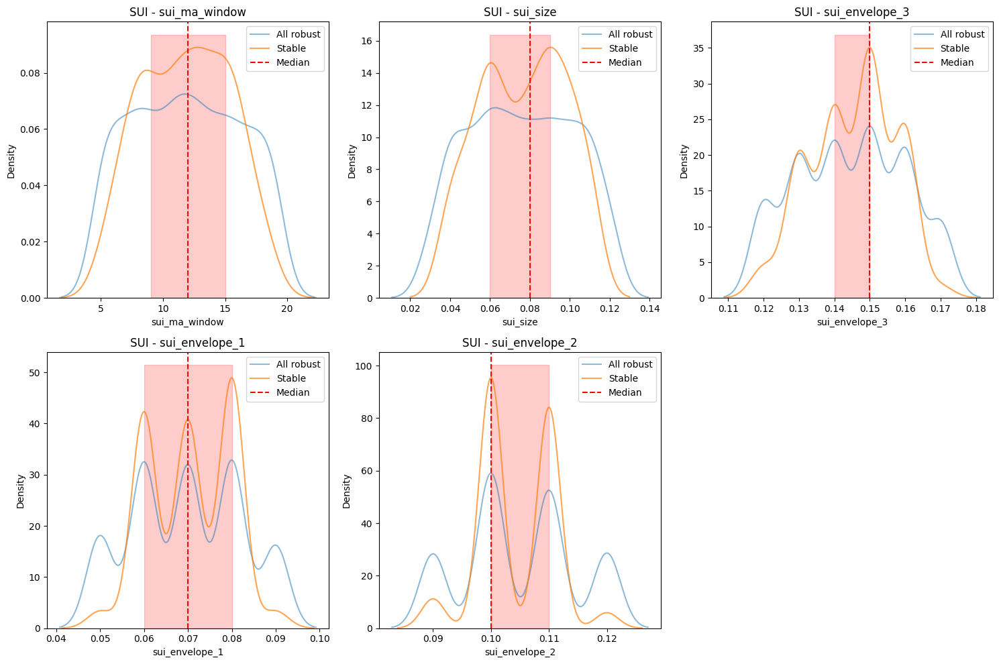


==================== ENJ ====================

Analyzing parameters for ENJ:
- enj_ma_window
- enj_size
- enj_envelope_4
- enj_envelope_3
- enj_envelope_1
- enj_envelope_2

Found 334 stable parameter sets for ENJ

Parameter distributions in stable regions for ENJ:

ma_window:
Stable range: [9.2500, 15.0000]
Mean ± Std: 12.0808 ± 3.6477

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0771 ± 0.0239

envelope_4:
Stable range: [0.1900, 0.2100]
Mean ± Std: 0.1966 ± 0.0124

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1465 ± 0.0122

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0684 ± 0.0097

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1048 ± 0.0061


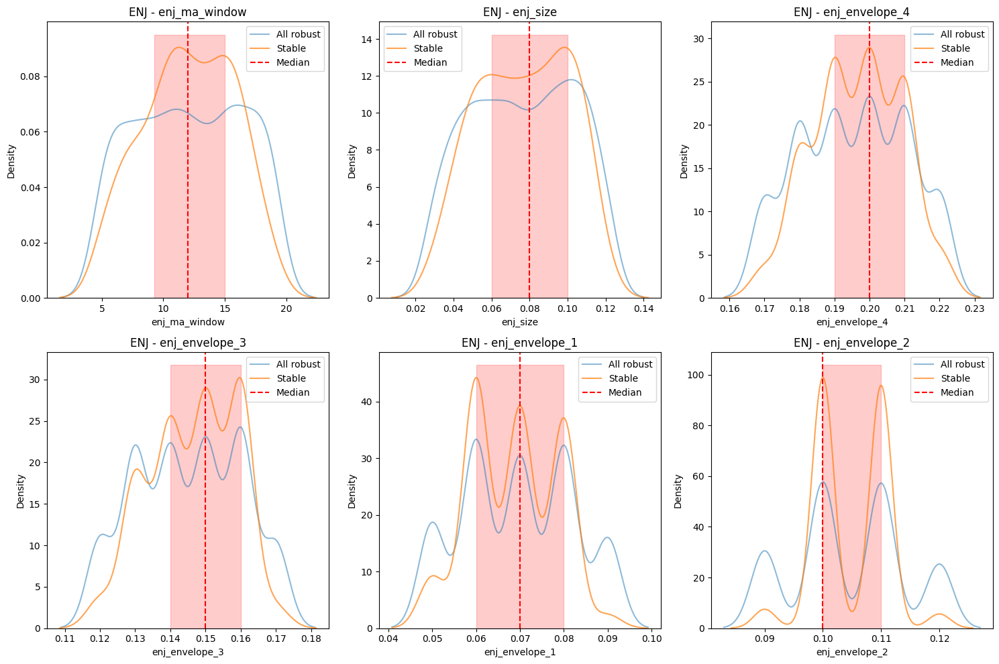


==================== IMX ====================

Analyzing parameters for IMX:
- imx_ma_window
- imx_size
- imx_envelope_3
- imx_envelope_4
- imx_envelope_1
- imx_envelope_2

Found 334 stable parameter sets for IMX

Parameter distributions in stable regions for IMX:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 11.9192 ± 3.8080

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0761 ± 0.0220

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1472 ± 0.0118

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1955 ± 0.0114

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0700 ± 0.0095

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1034 ± 0.0065


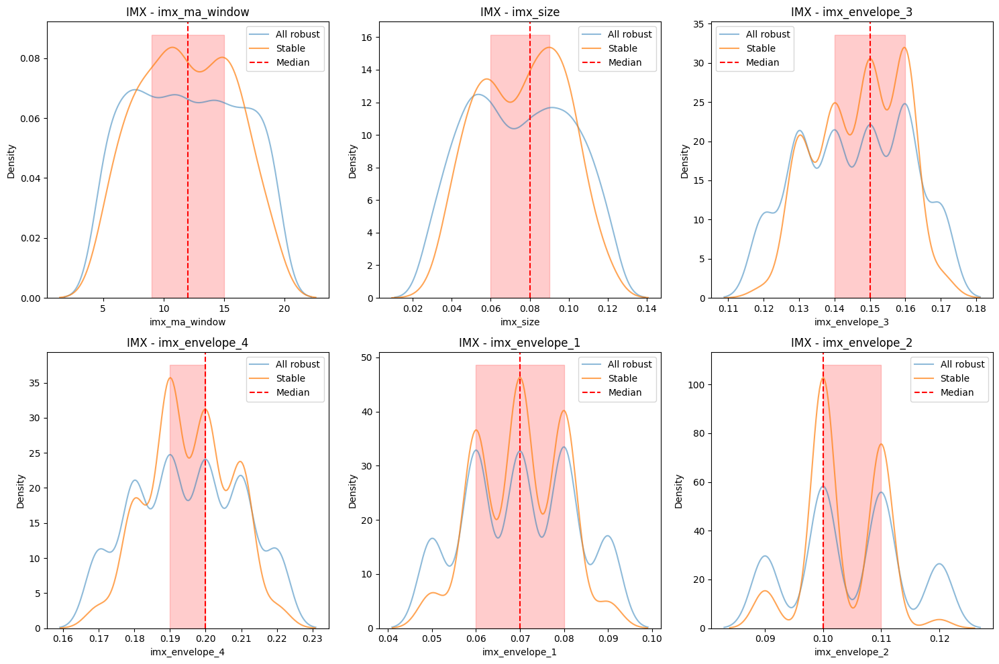


==================== FET ====================

Analyzing parameters for FET:
- fet_ma_window
- fet_size
- fet_envelope_4
- fet_envelope_3
- fet_envelope_1
- fet_envelope_2

Found 334 stable parameter sets for FET

Parameter distributions in stable regions for FET:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.1377 ± 3.5070

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0768 ± 0.0227

envelope_4:
Stable range: [0.1825, 0.2100]
Mean ± Std: 0.1951 ± 0.0119

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1448 ± 0.0109

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0722 ± 0.0096

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1048 ± 0.0072


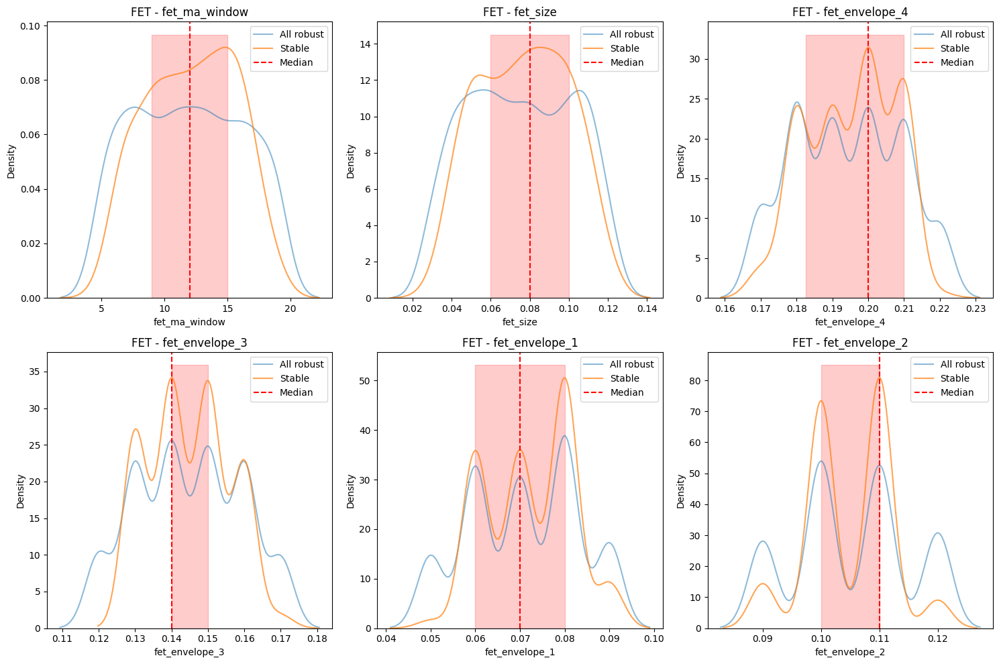


==================== ENS ====================

Analyzing parameters for ENS:
- ens_ma_window
- ens_size
- ens_envelope_3
- ens_envelope_1
- ens_envelope_2

Found 334 stable parameter sets for ENS

Parameter distributions in stable regions for ENS:

ma_window:
Stable range: [9.0000, 15.7500]
Mean ± Std: 12.3503 ± 3.7078

size:
Stable range: [0.0500, 0.0800]
Mean ± Std: 0.0663 ± 0.0211

envelope_3:
Stable range: [0.1300, 0.1500]
Mean ± Std: 0.1426 ± 0.0113

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0699 ± 0.0092

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1044 ± 0.0057


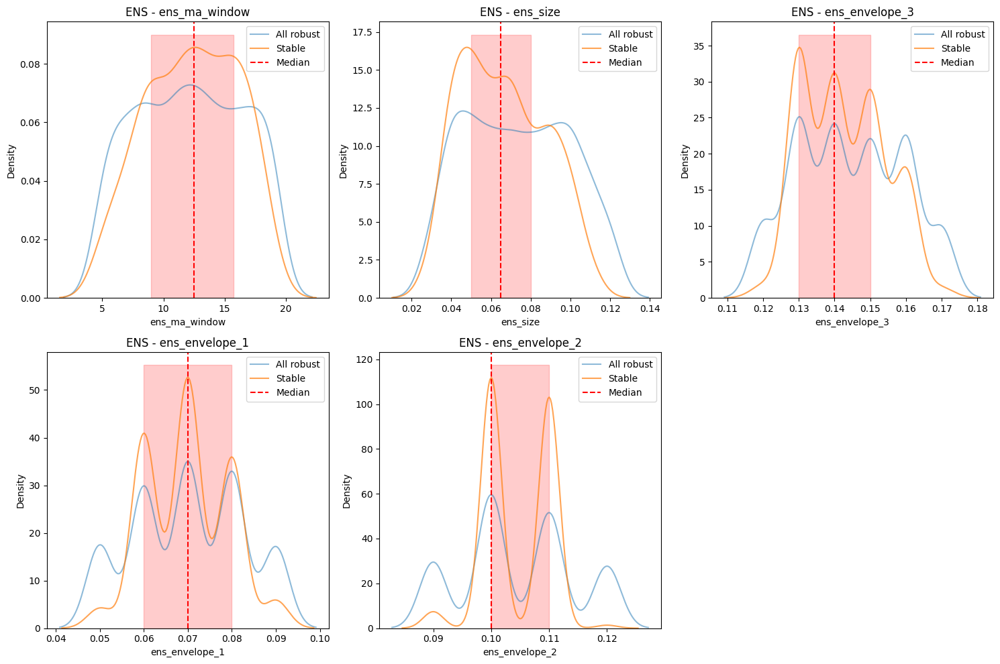


==================== ICP ====================

Analyzing parameters for ICP:
- icp_ma_window
- icp_size
- icp_envelope_4
- icp_envelope_1
- icp_envelope_3
- icp_envelope_2

Found 334 stable parameter sets for ICP

Parameter distributions in stable regions for ICP:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.0359 ± 3.6792

size:
Stable range: [0.0500, 0.0900]
Mean ± Std: 0.0710 ± 0.0206

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1952 ± 0.0122

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0692 ± 0.0094

envelope_3:
Stable range: [0.1300, 0.1500]
Mean ± Std: 0.1443 ± 0.0121

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1046 ± 0.0070


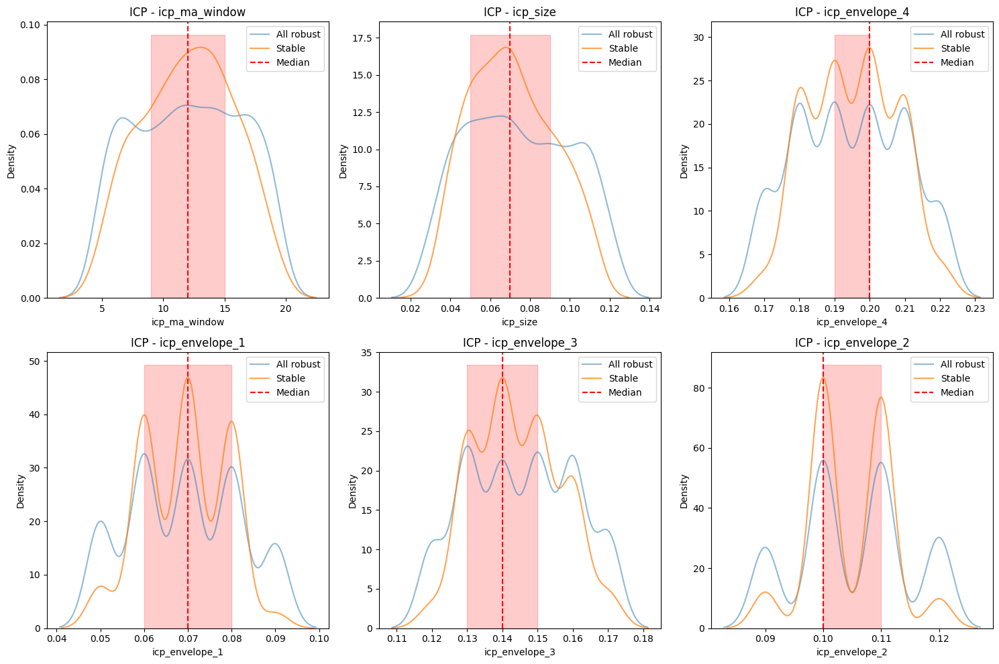


==================== APE ====================

Analyzing parameters for APE:
- ape_ma_window
- ape_size
- ape_envelope_3
- ape_envelope_4
- ape_envelope_1
- ape_envelope_2

Found 334 stable parameter sets for APE

Parameter distributions in stable regions for APE:

ma_window:
Stable range: [8.0000, 15.0000]
Mean ± Std: 11.3144 ± 3.9759

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0754 ± 0.0212

envelope_3:
Stable range: [0.1300, 0.1500]
Mean ± Std: 0.1438 ± 0.0122

envelope_4:
Stable range: [0.1900, 0.2100]
Mean ± Std: 0.1966 ± 0.0118

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0717 ± 0.0095

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1057 ± 0.0065


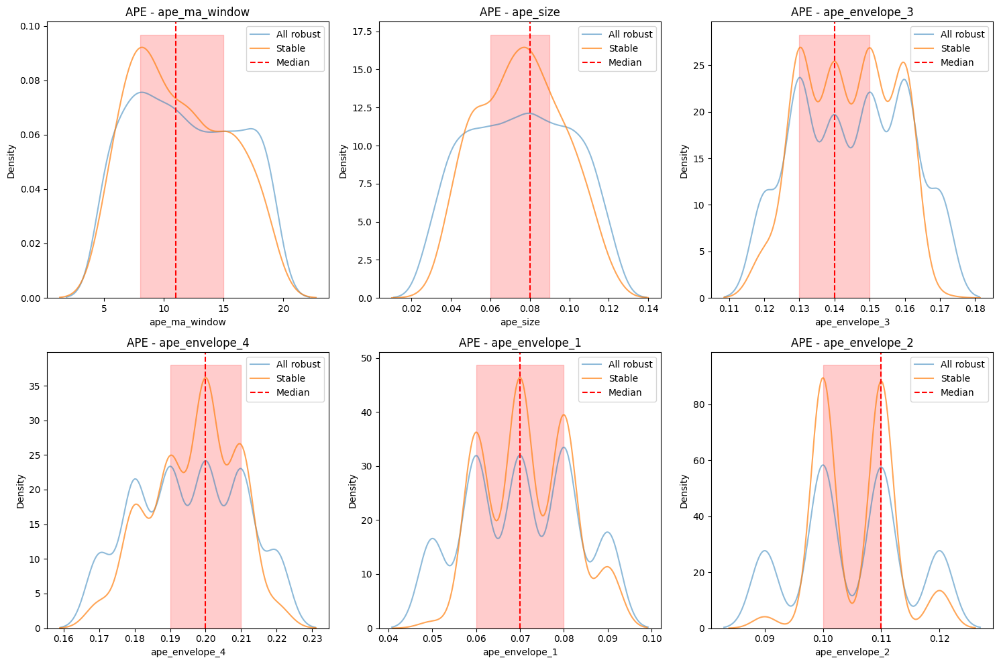


==================== ACH ====================

Analyzing parameters for ACH:
- ach_ma_window
- ach_size
- ach_envelope_4
- ach_envelope_1
- ach_envelope_3
- ach_envelope_2

Found 334 stable parameter sets for ACH

Parameter distributions in stable regions for ACH:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.0329 ± 3.8135

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0737 ± 0.0225

envelope_4:
Stable range: [0.1900, 0.2000]
Mean ± Std: 0.1940 ± 0.0116

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0697 ± 0.0098

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1460 ± 0.0119

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1057 ± 0.0066


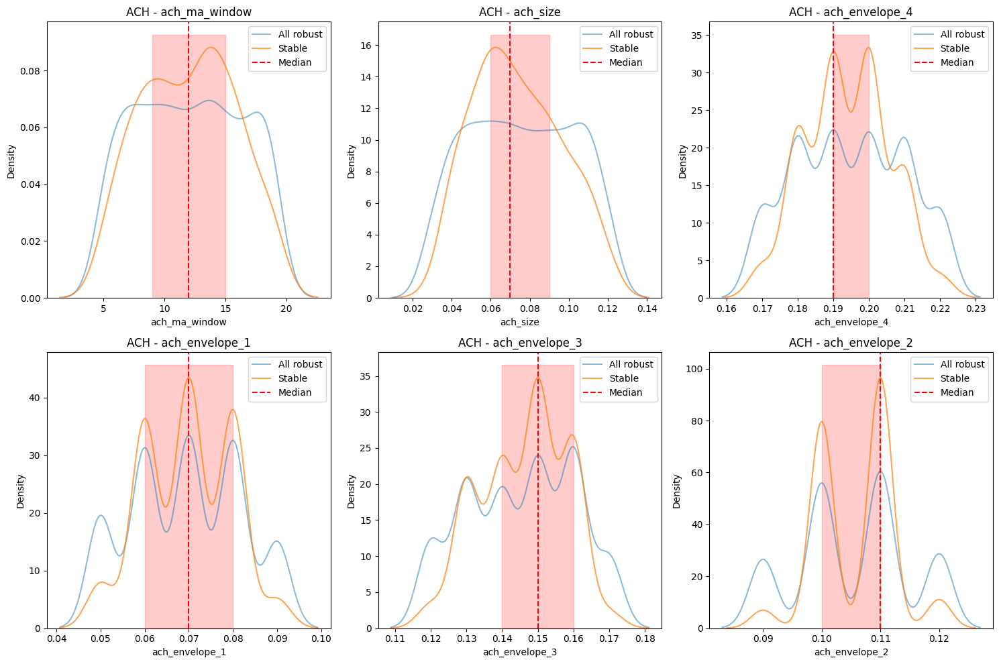


==================== LDO ====================

Analyzing parameters for LDO:
- ldo_size
- ldo_ma_window
- ldo_envelope_3
- ldo_envelope_4
- ldo_envelope_1
- ldo_envelope_2

Found 334 stable parameter sets for LDO

Parameter distributions in stable regions for LDO:

size:
Stable range: [0.0600, 0.1000]
Mean ± Std: 0.0766 ± 0.0236

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.1587 ± 3.6796

envelope_3:
Stable range: [0.1400, 0.1600]
Mean ± Std: 0.1471 ± 0.0109

envelope_4:
Stable range: [0.1800, 0.2000]
Mean ± Std: 0.1942 ± 0.0127

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0705 ± 0.0094

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1052 ± 0.0061


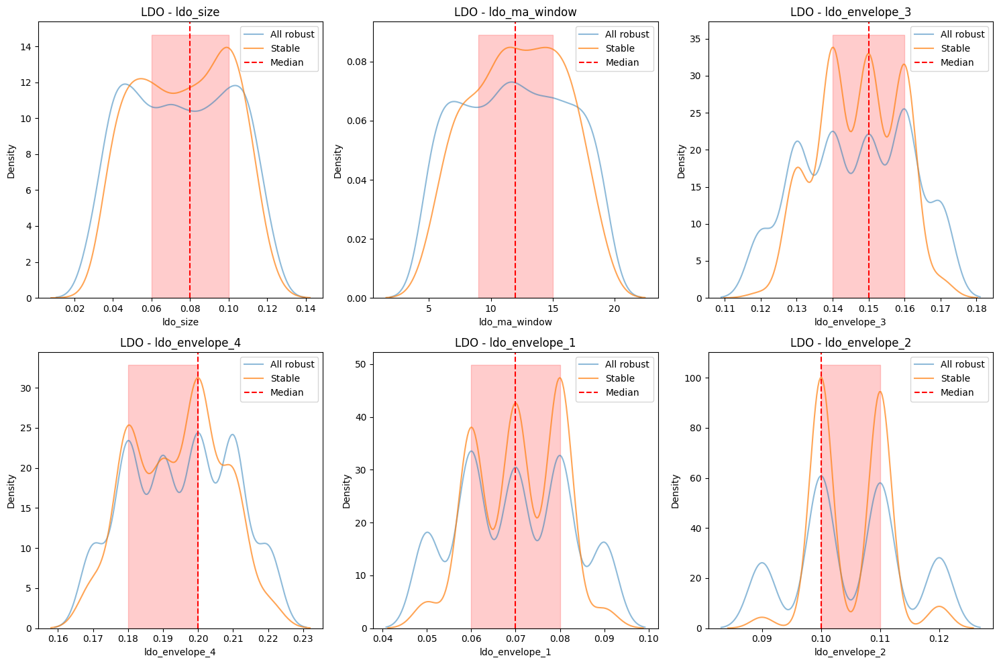


==================== MAGIC ====================

Analyzing parameters for MAGIC:
- magic_ma_window
- magic_size
- magic_envelope_1
- magic_envelope_3
- magic_envelope_4
- magic_envelope_2

Found 334 stable parameter sets for MAGIC

Parameter distributions in stable regions for MAGIC:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 11.8234 ± 3.9617

size:
Stable range: [0.0600, 0.0900]
Mean ± Std: 0.0766 ± 0.0226

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0691 ± 0.0099

envelope_3:
Stable range: [0.1400, 0.1500]
Mean ± Std: 0.1449 ± 0.0121

envelope_4:
Stable range: [0.1800, 0.2000]
Mean ± Std: 0.1931 ± 0.0116

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1045 ± 0.0068


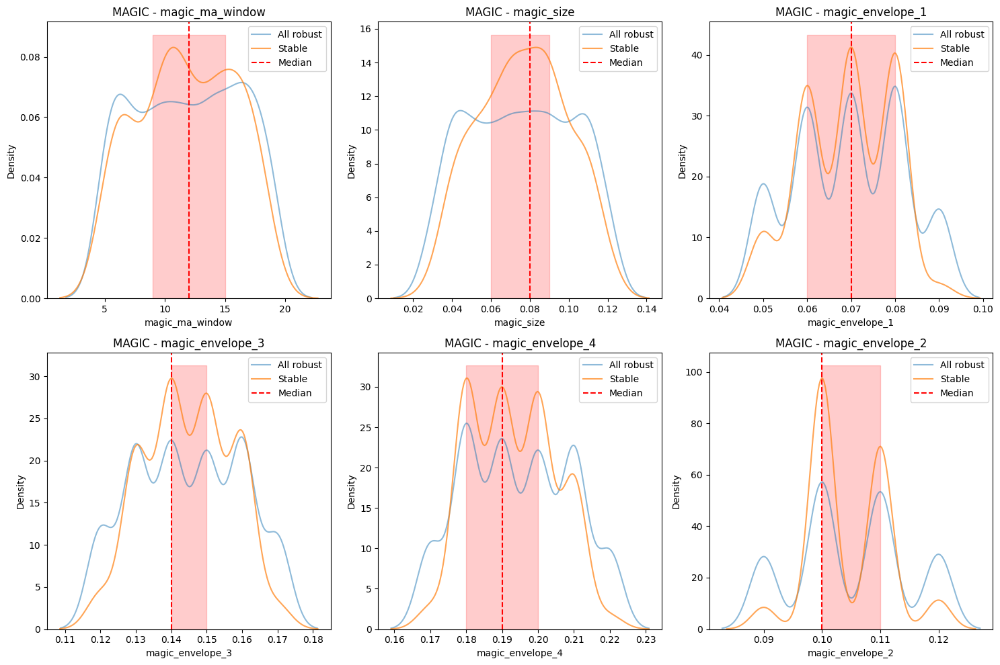


==================== KSM ====================

Analyzing parameters for KSM:
- ksm_ma_window
- ksm_size
- ksm_envelope_1
- ksm_envelope_4
- ksm_envelope_3
- ksm_envelope_2

Found 334 stable parameter sets for KSM

Parameter distributions in stable regions for KSM:

ma_window:
Stable range: [9.0000, 15.0000]
Mean ± Std: 12.0389 ± 3.5660

size:
Stable range: [0.0500, 0.0900]
Mean ± Std: 0.0711 ± 0.0226

envelope_1:
Stable range: [0.0600, 0.0800]
Mean ± Std: 0.0706 ± 0.0089

envelope_4:
Stable range: [0.1800, 0.2000]
Mean ± Std: 0.1938 ± 0.0128

envelope_3:
Stable range: [0.1300, 0.1600]
Mean ± Std: 0.1451 ± 0.0126

envelope_2:
Stable range: [0.1000, 0.1100]
Mean ± Std: 0.1048 ± 0.0063


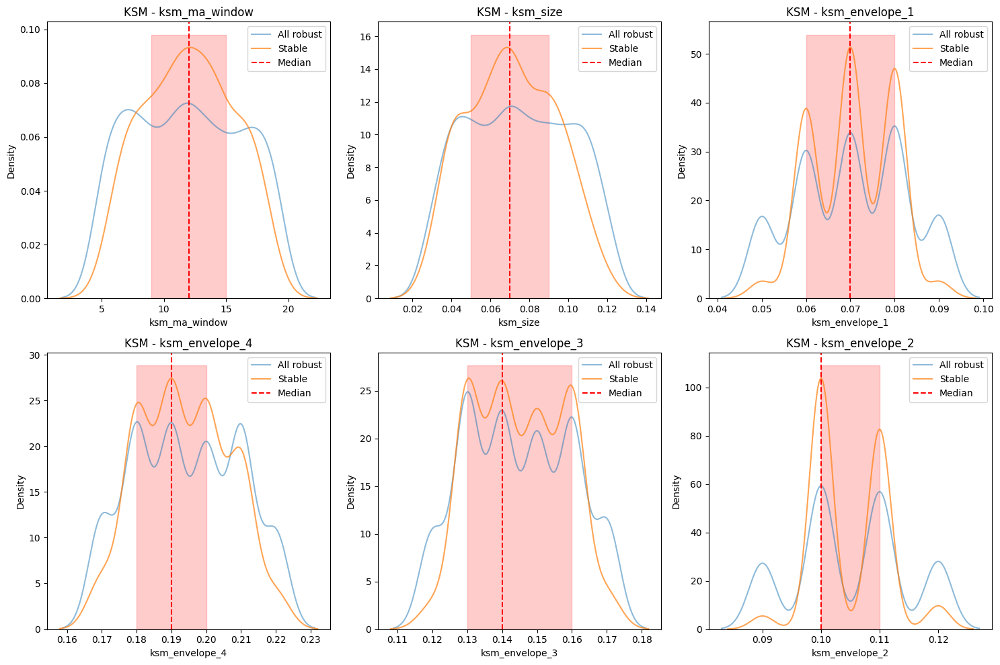


=== Summary of Stable Parameters ===
Total stable parameter sets: 8685
Number of coins analyzed: 26


In [14]:
from scipy.stats import gaussian_kde
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def apply_gaussian_filtering(robust_params, feature_importance):
    """Apply Gaussian filtering to find stable parameter clusters for each coin"""
    print("\n=== Gaussian Filtering Phase ===")
    
    # Group features by coin
    coin_features = {}
    for feature in feature_importance['feature']:
        coin = feature.split('_')[0]
        if coin not in coin_features:
            coin_features[coin] = []
        coin_features[coin].append(feature)
    
    all_stable_params = pd.DataFrame()
    all_stable_ranges = {}
    
    # Process each coin separately
    for coin, features in coin_features.items():
        print(f"\n{'='*20} {coin.upper()} {'='*20}")
        
        # Get features for this coin
        coin_features_sorted = feature_importance[feature_importance['feature'].isin(features)]
        top_features = coin_features_sorted['feature'].tolist()
        
        print(f"\nAnalyzing parameters for {coin.upper()}:")
        for f in top_features:
            print(f"- {f}")
        
        # Standardize the parameters
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(robust_params[top_features])
        
        # Apply PCA if necessary
        if X_scaled.shape[1] > X_scaled.shape[0] // 2:
            print(f"\nReducing dimensionality with PCA for {coin}...")
            pca = PCA(n_components=min(X_scaled.shape[0] // 2, X_scaled.shape[1]))
            X_scaled = pca.fit_transform(X_scaled)
        
        # Apply KDE to find parameter density
        try:
            kde = gaussian_kde(X_scaled.T)
            density_scores = kde.evaluate(X_scaled.T)
        except ValueError:
            print(f"\nFalling back to simplified density estimation for {coin}...")
            from sklearn.neighbors import KernelDensity
            kde = KernelDensity(kernel='gaussian', bandwidth=0.5)
            kde.fit(X_scaled)
            density_scores = np.exp(kde.score_samples(X_scaled))
        
        # Find stable parameter sets
        stability_threshold = np.percentile(density_scores, 70)
        stable_mask = density_scores >= stability_threshold
        
        # Store stable parameters for this coin
        coin_stable_params = robust_params[stable_mask].copy()
        coin_stable_params['density_score'] = density_scores[stable_mask]
        
        print(f"\nFound {len(coin_stable_params)} stable parameter sets for {coin.upper()}")
        
        # Analyze stable parameter distributions for this coin
        all_stable_ranges[coin] = {}
        print(f"\nParameter distributions in stable regions for {coin.upper()}:")
        
        for feature in top_features:
            values = coin_stable_params[feature]
            all_stable_ranges[coin][feature] = {
                'mean': values.mean(),
                'std': values.std(),
                'median': values.median(),
                'q25': values.quantile(0.25),
                'q75': values.quantile(0.75)
            }
            
            param_type = '_'.join(feature.split('_')[1:])
            print(f"\n{param_type}:")
            print(f"Stable range: [{all_stable_ranges[coin][feature]['q25']:.4f}, "
                  f"{all_stable_ranges[coin][feature]['q75']:.4f}]")
            print(f"Mean ± Std: {all_stable_ranges[coin][feature]['mean']:.4f} ± "
                  f"{all_stable_ranges[coin][feature]['std']:.4f}")
        
        # Visualize stable parameter distributions for this coin
        n_features = len(top_features)
        n_cols = min(3, n_features)
        n_rows = (n_features + n_cols - 1) // n_cols
        
        plt.figure(figsize=(15, 5 * n_rows))
        for i, feature in enumerate(top_features):
            plt.subplot(n_rows, n_cols, i+1)
            sns.kdeplot(data=robust_params[feature], label='All robust', alpha=0.5)
            sns.kdeplot(data=coin_stable_params[feature], label='Stable', alpha=0.7)
            plt.axvline(all_stable_ranges[coin][feature]['median'], 
                       color='r', linestyle='--', label='Median')
            plt.fill_between([all_stable_ranges[coin][feature]['q25'], 
                            all_stable_ranges[coin][feature]['q75']], 
                           0, plt.ylim()[1], alpha=0.2, color='r')
            plt.title(f'{coin.upper()} - {feature}')
            plt.legend()
        plt.tight_layout()
        plt.show()
        
        # Append to all stable parameters
        if len(all_stable_params) == 0:
            all_stable_params = coin_stable_params
        else:
            all_stable_params = pd.concat([all_stable_params, coin_stable_params])
    
    print("\n=== Summary of Stable Parameters ===")
    print(f"Total stable parameter sets: {len(all_stable_params)}")
    print(f"Number of coins analyzed: {len(coin_features)}")
    
    return all_stable_params, all_stable_ranges

# Apply Gaussian filtering
stable_params, stable_ranges = apply_gaussian_filtering(robust_params, feature_importance)

In [15]:
stable_params

,btc_ma_window,btc_size,btc_envelope_1,btc_envelope_2,btc_envelope_3,eth_ma_window,eth_size,eth_envelope_1,eth_envelope_2,eth_envelope_3,...,dot_size,dot_envelope_1,dot_envelope_2,dot_envelope_3,op_ma_window,op_size,op_envelope_1,op_envelope_2,op_envelope_3,density_score
8,10,0.06,0.09,0.12,0.16,8,0.04,0.07,0.11,0.15,...,0.03,0.05,0.10,0.15,10,0.06,0.08,0.09,0.15,0.002370
9,7,0.05,0.09,0.10,0.12,9,0.10,0.09,0.12,0.14,...,0.08,0.06,0.10,0.15,9,0.10,0.05,0.09,0.16,0.002692
13,10,0.05,0.09,0.12,0.14,10,0.08,0.06,0.11,0.16,...,0.08,0.09,0.11,0.16,5,0.12,0.05,0.10,0.13,0.002340
15,17,0.07,0.07,0.12,0.17,10,0.07,0.08,0.10,0.17,...,0.08,0.06,0.10,0.14,13,0.08,0.08,0.11,0.16,0.002408
16,11,0.09,0.06,0.12,0.16,9,0.04,0.07,0.10,0.14,...,0.12,0.05,0.11,0.13,18,0.07,0.08,0.10,0.17,0.002994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2899,6,0.08,0.09,0.12,0.13,11,0.03,0.05,0.11,0.17,...,0.10,0.06,0.12,0.15,6,0.06,0.08,0.12,0.15,0.001107
2928,6,0.05,0.05,0.10,0.16,7,0.12,0.07,0.09,0.17,...,0.07,0.08,0.09,0.13,10,0.05,0.06,0.09,0.13,0.001115
2934,10,0.07,0.06,0.10,0.15,19,0.04,0.07,0.10,0.13,...,0.06,0.06,0.09,0.13,19,0.09,0.06,0.12,0.16,0.000826
3058,12,0.10,0.07,0.10,0.13,13,0.06,0.07,0.12,0.13,...,0.09,0.07,0.09,0.15,5,0.10,0.09,0.12,0.16,0.000696


Extract directly best from KDE peak (1 time) BEST


=== Peak Detection Optimization ===

==================== LINK ====================
link_ma_window: Detected 1 peaks, selecting 7.9710


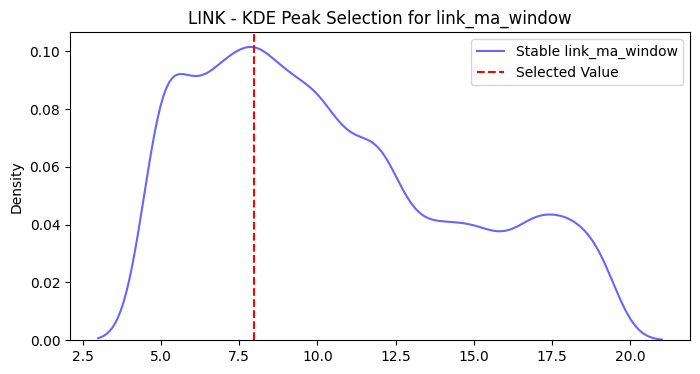

link_size: Detected 0 peaks, selecting 0.0700


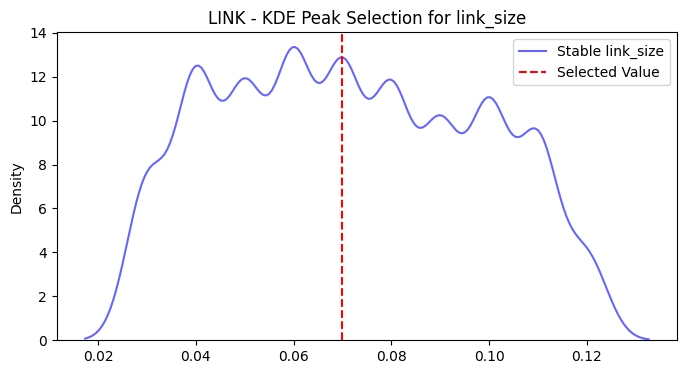

link_envelope_3: Detected 0 peaks, selecting 0.1500


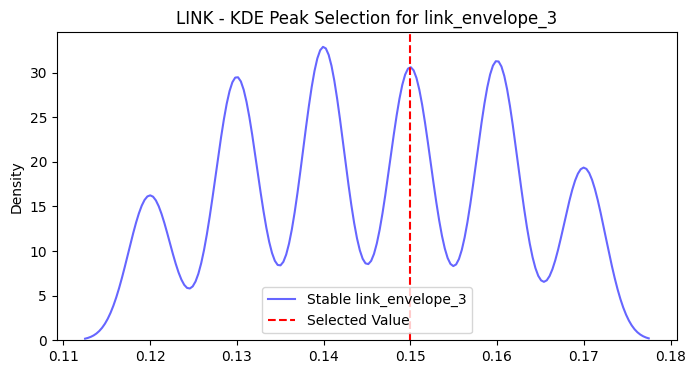

link_envelope_2: Detected 0 peaks, selecting 0.1100


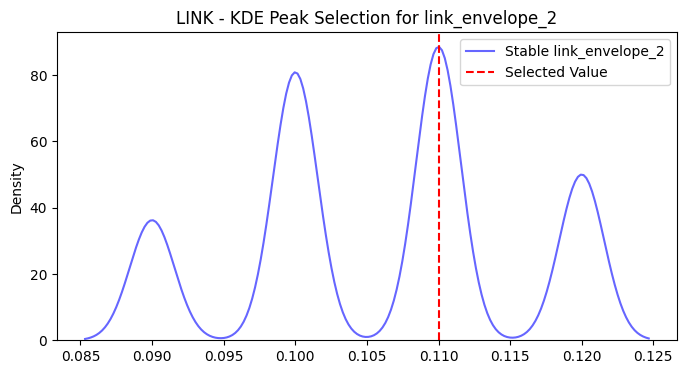

link_envelope_1: Detected 0 peaks, selecting 0.0700


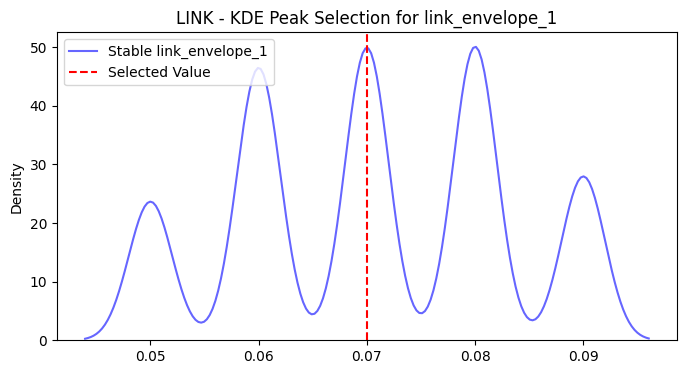


Optimized Parameters for LINK:
ma_window: 7.9710
size: 0.0700
envelope_3: 0.1500
envelope_2: 0.1100
envelope_1: 0.0700

==================== DOT ====================
dot_ma_window: Detected 1 peaks, selecting 16.0150


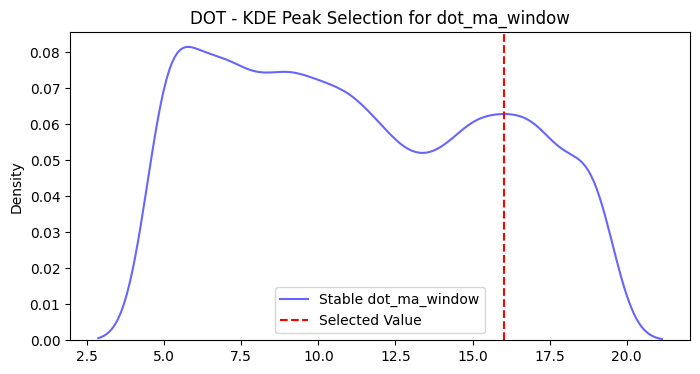

dot_size: Detected 0 peaks, selecting 0.0700


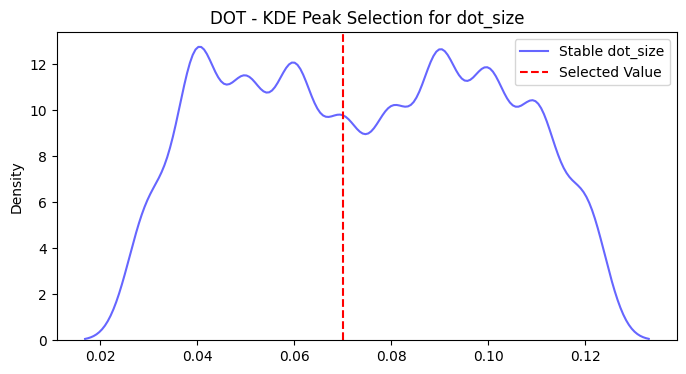

dot_envelope_3: Detected 0 peaks, selecting 0.1500


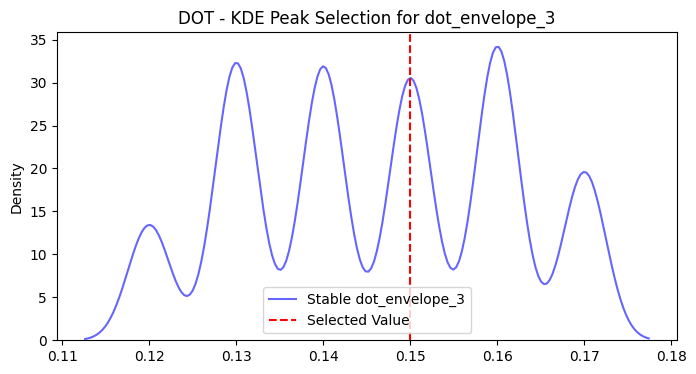

dot_envelope_1: Detected 0 peaks, selecting 0.0700


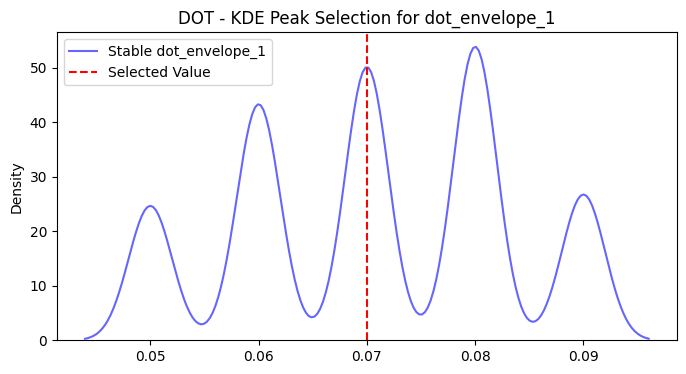

dot_envelope_2: Detected 0 peaks, selecting 0.1100


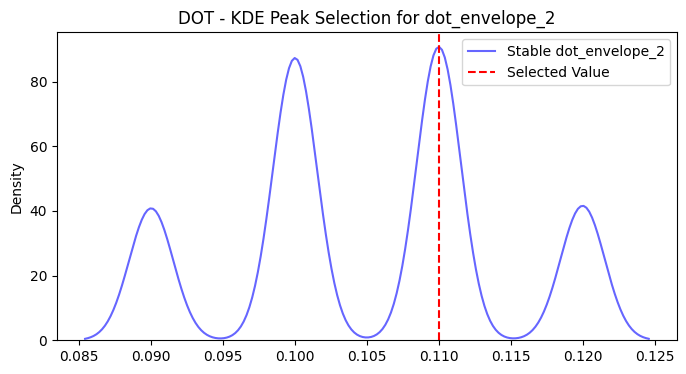


Optimized Parameters for DOT:
ma_window: 16.0150
size: 0.0700
envelope_3: 0.1500
envelope_1: 0.0700
envelope_2: 0.1100

==================== SOL ====================
sol_ma_window: Detected 2 peaks, selecting 5.9950


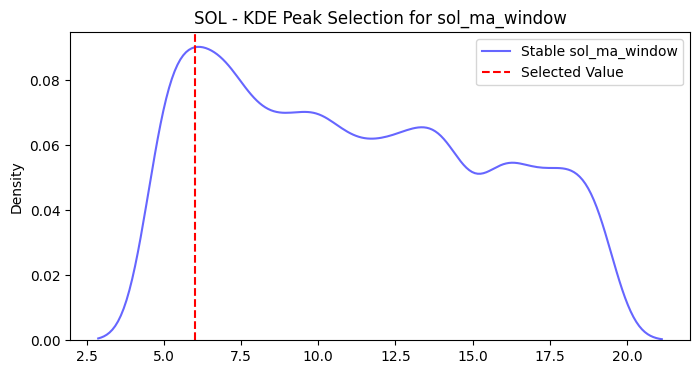

sol_size: Detected 0 peaks, selecting 0.0800


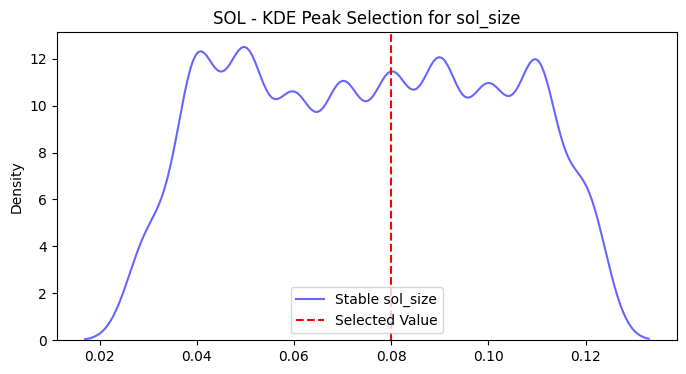

sol_envelope_3: Detected 0 peaks, selecting 0.1400


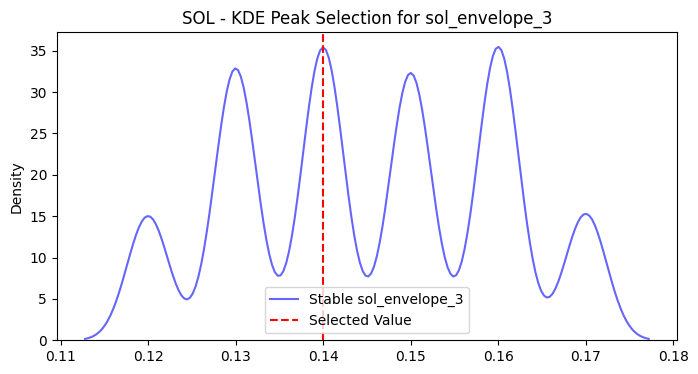

sol_envelope_1: Detected 0 peaks, selecting 0.0700


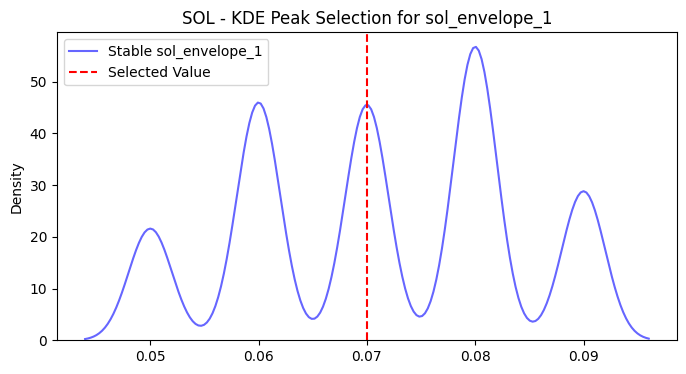

sol_envelope_2: Detected 0 peaks, selecting 0.1000


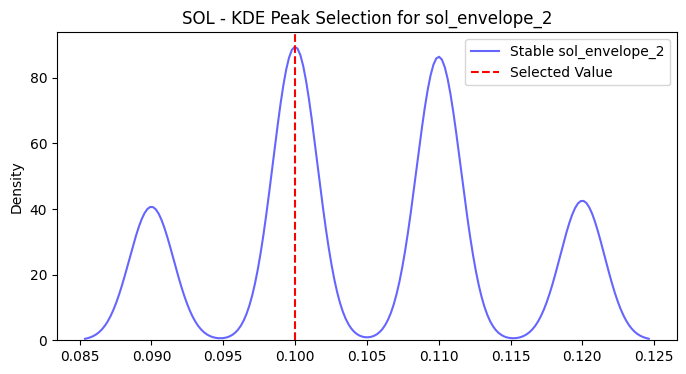


Optimized Parameters for SOL:
ma_window: 5.9950
size: 0.0800
envelope_3: 0.1400
envelope_1: 0.0700
envelope_2: 0.1000

==================== XTZ ====================
xtz_ma_window: Detected 2 peaks, selecting 15.9029


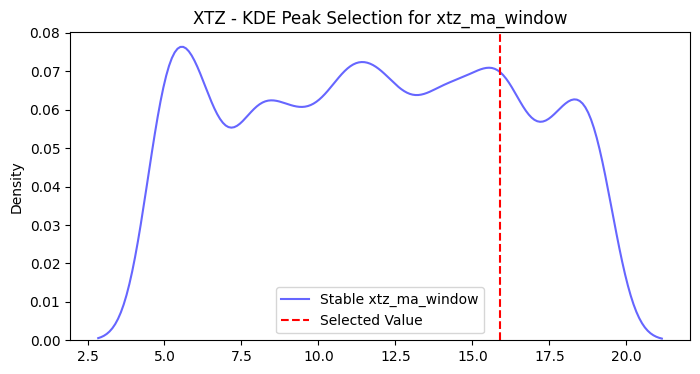

xtz_size: Detected 0 peaks, selecting 0.0700


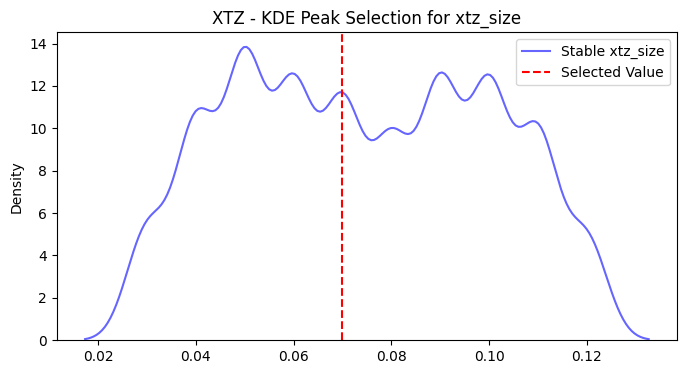

xtz_envelope_1: Detected 0 peaks, selecting 0.0700


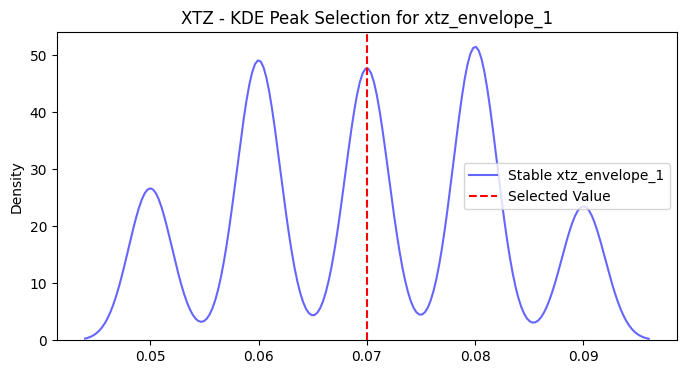

xtz_envelope_4: Detected 0 peaks, selecting 0.2000


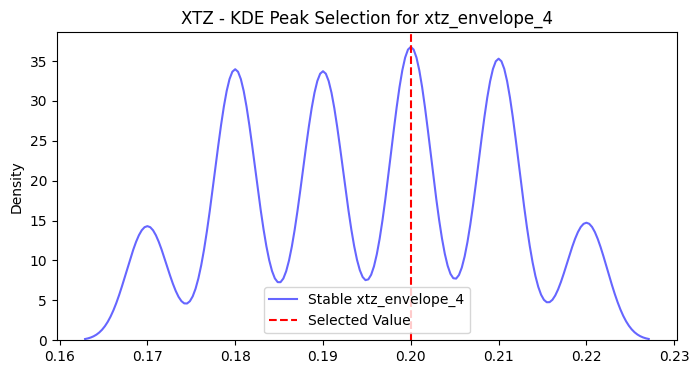

xtz_envelope_3: Detected 0 peaks, selecting 0.1500


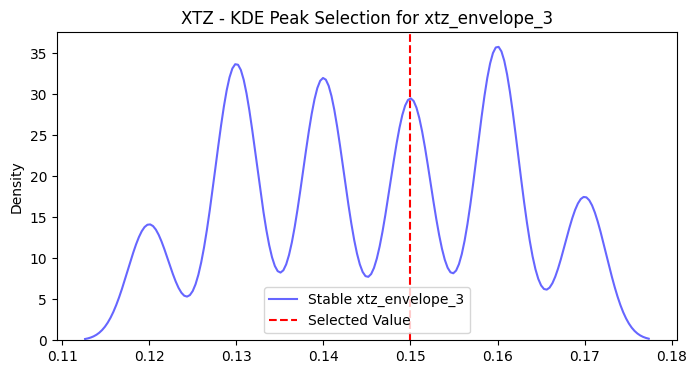

xtz_envelope_2: Detected 0 peaks, selecting 0.1000


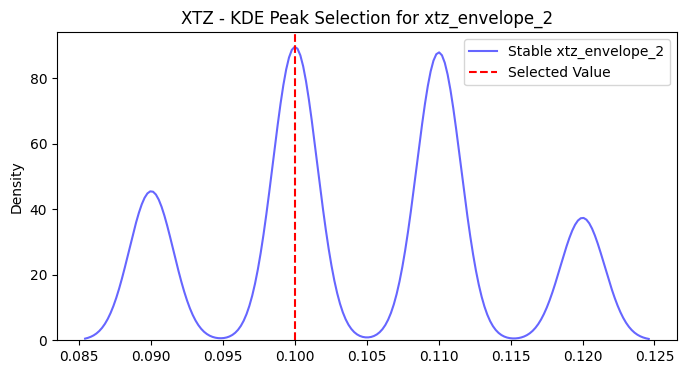


Optimized Parameters for XTZ:
ma_window: 15.9029
size: 0.0700
envelope_1: 0.0700
envelope_4: 0.2000
envelope_3: 0.1500
envelope_2: 0.1000

==================== ETH ====================
eth_ma_window: Detected 2 peaks, selecting 6.9479


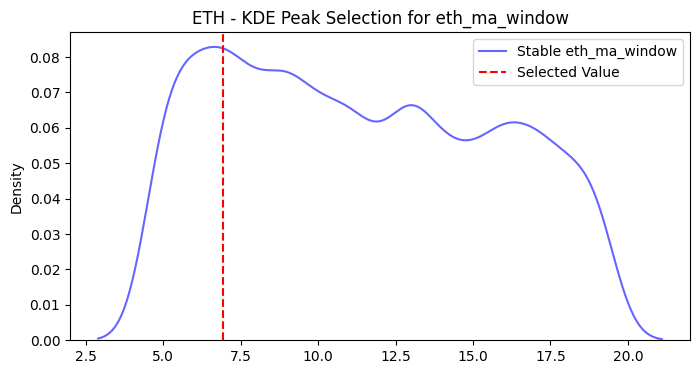

eth_envelope_1: Detected 0 peaks, selecting 0.0700


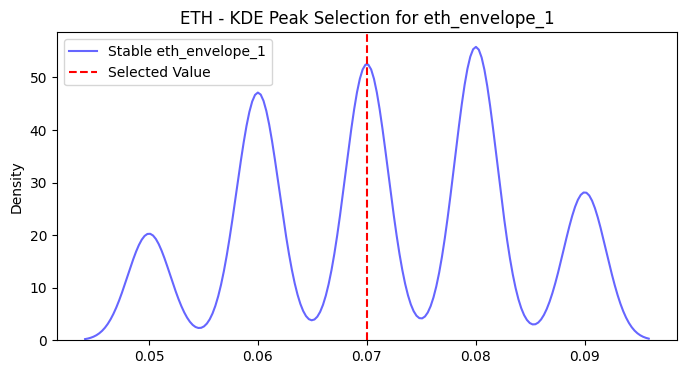

eth_size: Detected 0 peaks, selecting 0.0800


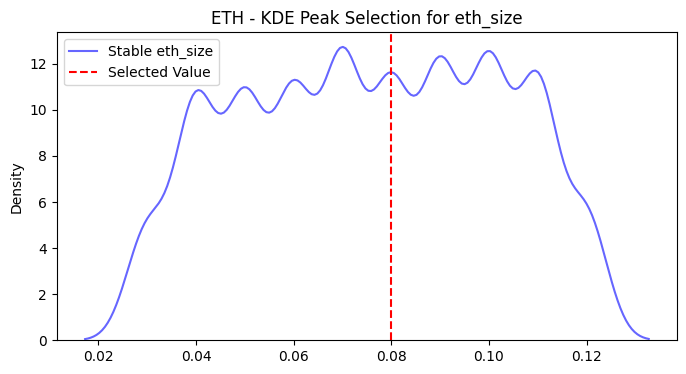

eth_envelope_2: Detected 0 peaks, selecting 0.1000


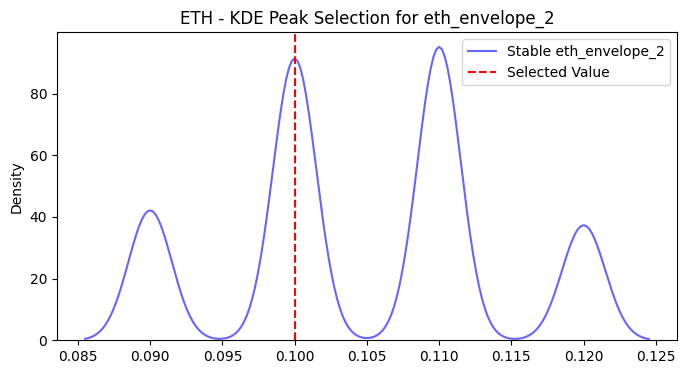

eth_envelope_3: Detected 0 peaks, selecting 0.1500


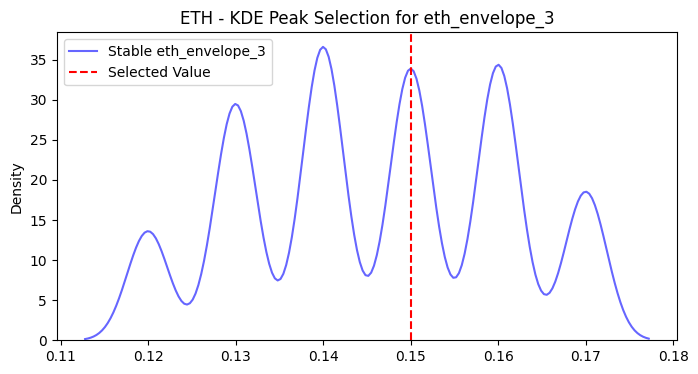


Optimized Parameters for ETH:
ma_window: 6.9479
envelope_1: 0.0700
size: 0.0800
envelope_2: 0.1000
envelope_3: 0.1500

==================== ARB ====================
arb_ma_window: Detected 3 peaks, selecting 7.9429


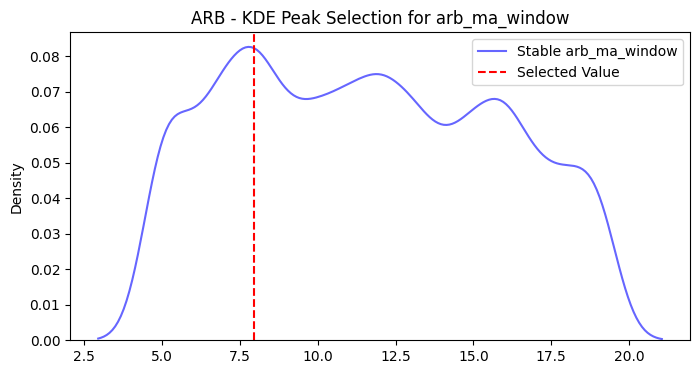

arb_size: Detected 0 peaks, selecting 0.0700


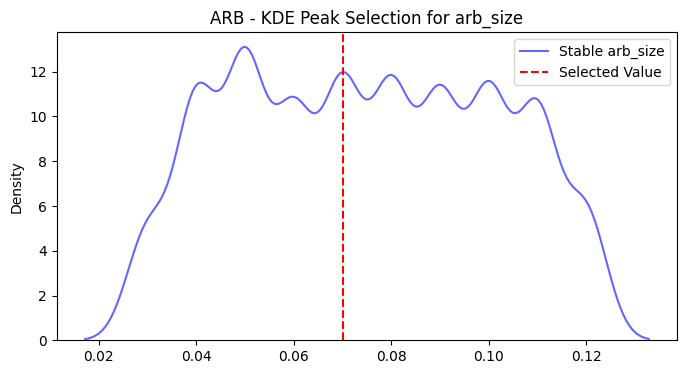

arb_envelope_3: Detected 0 peaks, selecting 0.1400


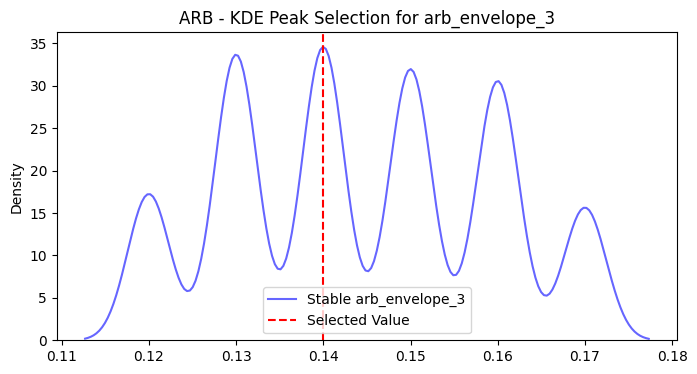

arb_envelope_1: Detected 0 peaks, selecting 0.0700


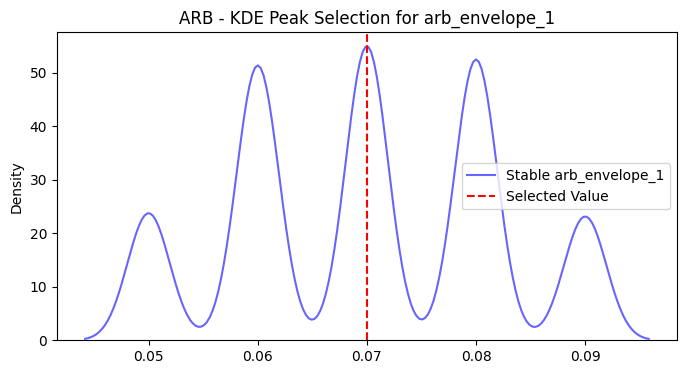

arb_envelope_2: Detected 0 peaks, selecting 0.1100


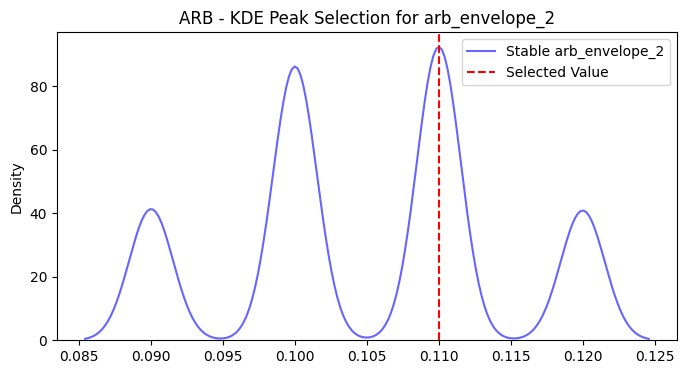


Optimized Parameters for ARB:
ma_window: 7.9429
size: 0.0700
envelope_3: 0.1400
envelope_1: 0.0700
envelope_2: 0.1100

==================== SAND ====================
sand_ma_window: Detected 2 peaks, selecting 8.0130


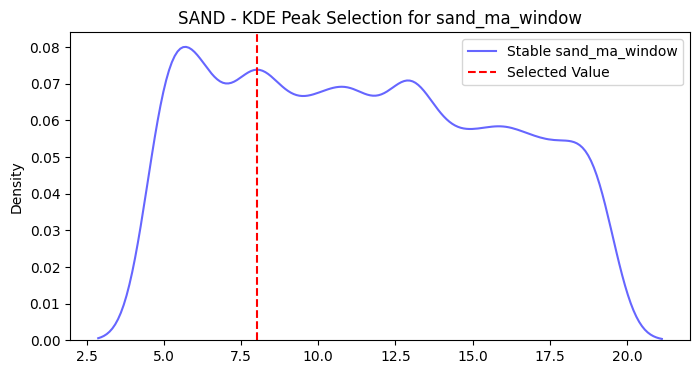

sand_size: Detected 0 peaks, selecting 0.0700


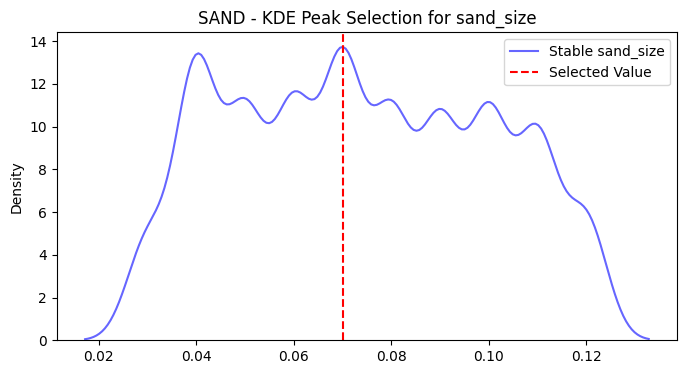

sand_envelope_3: Detected 0 peaks, selecting 0.1500


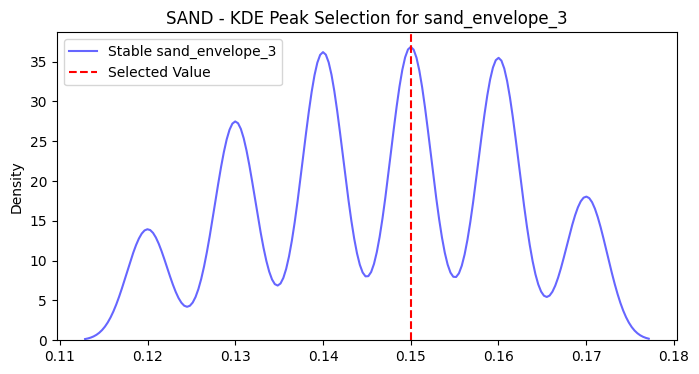

sand_envelope_4: Detected 0 peaks, selecting 0.2000


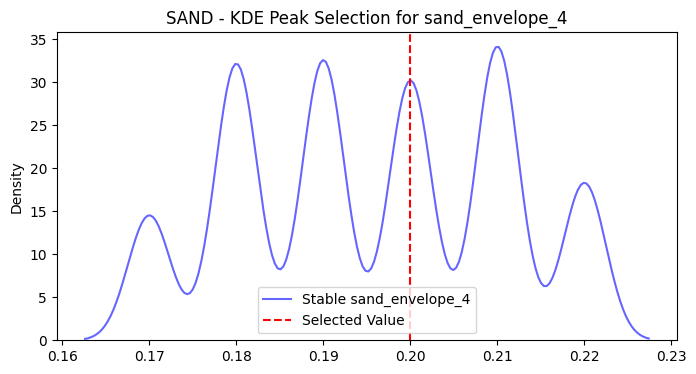

sand_envelope_1: Detected 0 peaks, selecting 0.0700


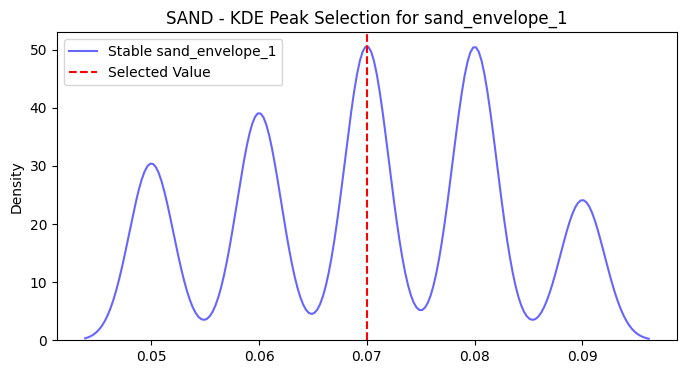

sand_envelope_2: Detected 0 peaks, selecting 0.1000


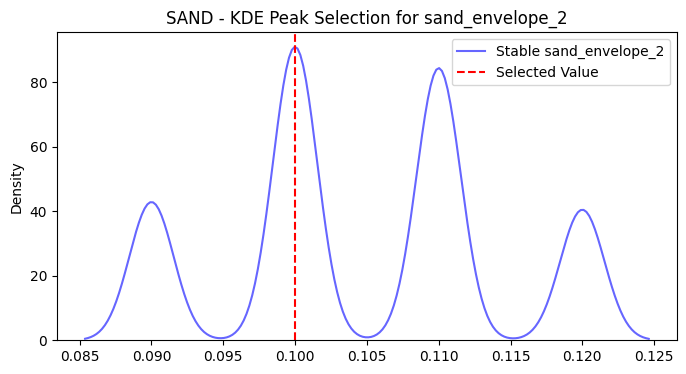


Optimized Parameters for SAND:
ma_window: 8.0130
size: 0.0700
envelope_3: 0.1500
envelope_4: 0.2000
envelope_1: 0.0700
envelope_2: 0.1000

==================== TRX ====================
trx_ma_window: Detected 2 peaks, selecting 9.9469


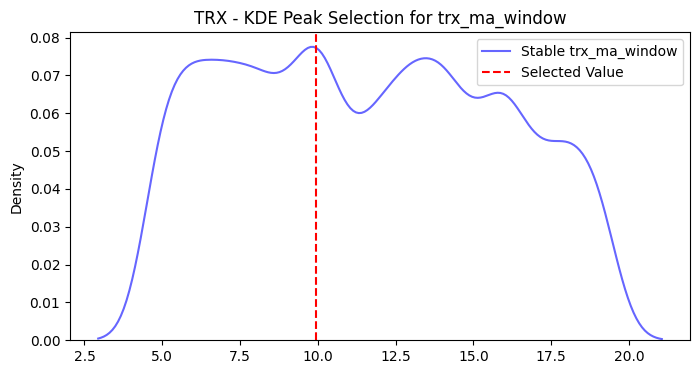

trx_size: Detected 0 peaks, selecting 0.0800


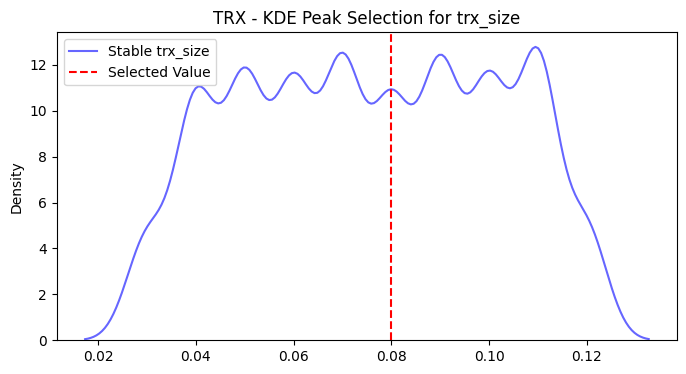

trx_envelope_4: Detected 0 peaks, selecting 0.2000


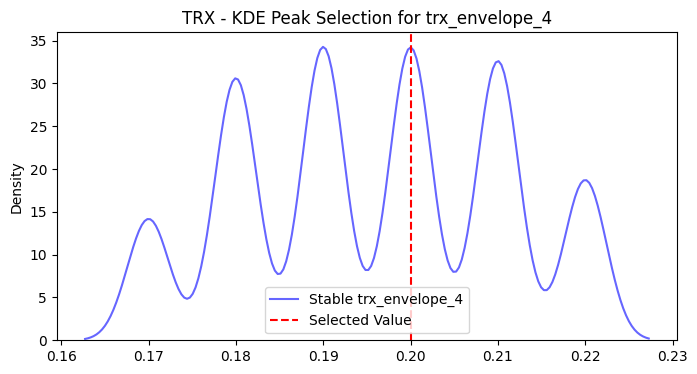

trx_envelope_3: Detected 0 peaks, selecting 0.1500


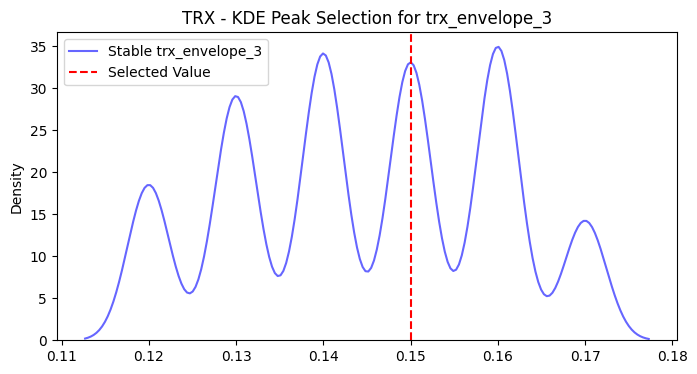

trx_envelope_1: Detected 0 peaks, selecting 0.0700


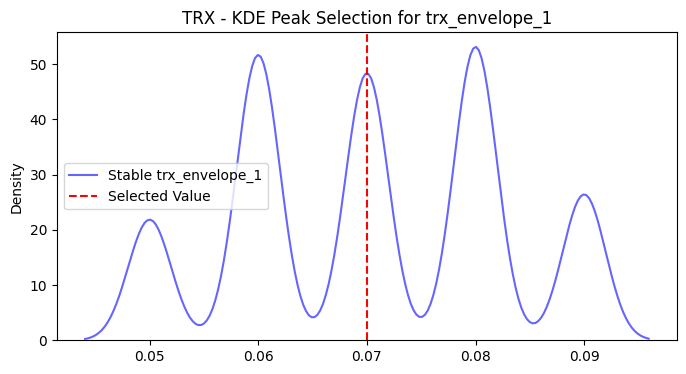

trx_envelope_2: Detected 0 peaks, selecting 0.1000


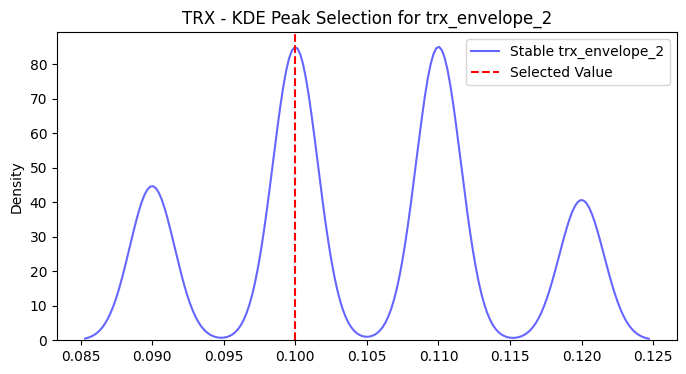


Optimized Parameters for TRX:
ma_window: 9.9469
size: 0.0800
envelope_4: 0.2000
envelope_3: 0.1500
envelope_1: 0.0700
envelope_2: 0.1000

==================== CRV ====================
crv_ma_window: Detected 1 peaks, selecting 10.0310


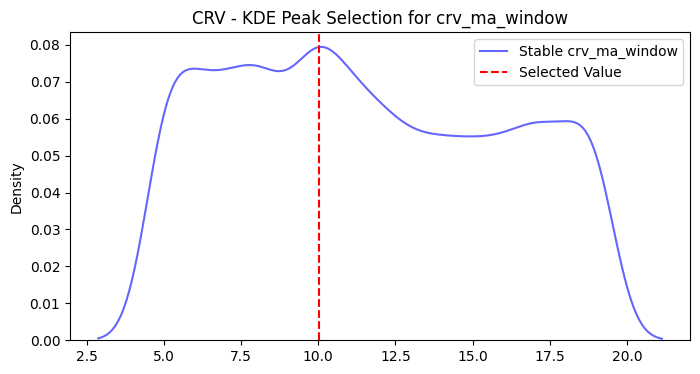

crv_size: Detected 0 peaks, selecting 0.0800


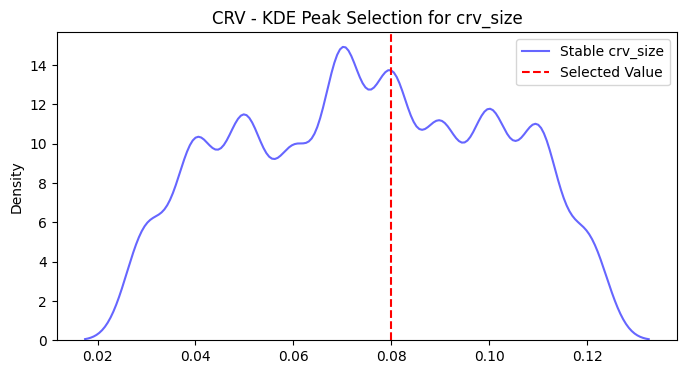

crv_envelope_3: Detected 0 peaks, selecting 0.1500


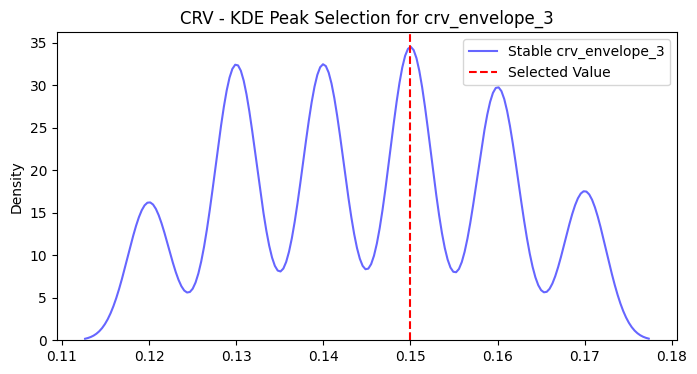

crv_envelope_1: Detected 0 peaks, selecting 0.0700


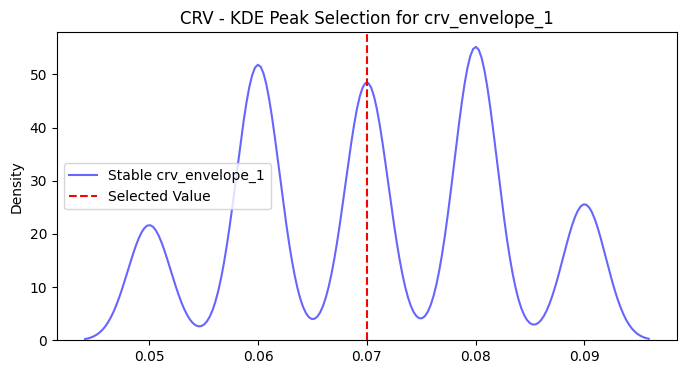

crv_envelope_4: Detected 0 peaks, selecting 0.1900


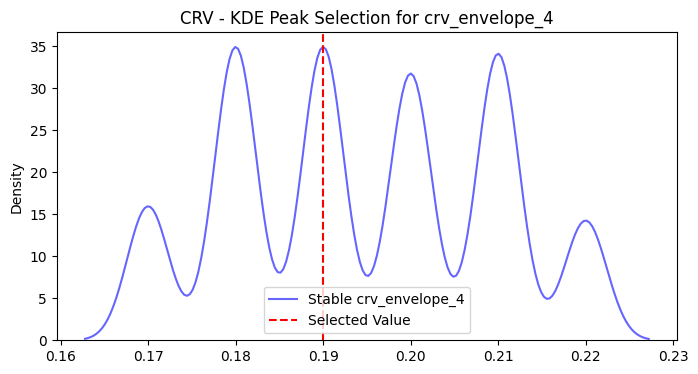

crv_envelope_2: Detected 0 peaks, selecting 0.1100


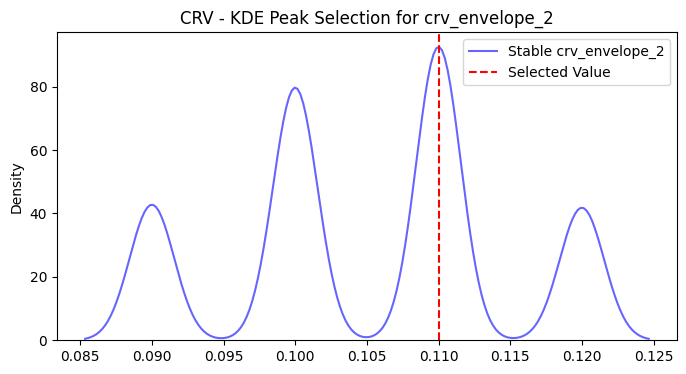


Optimized Parameters for CRV:
ma_window: 10.0310
size: 0.0800
envelope_3: 0.1500
envelope_1: 0.0700
envelope_4: 0.1900
envelope_2: 0.1100

==================== AVAX ====================
avax_ma_window: Detected 1 peaks, selecting 6.9900


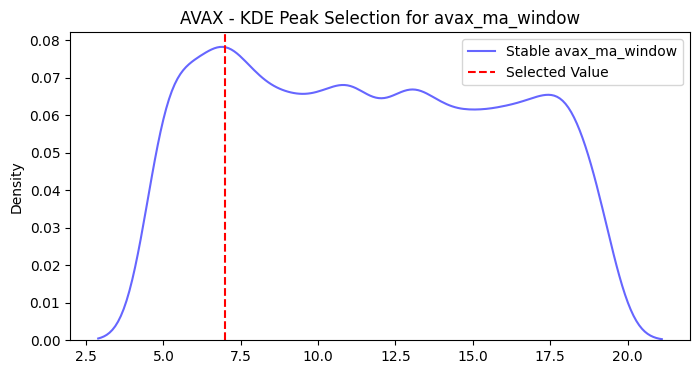

avax_size: Detected 0 peaks, selecting 0.0700


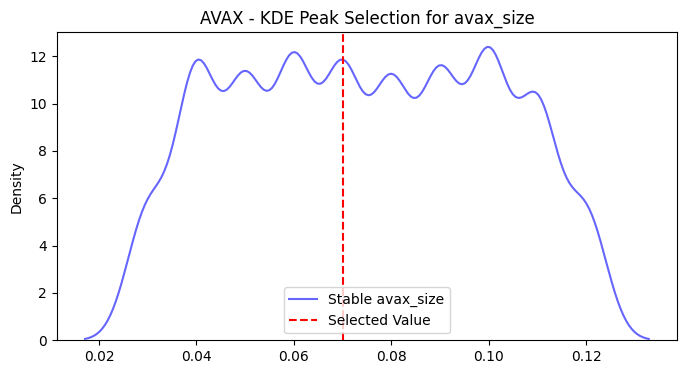

avax_envelope_3: Detected 0 peaks, selecting 0.1500


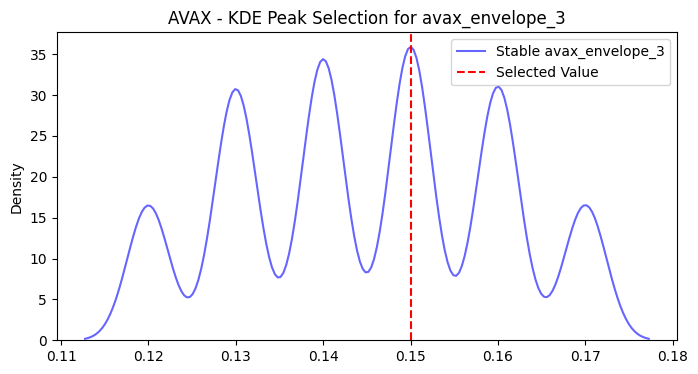

avax_envelope_4: Detected 0 peaks, selecting 0.1900


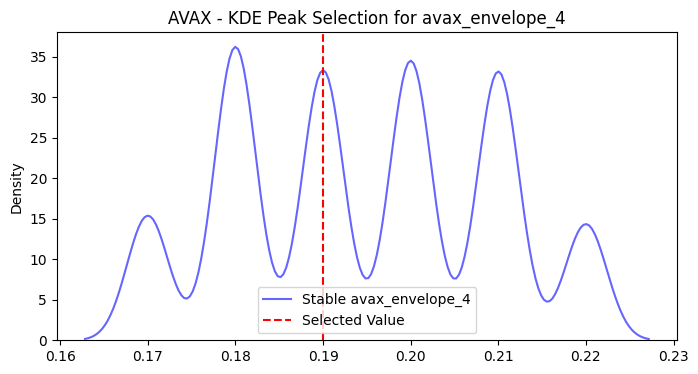

avax_envelope_1: Detected 0 peaks, selecting 0.0700


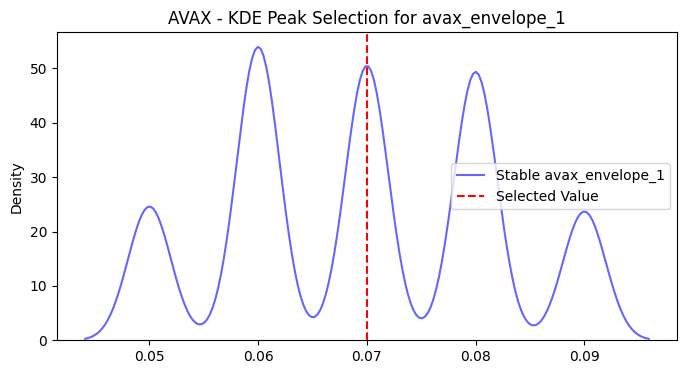

avax_envelope_2: Detected 0 peaks, selecting 0.1000


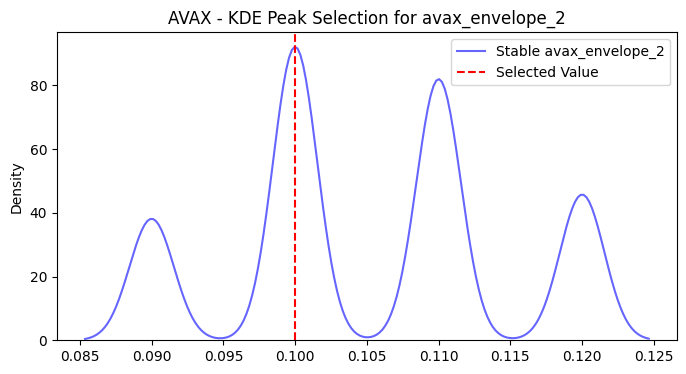


Optimized Parameters for AVAX:
ma_window: 6.9900
size: 0.0700
envelope_3: 0.1500
envelope_4: 0.1900
envelope_1: 0.0700
envelope_2: 0.1000

==================== ADA ====================
ada_ma_window: Detected 2 peaks, selecting 8.0551


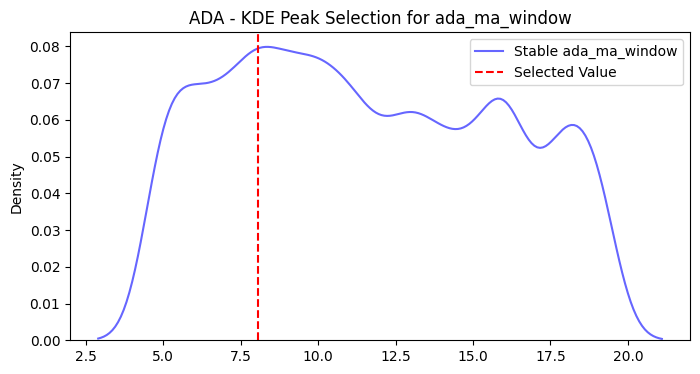

ada_size: Detected 0 peaks, selecting 0.0800


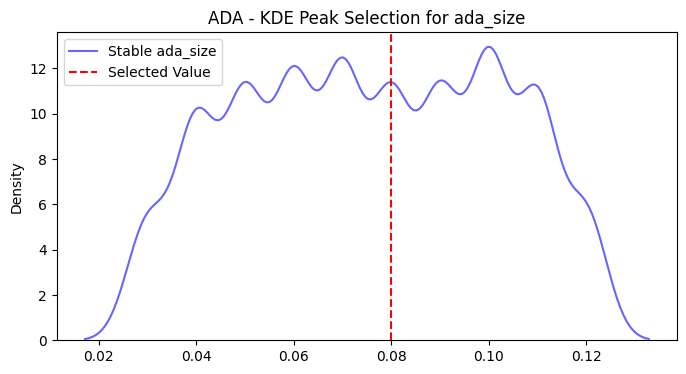

ada_envelope_4: Detected 0 peaks, selecting 0.2000


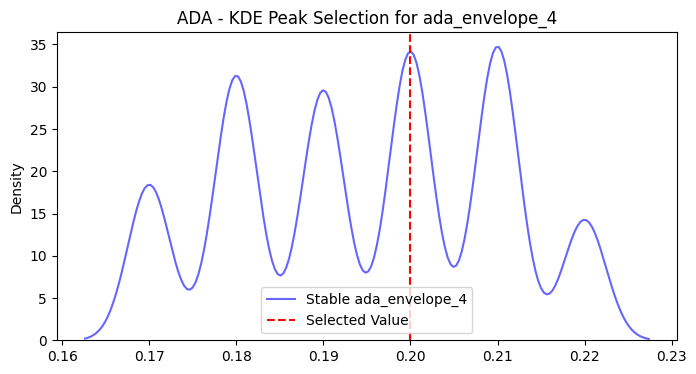

ada_envelope_2: Detected 0 peaks, selecting 0.1100


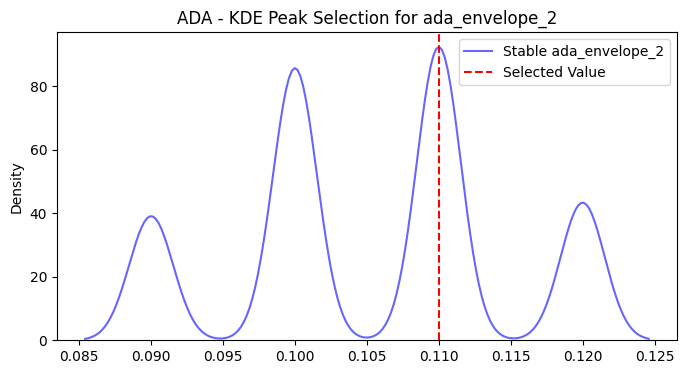

ada_envelope_3: Detected 0 peaks, selecting 0.1500


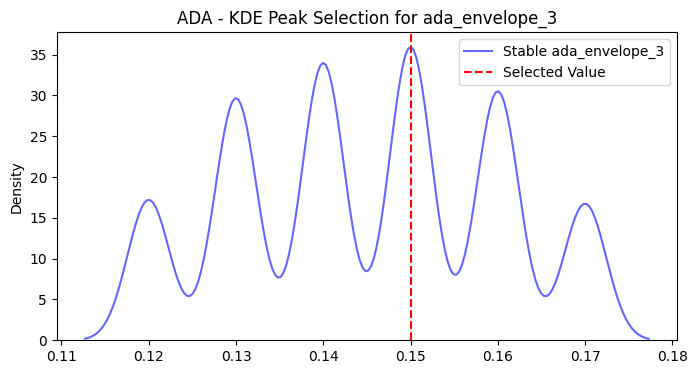

ada_envelope_1: Detected 0 peaks, selecting 0.0700


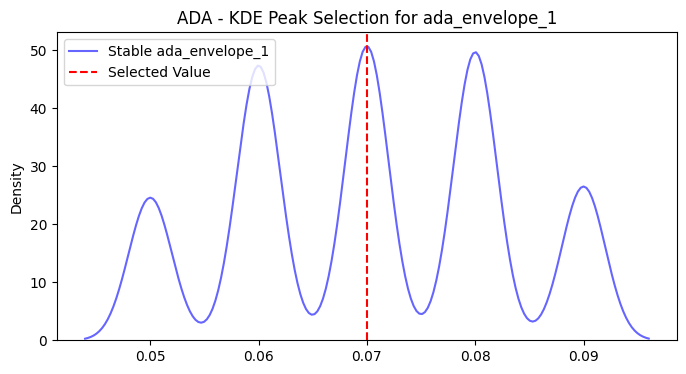


Optimized Parameters for ADA:
ma_window: 8.0551
size: 0.0800
envelope_4: 0.2000
envelope_2: 0.1100
envelope_3: 0.1500
envelope_1: 0.0700

==================== BTC ====================
btc_ma_window: Detected 4 peaks, selecting 5.9389


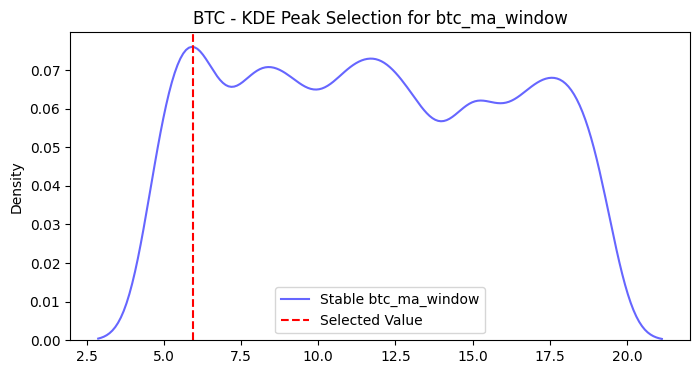

btc_size: Detected 0 peaks, selecting 0.0800


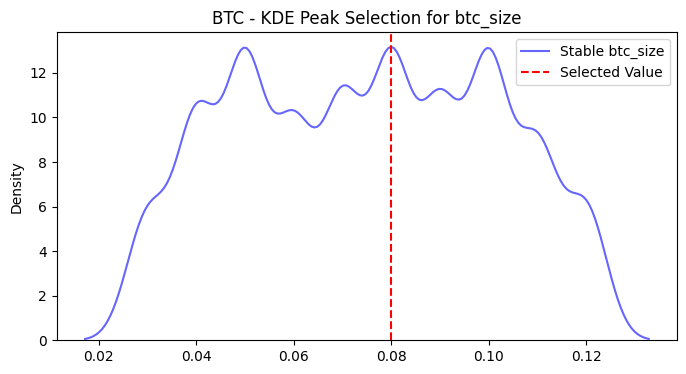

btc_envelope_3: Detected 0 peaks, selecting 0.1500


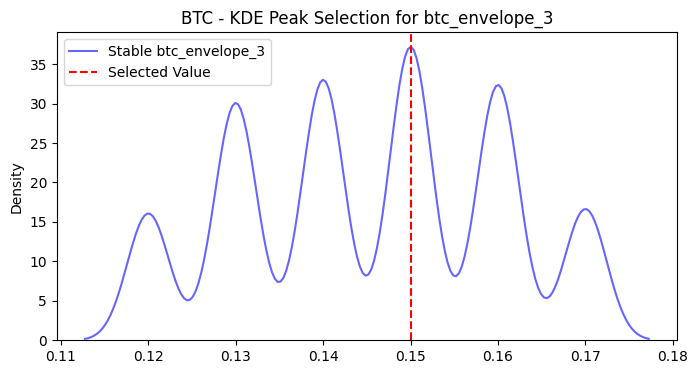

btc_envelope_1: Detected 0 peaks, selecting 0.0700


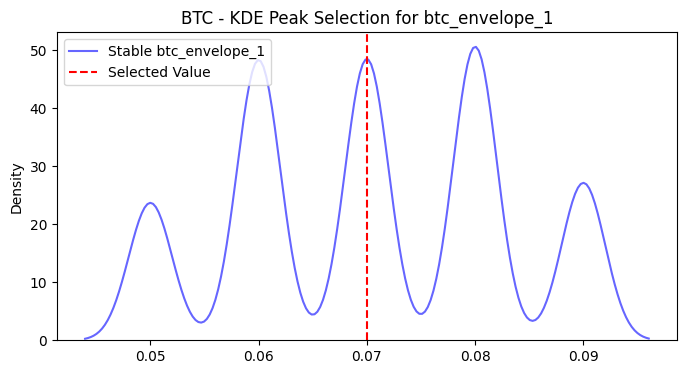

btc_envelope_2: Detected 0 peaks, selecting 0.1000


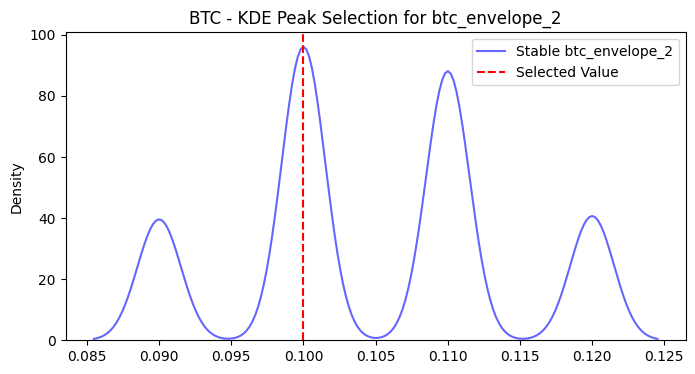


Optimized Parameters for BTC:
ma_window: 5.9389
size: 0.0800
envelope_3: 0.1500
envelope_1: 0.0700
envelope_2: 0.1000

==================== OP ====================
op_ma_window: Detected 2 peaks, selecting 15.9870


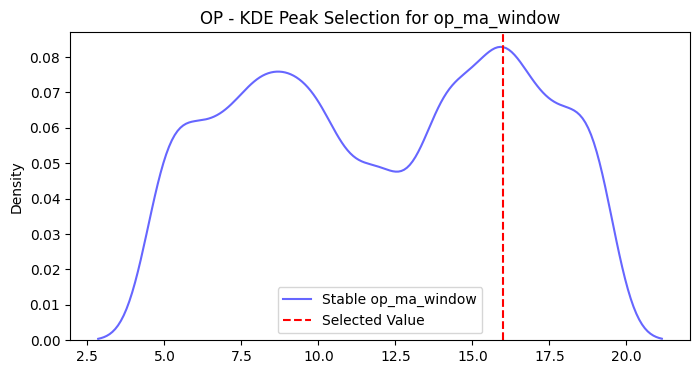

op_envelope_1: Detected 0 peaks, selecting 0.0700


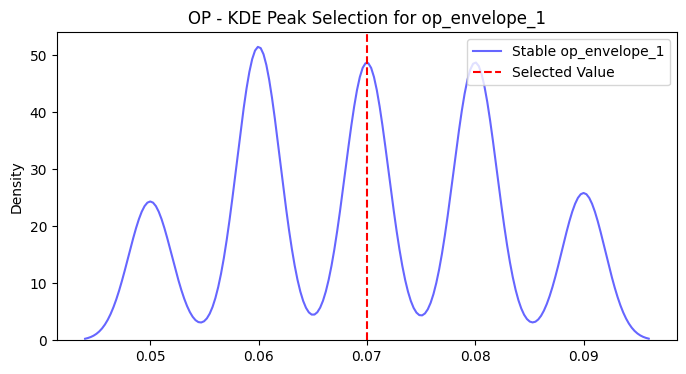

op_size: Detected 0 peaks, selecting 0.0700


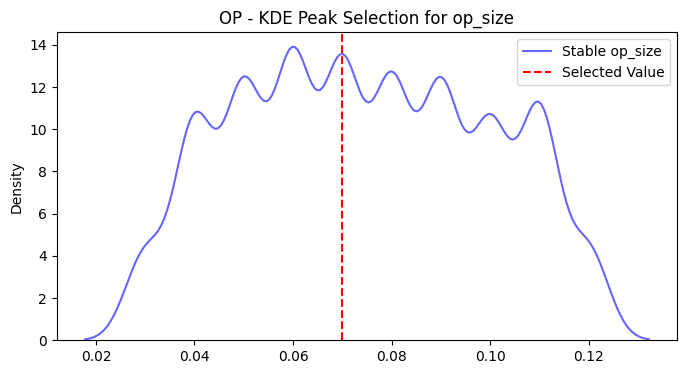

op_envelope_3: Detected 0 peaks, selecting 0.1500


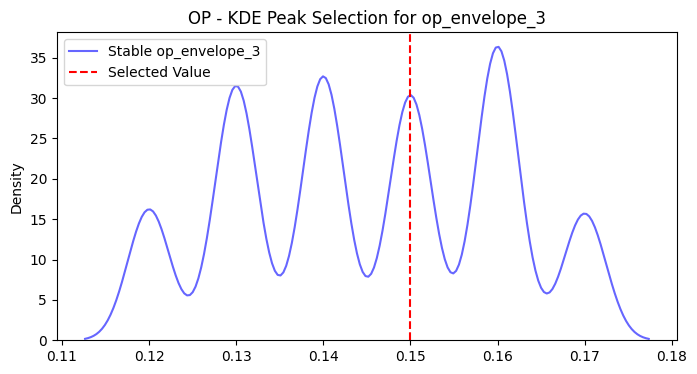

op_envelope_2: Detected 0 peaks, selecting 0.1000


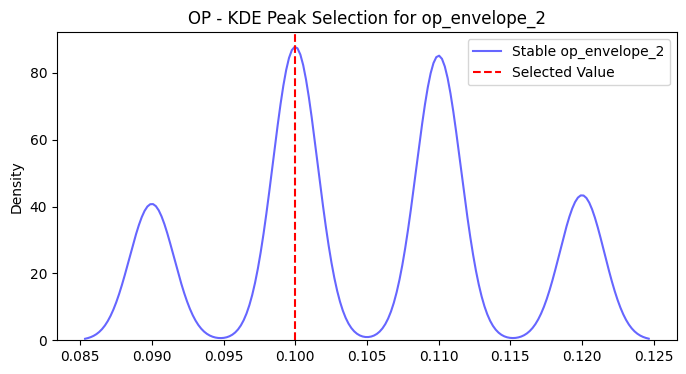


Optimized Parameters for OP:
ma_window: 15.9870
envelope_1: 0.0700
size: 0.0700
envelope_3: 0.1500
envelope_2: 0.1000

==================== DOGE ====================
doge_ma_window: Detected 1 peaks, selecting 11.0541


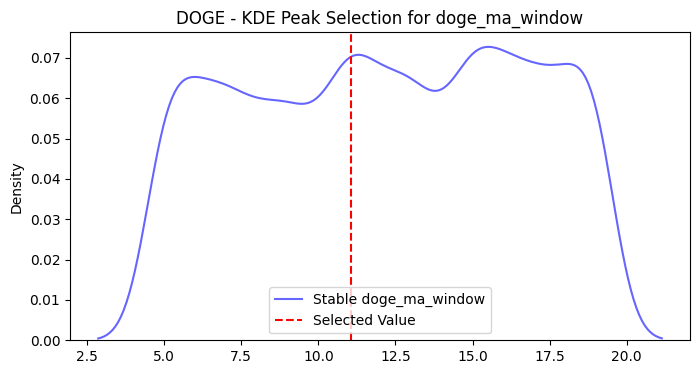

doge_size: Detected 0 peaks, selecting 0.0800


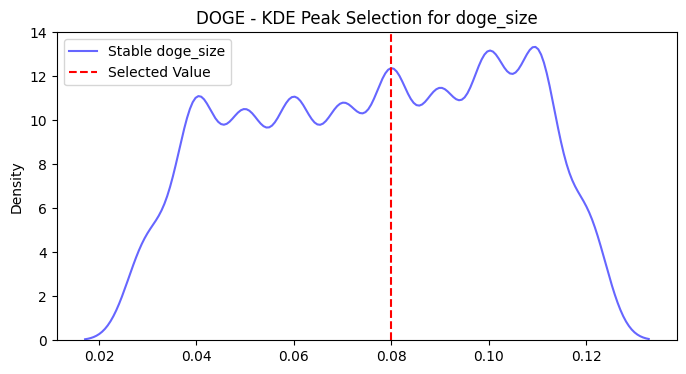

doge_envelope_3: Detected 0 peaks, selecting 0.1400


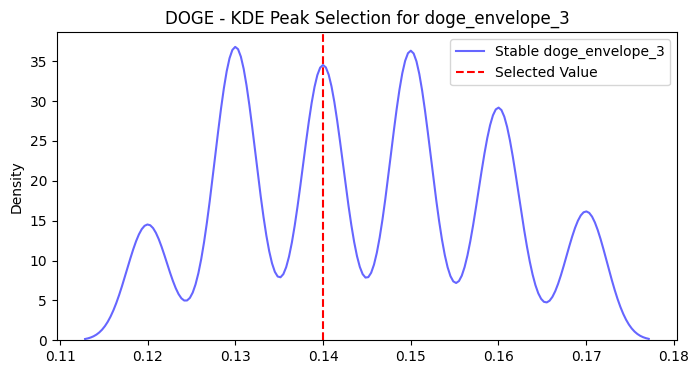

doge_envelope_4: Detected 0 peaks, selecting 0.2000


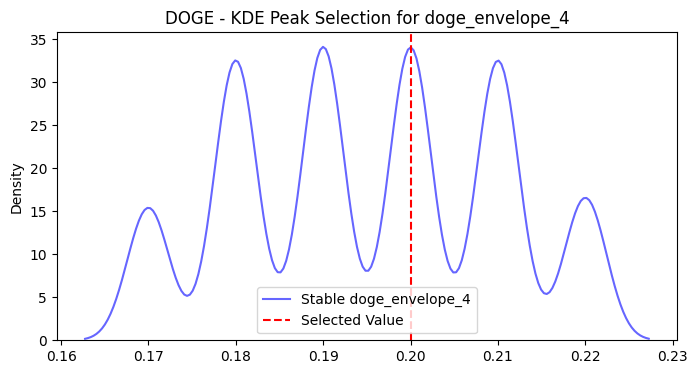

doge_envelope_1: Detected 0 peaks, selecting 0.0700


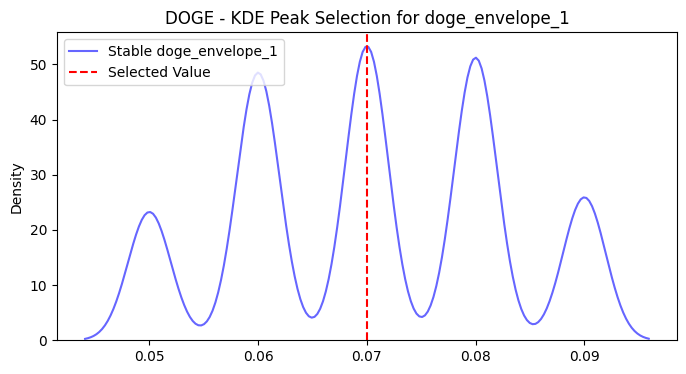

doge_envelope_2: Detected 0 peaks, selecting 0.1100


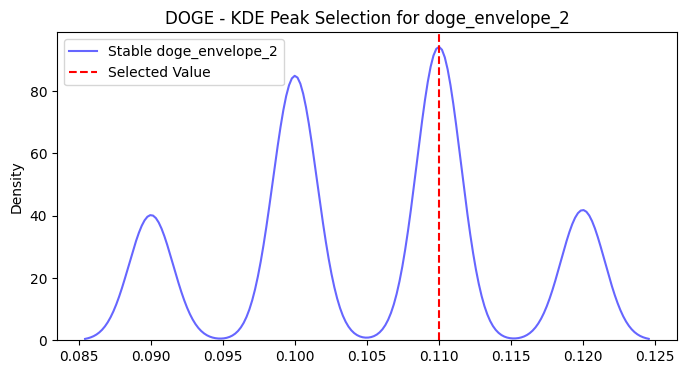


Optimized Parameters for DOGE:
ma_window: 11.0541
size: 0.0800
envelope_3: 0.1400
envelope_4: 0.2000
envelope_1: 0.0700
envelope_2: 0.1100

==================== EGLD ====================
egld_ma_window: Detected 3 peaks, selecting 12.9600


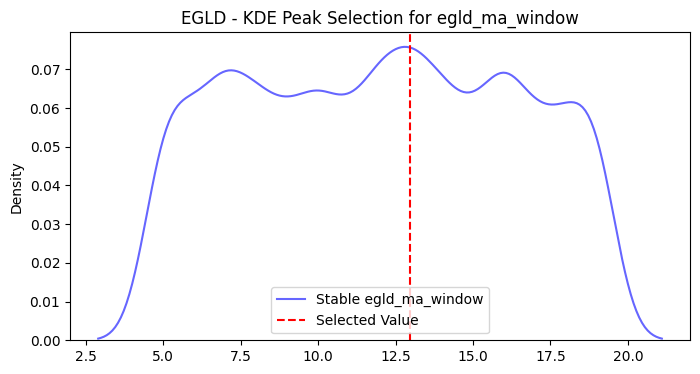

egld_size: Detected 0 peaks, selecting 0.0800


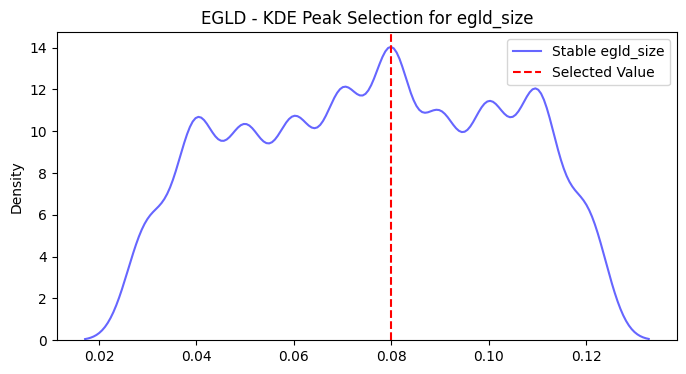

egld_envelope_3: Detected 0 peaks, selecting 0.1500


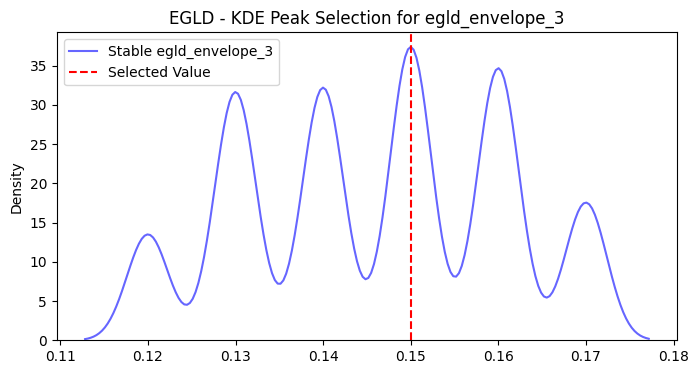

egld_envelope_4: Detected 0 peaks, selecting 0.2000


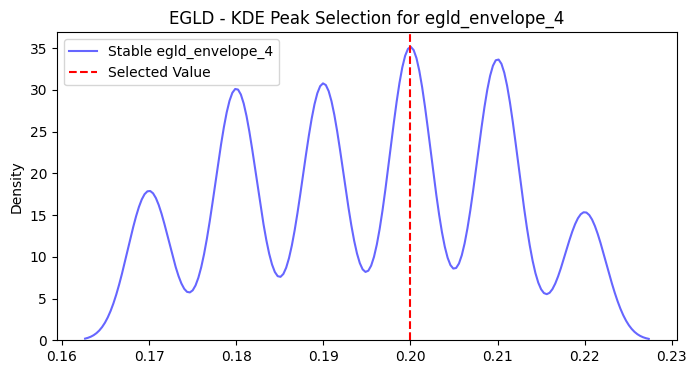

egld_envelope_1: Detected 0 peaks, selecting 0.0700


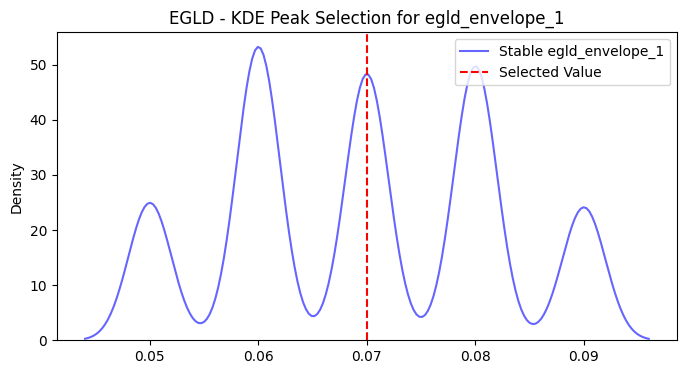

egld_envelope_2: Detected 0 peaks, selecting 0.1000


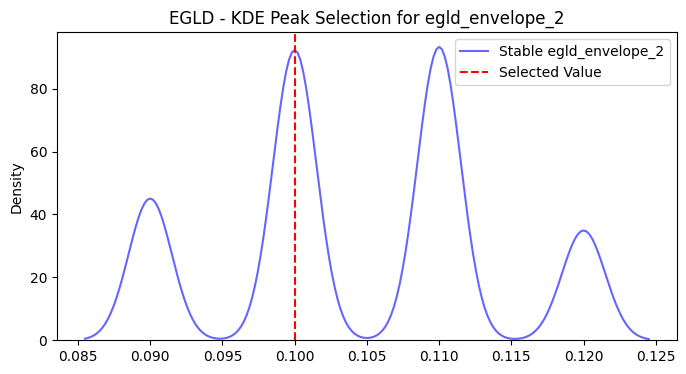


Optimized Parameters for EGLD:
ma_window: 12.9600
size: 0.0800
envelope_3: 0.1500
envelope_4: 0.2000
envelope_1: 0.0700
envelope_2: 0.1000

==================== SUI ====================
sui_ma_window: Detected 2 peaks, selecting 11.0681


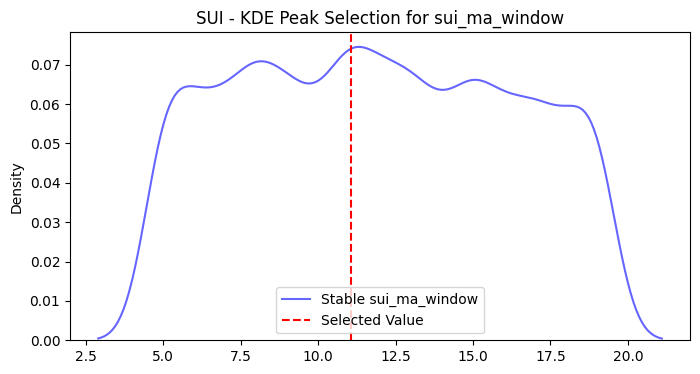

sui_size: Detected 0 peaks, selecting 0.0800


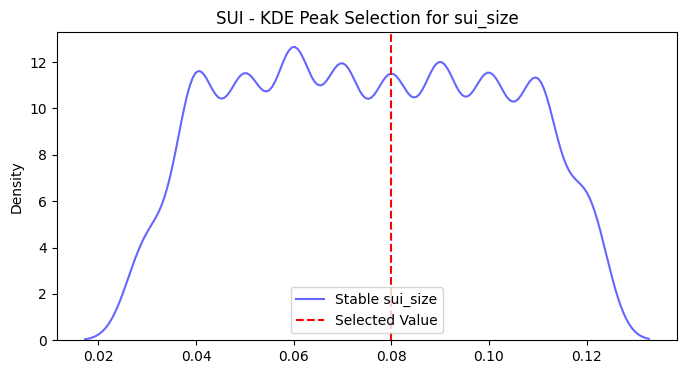

sui_envelope_3: Detected 0 peaks, selecting 0.1500


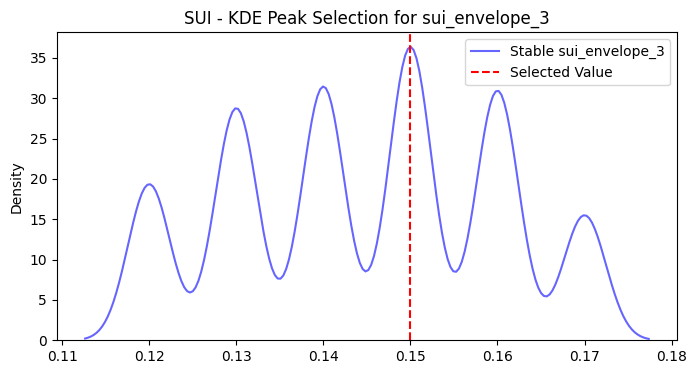

sui_envelope_1: Detected 0 peaks, selecting 0.0700


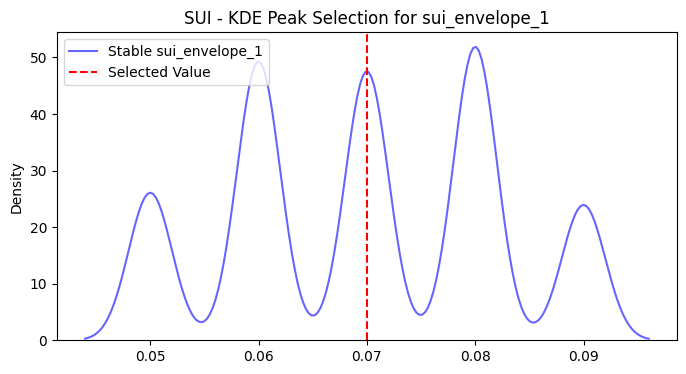

sui_envelope_2: Detected 0 peaks, selecting 0.1000


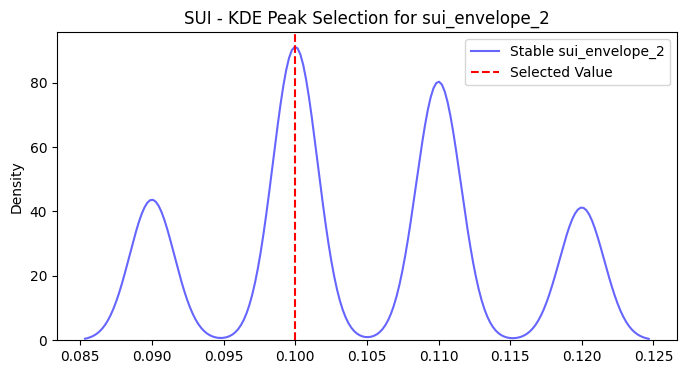


Optimized Parameters for SUI:
ma_window: 11.0681
size: 0.0800
envelope_3: 0.1500
envelope_1: 0.0700
envelope_2: 0.1000

==================== ENJ ====================
enj_ma_window: Detected 2 peaks, selecting 15.9169


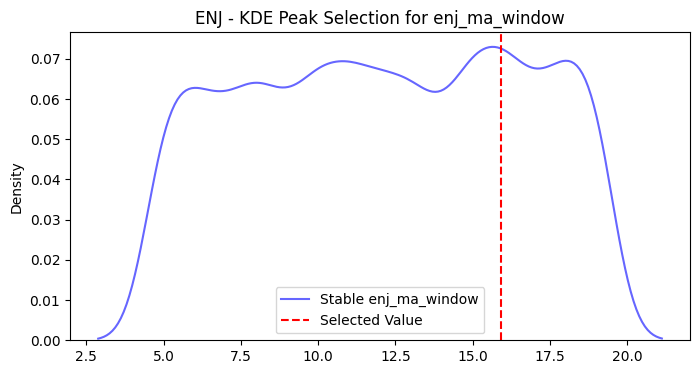

enj_size: Detected 0 peaks, selecting 0.0800


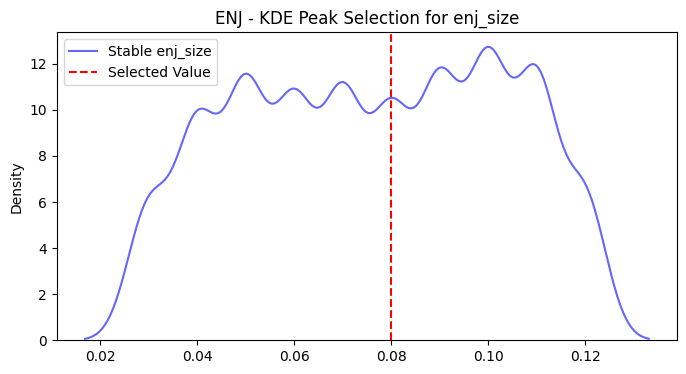

enj_envelope_4: Detected 0 peaks, selecting 0.2000


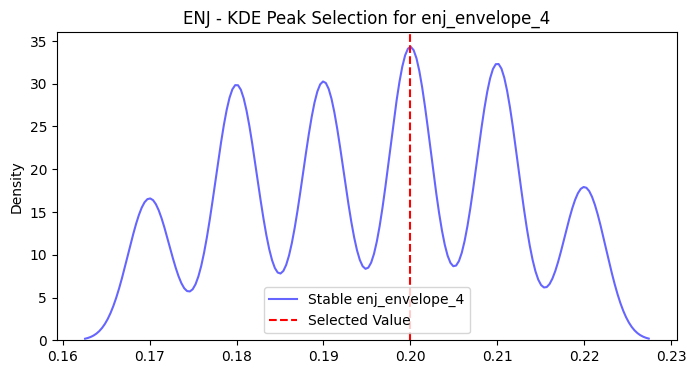

enj_envelope_3: Detected 0 peaks, selecting 0.1500


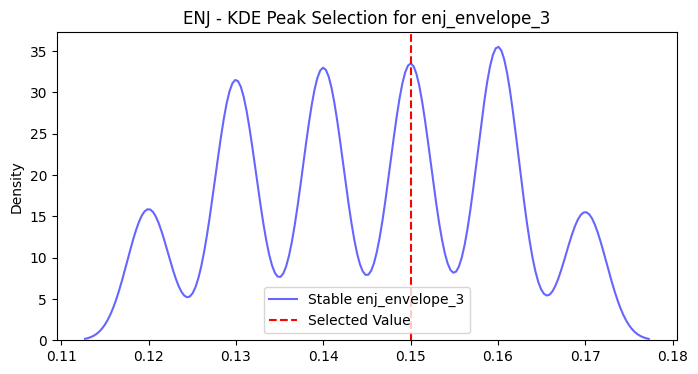

enj_envelope_1: Detected 0 peaks, selecting 0.0700


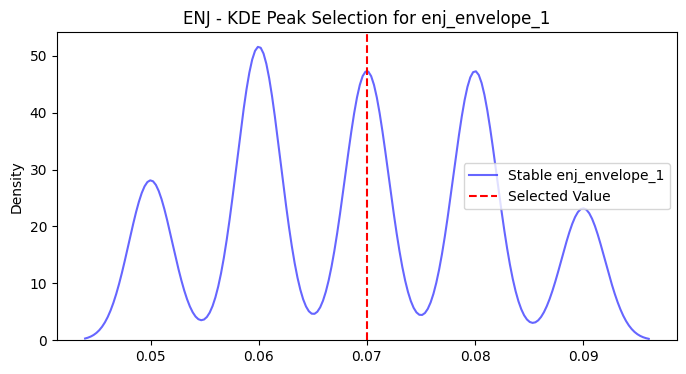

enj_envelope_2: Detected 0 peaks, selecting 0.1000


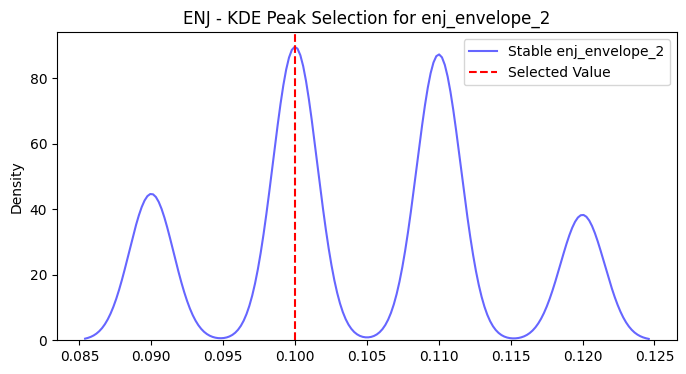


Optimized Parameters for ENJ:
ma_window: 15.9169
size: 0.0800
envelope_4: 0.2000
envelope_3: 0.1500
envelope_1: 0.0700
envelope_2: 0.1000

==================== IMX ====================
imx_ma_window: Detected 2 peaks, selecting 10.9980


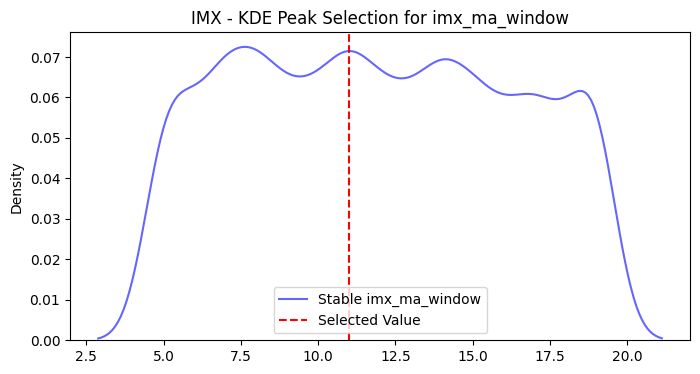

imx_size: Detected 0 peaks, selecting 0.0700


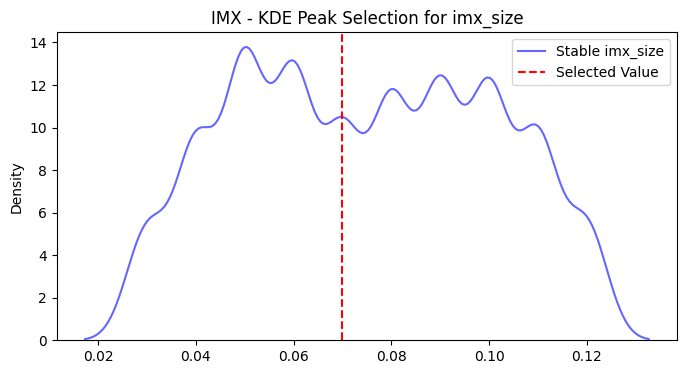

imx_envelope_3: Detected 0 peaks, selecting 0.1500


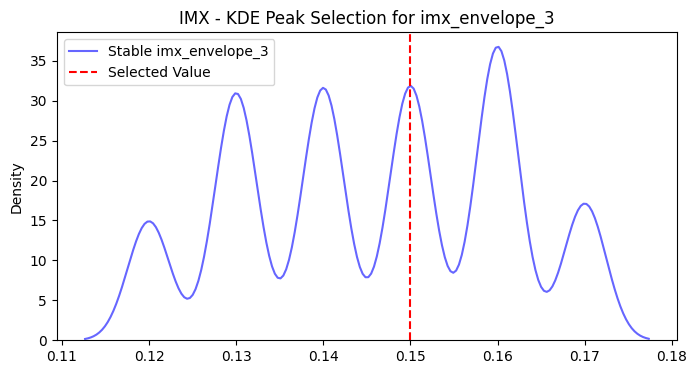

imx_envelope_4: Detected 0 peaks, selecting 0.1900


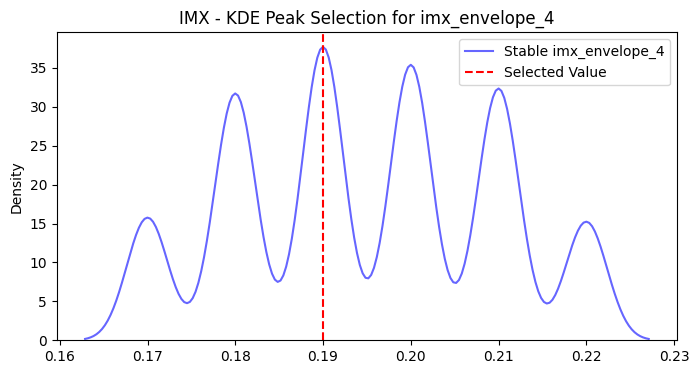

imx_envelope_1: Detected 0 peaks, selecting 0.0700


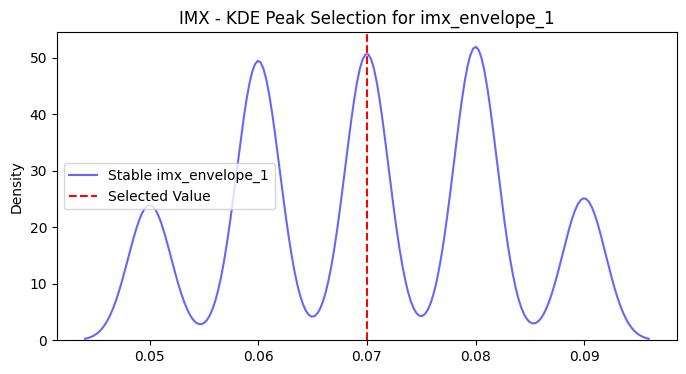

imx_envelope_2: Detected 0 peaks, selecting 0.1000


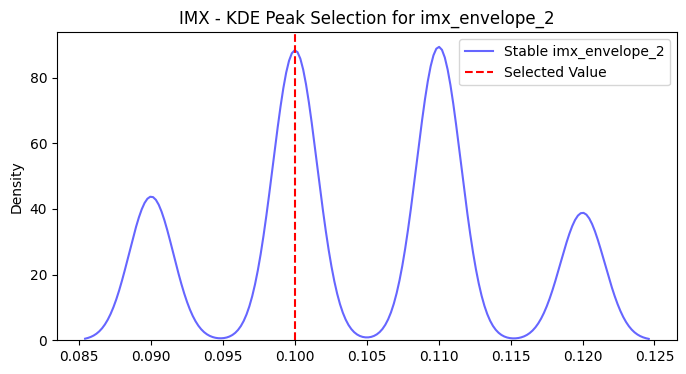


Optimized Parameters for IMX:
ma_window: 10.9980
size: 0.0700
envelope_3: 0.1500
envelope_4: 0.1900
envelope_1: 0.0700
envelope_2: 0.1000

==================== FET ====================
fet_ma_window: Detected 4 peaks, selecting 13.0160


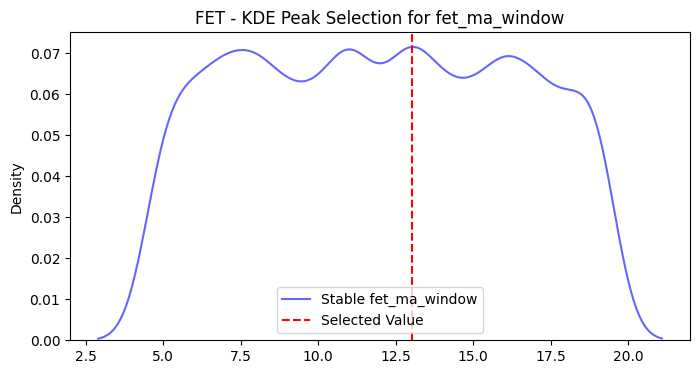

fet_size: Detected 0 peaks, selecting 0.0800


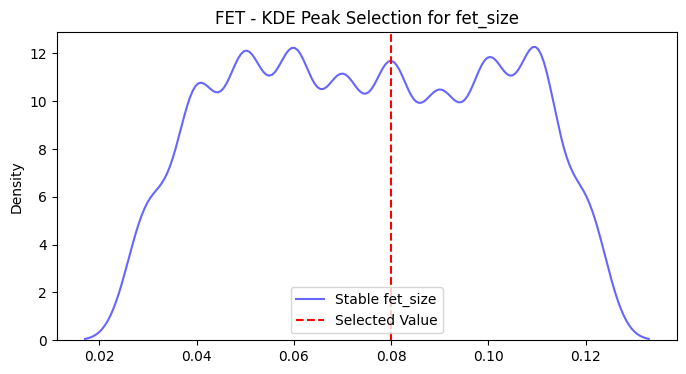

fet_envelope_4: Detected 0 peaks, selecting 0.1900


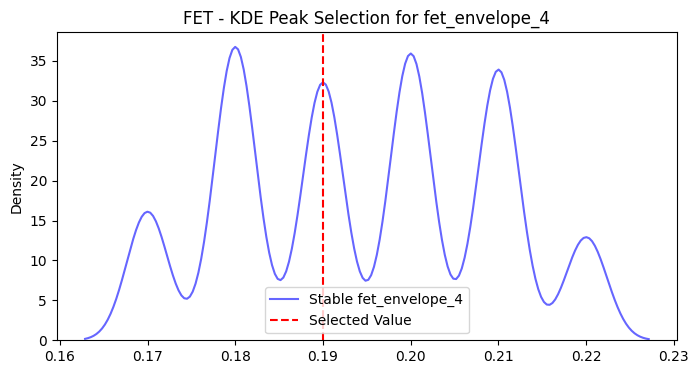

fet_envelope_3: Detected 0 peaks, selecting 0.1400


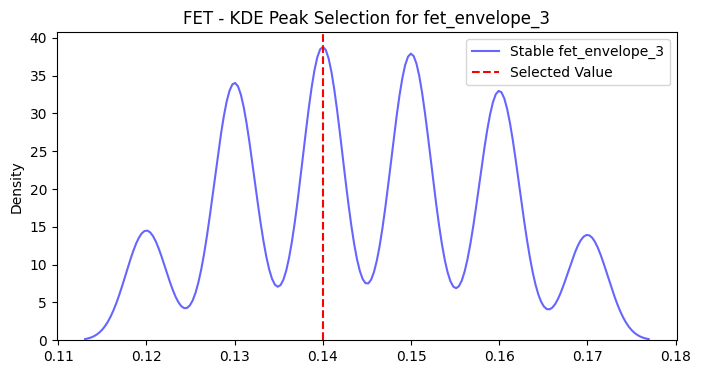

fet_envelope_1: Detected 0 peaks, selecting 0.0700


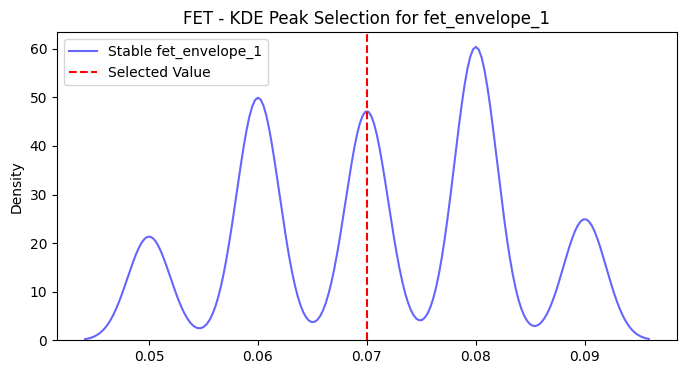

fet_envelope_2: Detected 0 peaks, selecting 0.1100


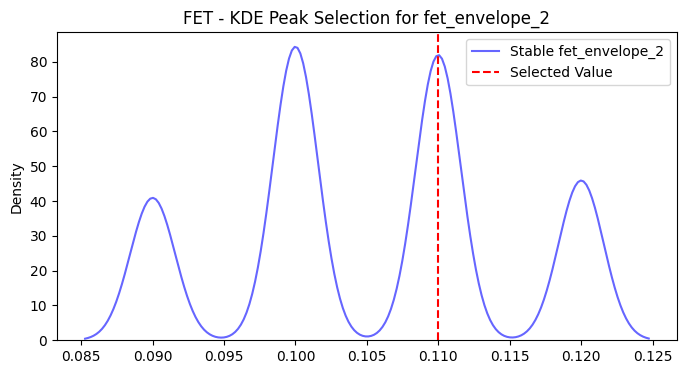


Optimized Parameters for FET:
ma_window: 13.0160
size: 0.0800
envelope_4: 0.1900
envelope_3: 0.1400
envelope_1: 0.0700
envelope_2: 0.1100

==================== ENS ====================
ens_ma_window: Detected 2 peaks, selecting 12.9600


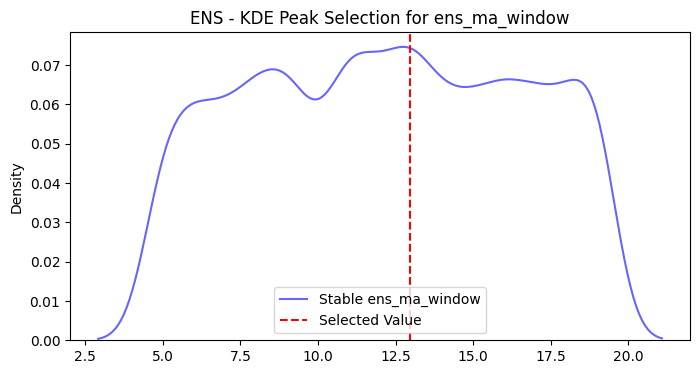

ens_size: Detected 0 peaks, selecting 0.0700


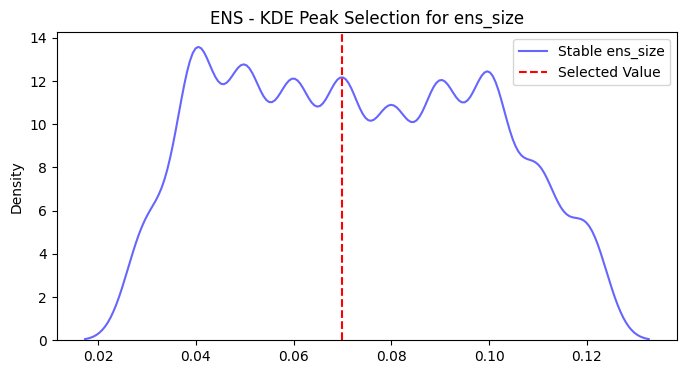

ens_envelope_3: Detected 0 peaks, selecting 0.1400


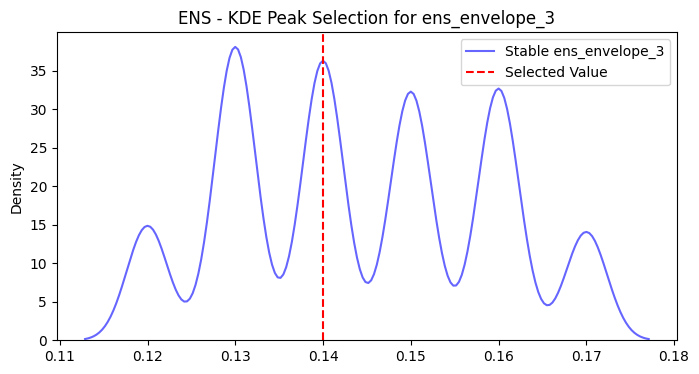

ens_envelope_1: Detected 0 peaks, selecting 0.0700


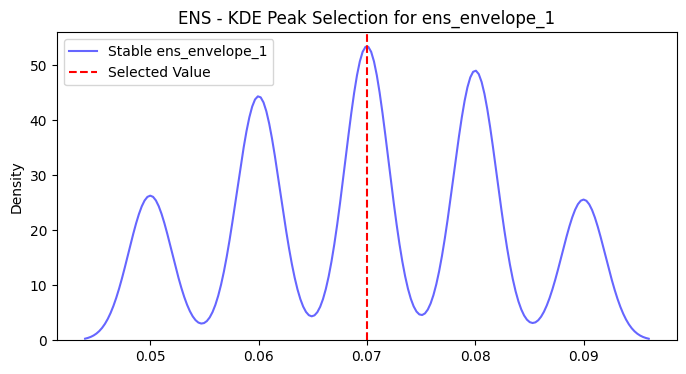

ens_envelope_2: Detected 0 peaks, selecting 0.1000


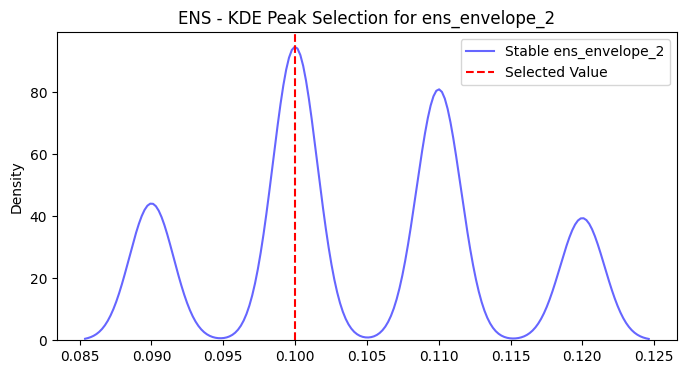


Optimized Parameters for ENS:
ma_window: 12.9600
size: 0.0700
envelope_3: 0.1400
envelope_1: 0.0700
envelope_2: 0.1000

==================== ICP ====================
icp_ma_window: Detected 3 peaks, selecting 11.9790


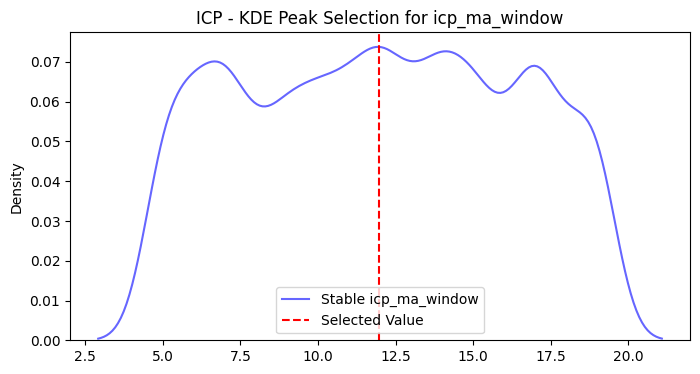

icp_size: Detected 0 peaks, selecting 0.0700


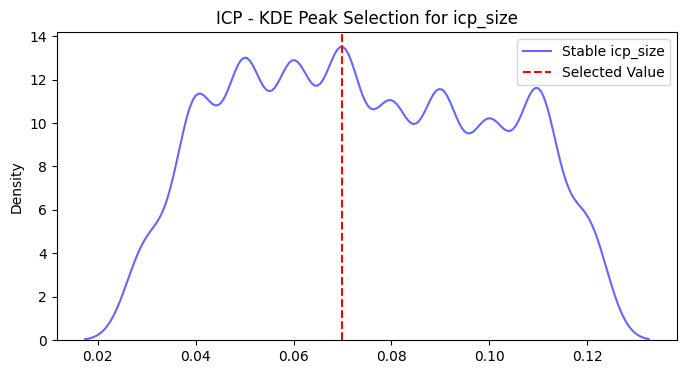

icp_envelope_4: Detected 0 peaks, selecting 0.1900


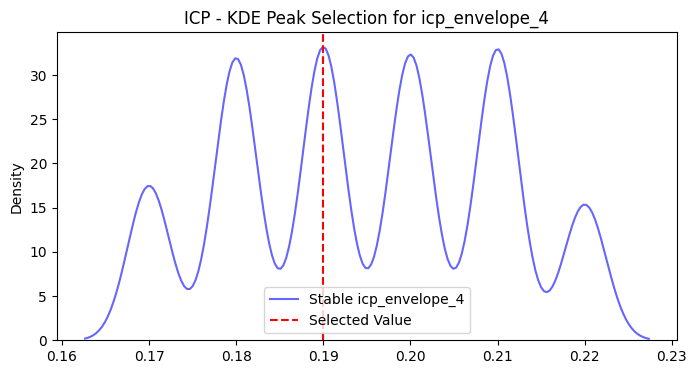

icp_envelope_1: Detected 0 peaks, selecting 0.0700


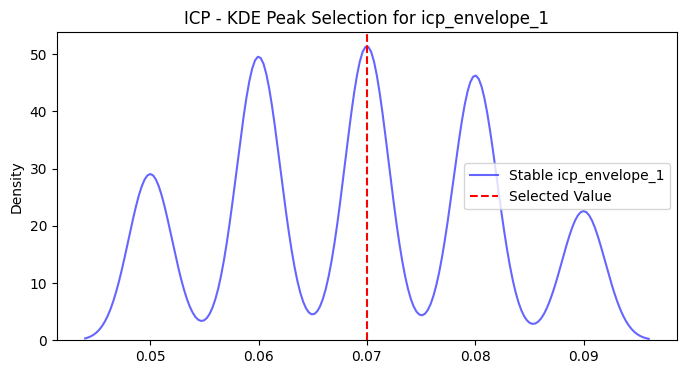

icp_envelope_3: Detected 0 peaks, selecting 0.1500


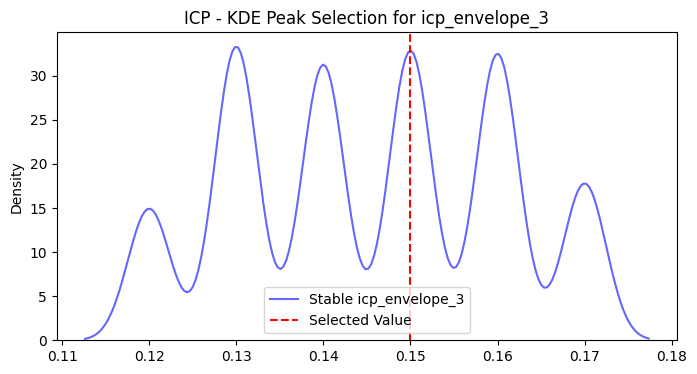

icp_envelope_2: Detected 0 peaks, selecting 0.1100


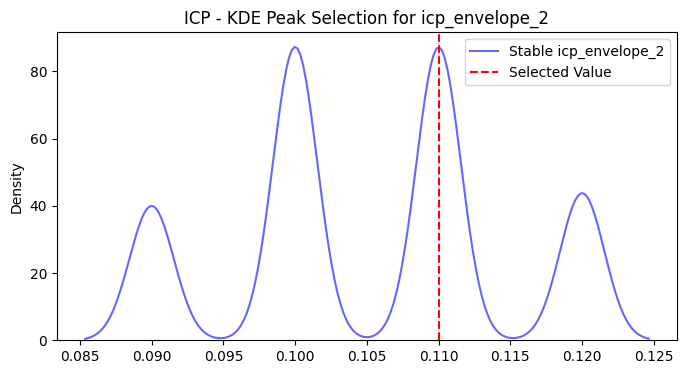


Optimized Parameters for ICP:
ma_window: 11.9790
size: 0.0700
envelope_4: 0.1900
envelope_1: 0.0700
envelope_3: 0.1500
envelope_2: 0.1100

==================== APE ====================
ape_ma_window: Detected 2 peaks, selecting 7.9850


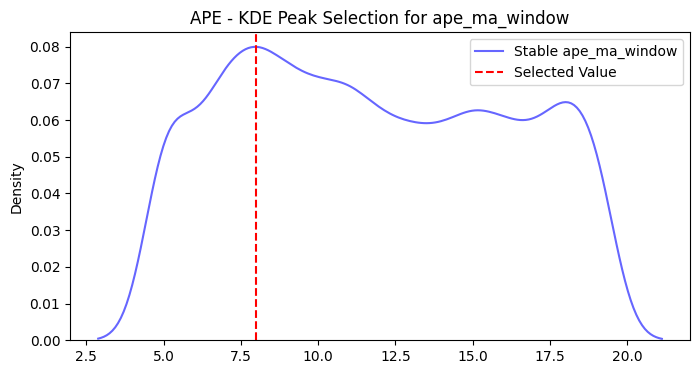

ape_size: Detected 0 peaks, selecting 0.0800


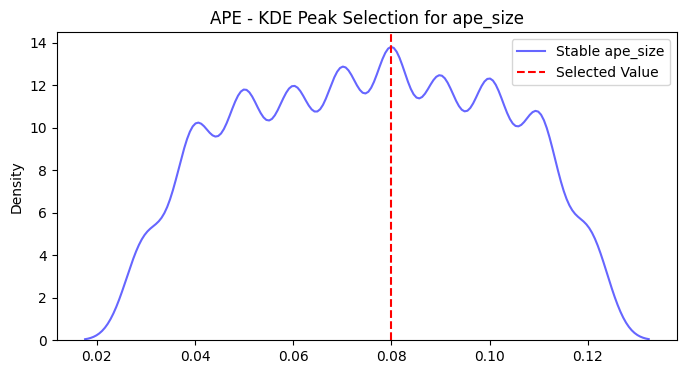

ape_envelope_3: Detected 0 peaks, selecting 0.1500


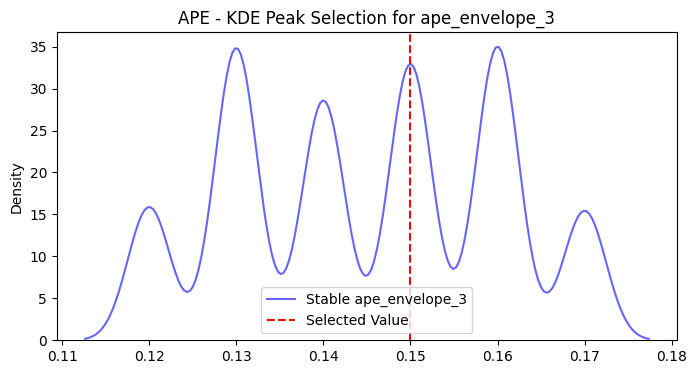

ape_envelope_4: Detected 0 peaks, selecting 0.2000


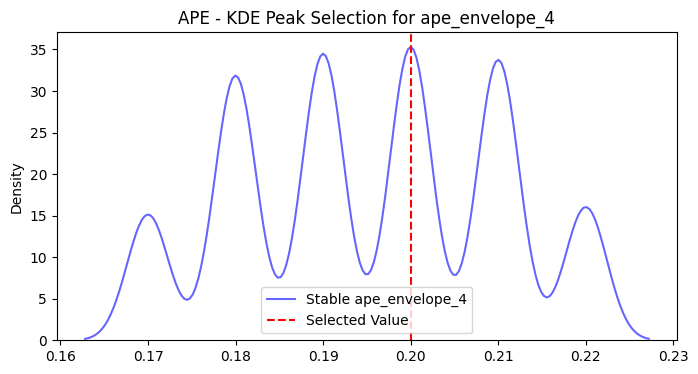

ape_envelope_1: Detected 0 peaks, selecting 0.0700


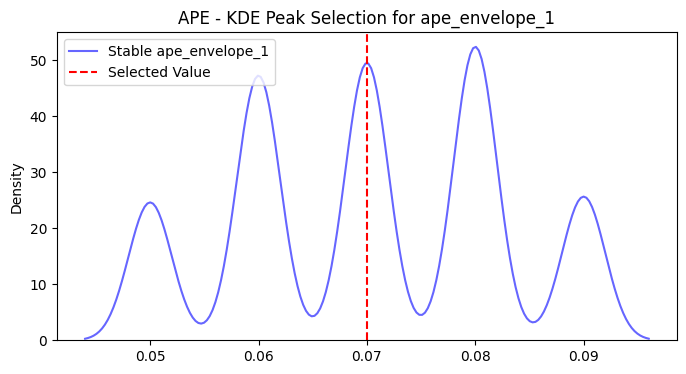

ape_envelope_2: Detected 0 peaks, selecting 0.1100


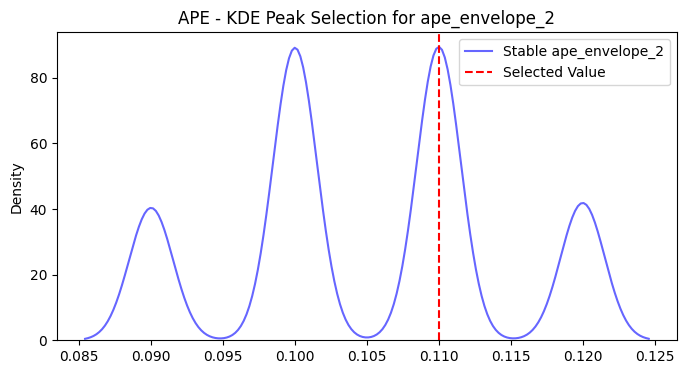


Optimized Parameters for APE:
ma_window: 7.9850
size: 0.0800
envelope_3: 0.1500
envelope_4: 0.2000
envelope_1: 0.0700
envelope_2: 0.1100

==================== ACH ====================
ach_ma_window: Detected 3 peaks, selecting 13.9129


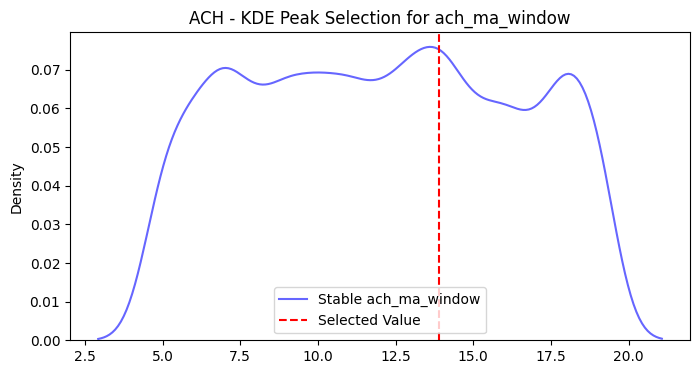

ach_size: Detected 0 peaks, selecting 0.0700


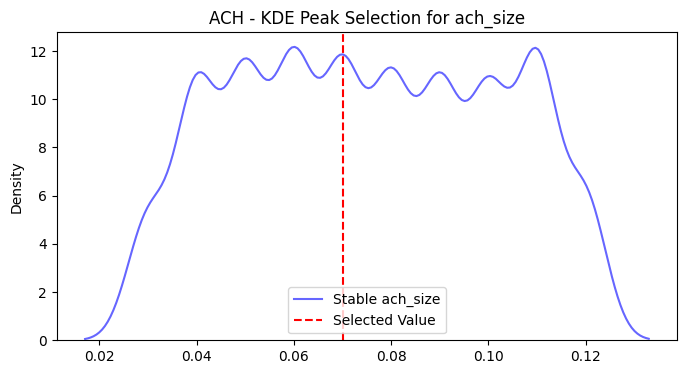

ach_envelope_4: Detected 0 peaks, selecting 0.1900


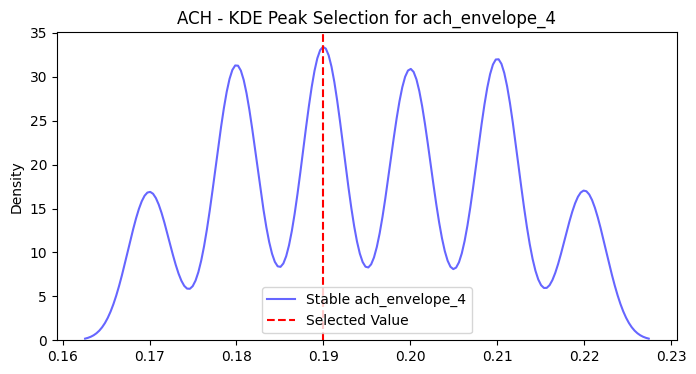

ach_envelope_1: Detected 0 peaks, selecting 0.0700


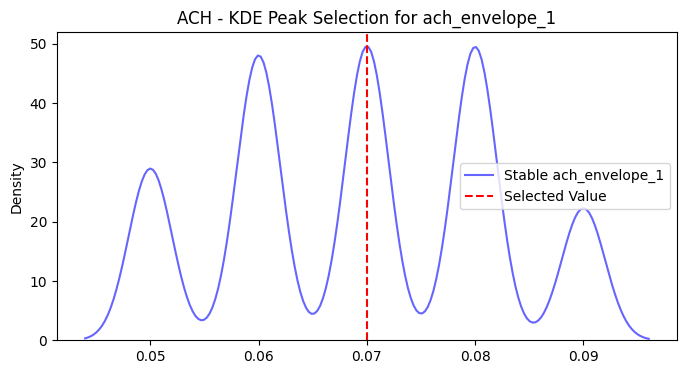

ach_envelope_3: Detected 0 peaks, selecting 0.1500


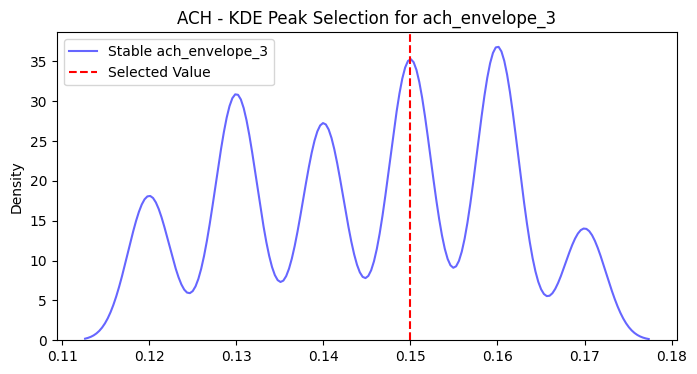

ach_envelope_2: Detected 0 peaks, selecting 0.1100


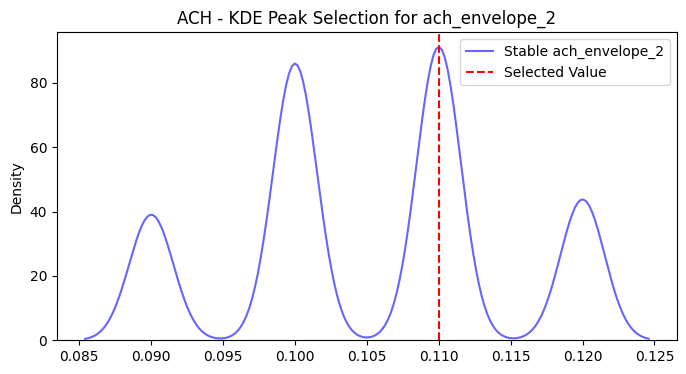


Optimized Parameters for ACH:
ma_window: 13.9129
size: 0.0700
envelope_4: 0.1900
envelope_1: 0.0700
envelope_3: 0.1500
envelope_2: 0.1100

==================== LDO ====================
ldo_size: Detected 0 peaks, selecting 0.0700


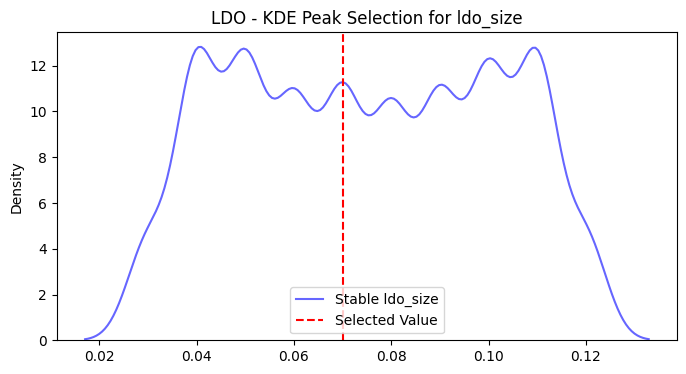

ldo_ma_window: Detected 2 peaks, selecting 11.0681


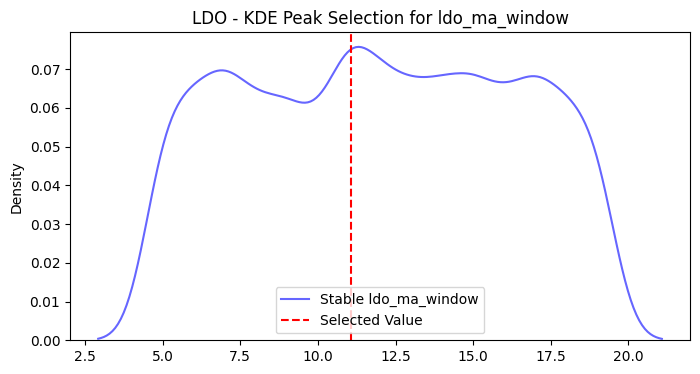

ldo_envelope_3: Detected 0 peaks, selecting 0.1500


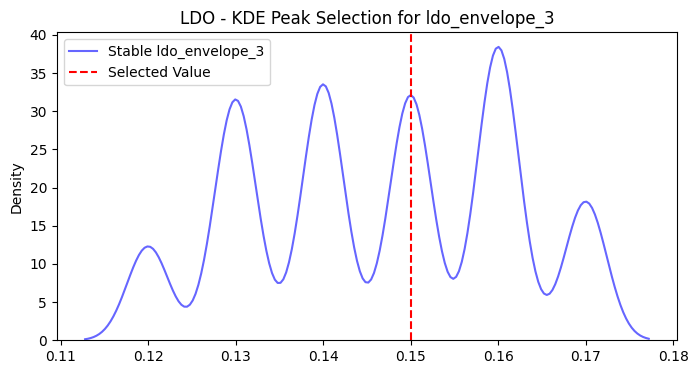

ldo_envelope_4: Detected 0 peaks, selecting 0.2000


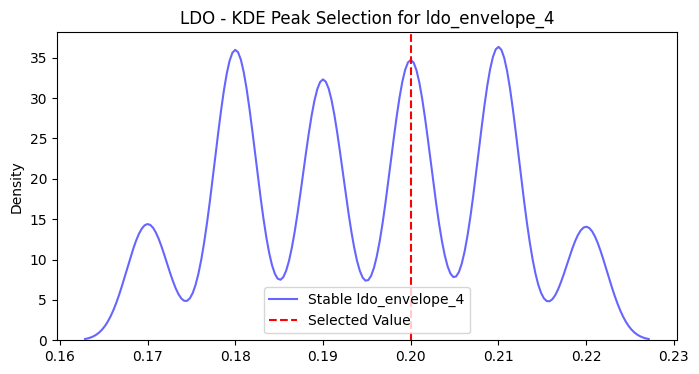

ldo_envelope_1: Detected 0 peaks, selecting 0.0700


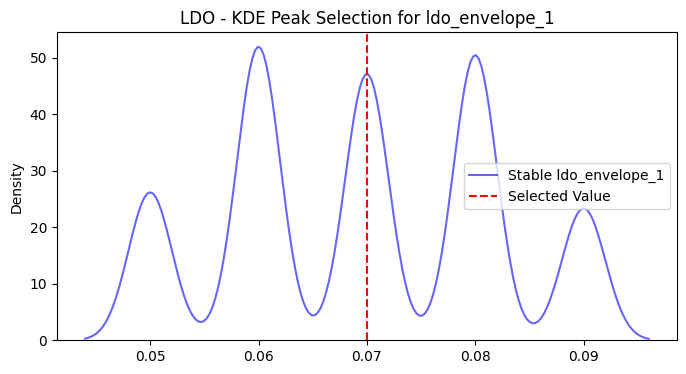

ldo_envelope_2: Detected 0 peaks, selecting 0.1000


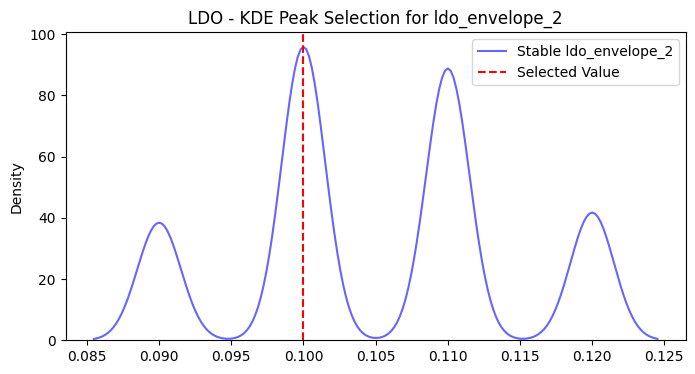


Optimized Parameters for LDO:
size: 0.0700
ma_window: 11.0681
envelope_3: 0.1500
envelope_4: 0.2000
envelope_1: 0.0700
envelope_2: 0.1000

==================== MAGIC ====================
magic_ma_window: Detected 2 peaks, selecting 5.9389


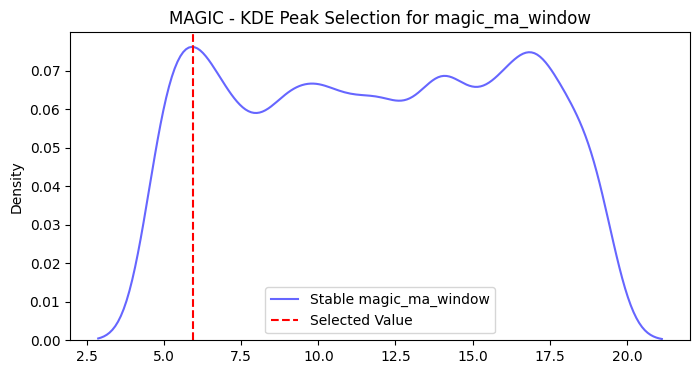

magic_size: Detected 0 peaks, selecting 0.0800


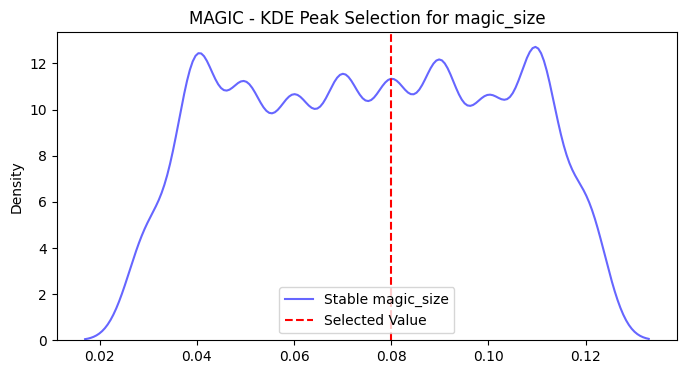

magic_envelope_1: Detected 0 peaks, selecting 0.0700


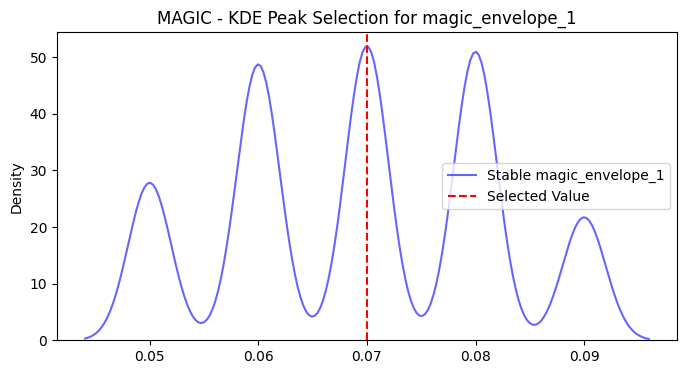

magic_envelope_3: Detected 0 peaks, selecting 0.1400


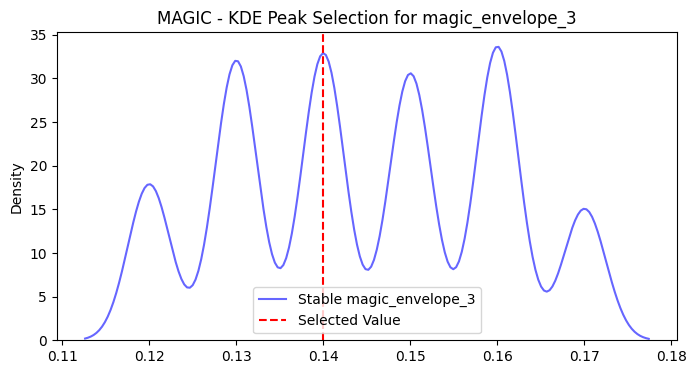

magic_envelope_4: Detected 0 peaks, selecting 0.1900


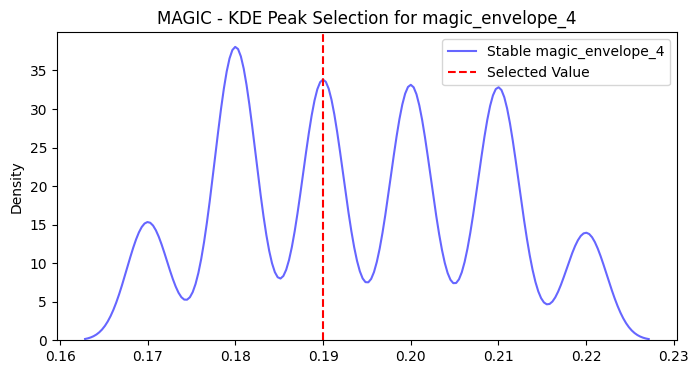

magic_envelope_2: Detected 0 peaks, selecting 0.1000


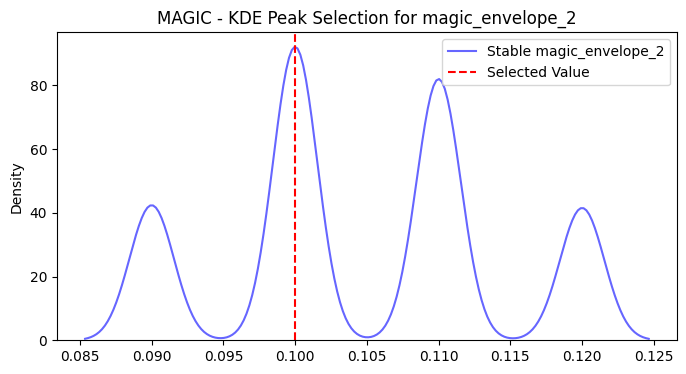


Optimized Parameters for MAGIC:
ma_window: 5.9389
size: 0.0800
envelope_1: 0.0700
envelope_3: 0.1400
envelope_4: 0.1900
envelope_2: 0.1000

==================== KSM ====================
ksm_ma_window: Detected 2 peaks, selecting 11.9510


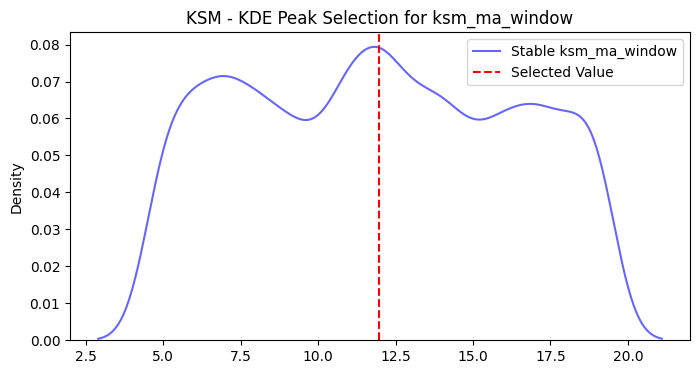

ksm_size: Detected 0 peaks, selecting 0.0700


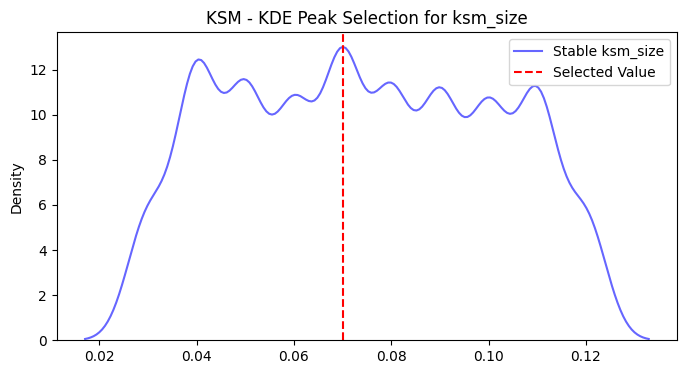

ksm_envelope_1: Detected 0 peaks, selecting 0.0700


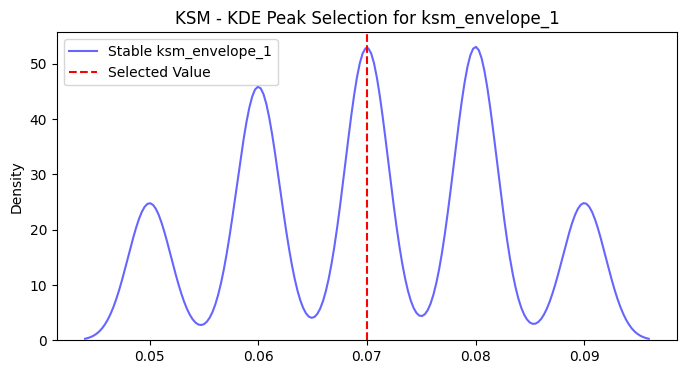

ksm_envelope_4: Detected 0 peaks, selecting 0.1900


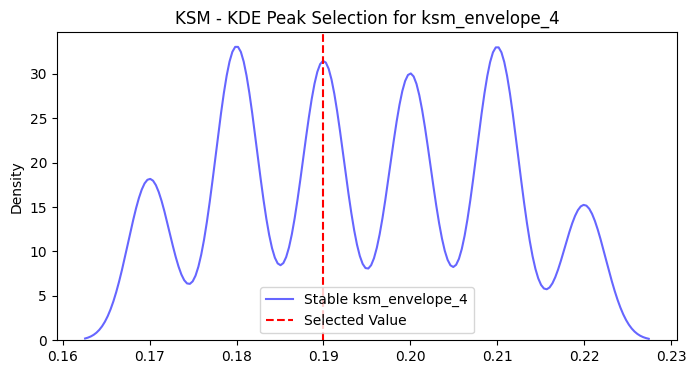

ksm_envelope_3: Detected 0 peaks, selecting 0.1400


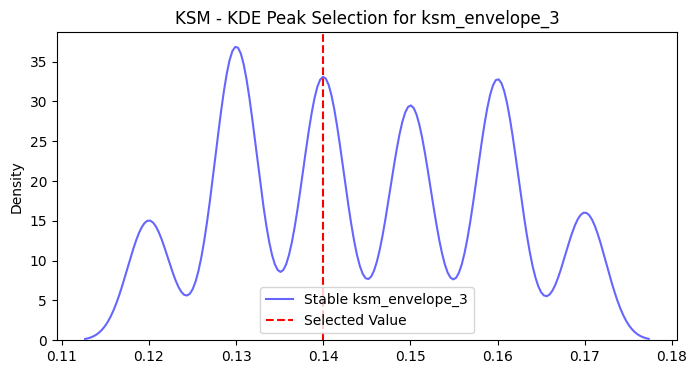

ksm_envelope_2: Detected 0 peaks, selecting 0.1000


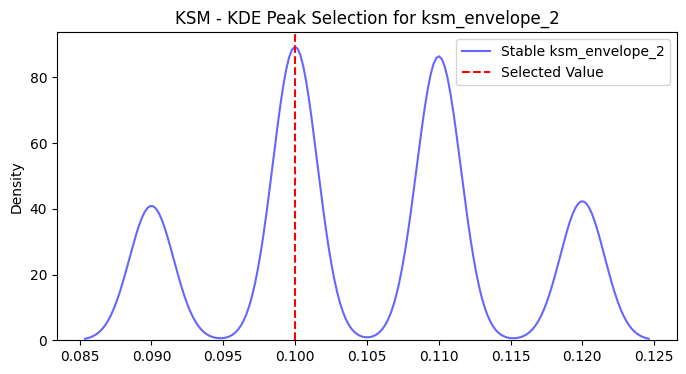


Optimized Parameters for KSM:
ma_window: 11.9510
size: 0.0700
envelope_1: 0.0700
envelope_4: 0.1900
envelope_3: 0.1400
envelope_2: 0.1000

=== Final Optimization Summary ===

LINK:
Optimized Parameters:
- ma_window: 7.9710
- size: 0.0700
- envelope_3: 0.1500
- envelope_2: 0.1100
- envelope_1: 0.0700

DOT:
Optimized Parameters:
- ma_window: 16.0150
- size: 0.0700
- envelope_3: 0.1500
- envelope_1: 0.0700
- envelope_2: 0.1100

SOL:
Optimized Parameters:
- ma_window: 5.9950
- size: 0.0800
- envelope_3: 0.1400
- envelope_1: 0.0700
- envelope_2: 0.1000

XTZ:
Optimized Parameters:
- ma_window: 15.9029
- size: 0.0700
- envelope_1: 0.0700
- envelope_4: 0.2000
- envelope_3: 0.1500
- envelope_2: 0.1000

ETH:
Optimized Parameters:
- ma_window: 6.9479
- envelope_1: 0.0700
- size: 0.0800
- envelope_2: 0.1000
- envelope_3: 0.1500

ARB:
Optimized Parameters:
- ma_window: 7.9429
- size: 0.0700
- envelope_3: 0.1400
- envelope_1: 0.0700
- envelope_2: 0.1100

SAND:
Optimized Parameters:
- ma_window: 8.0

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KernelDensity
from scipy.signal import find_peaks

def peak_based_kde_optimization(stable_params, stable_ranges, feature_importance):
    """Select the most stable parameters by directly choosing the highest KDE peak (original distribution)."""
    
    print("\n=== Peak Detection Optimization ===")
    
    # Group features by coin
    coin_features = {}
    for feature in feature_importance['feature']:
        coin = feature.split('_')[0]
        if coin not in coin_features:
            coin_features[coin] = []
        coin_features[coin].append(feature)
    
    final_parameters = {}

    for coin, features in coin_features.items():
        print(f"\n{'='*20} {coin.upper()} {'='*20}")

        # Select features for this coin
        top_features = features
        optimized_params = {}

        for feature in top_features:
            values = stable_params[feature].values.reshape(-1, 1)

            # Fit KDE on stable parameters
            kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(values)

            # Create density estimation for visualization
            x_grid = np.linspace(values.min(), values.max(), 1000).reshape(-1, 1)
            log_density = kde.score_samples(x_grid)
            density = np.exp(log_density)

            # Detect peaks in KDE distribution
            peaks, _ = find_peaks(density, prominence=0.01)

            if len(peaks) > 0:
                # Find the highest peak (most robust region)
                highest_peak_idx = peaks[np.argmax(density[peaks])]
                selected_value = x_grid[highest_peak_idx][0]
            else:
                # If no peak is detected, fallback to the median value
                selected_value = np.median(values)

            print(f"{feature}: Detected {len(peaks)} peaks, selecting {selected_value:.4f}")

            optimized_params[feature] = selected_value

            # Visualization
            plt.figure(figsize=(8, 4))
            sns.kdeplot(data=values.flatten(), label=f"Stable {feature}", color="blue", alpha=0.6)
            plt.axvline(selected_value, color="red", linestyle="--", label="Selected Value")
            plt.title(f"{coin.upper()} - KDE Peak Selection for {feature}")
            plt.legend()
            plt.show()

        # Store results
        final_parameters[coin] = {
            'optimized_values': optimized_params
        }

        # Print results
        print(f"\nOptimized Parameters for {coin.upper()}:")
        for param, value in optimized_params.items():
            param_type = '_'.join(param.split('_')[1:])
            print(f"{param_type}: {value:.4f}")

    # Print final summary
    print("\n=== Final Optimization Summary ===")
    for coin, results in final_parameters.items():
        print(f"\n{coin.upper()}:")
        print("Optimized Parameters:")
        for param, value in results['optimized_values'].items():
            param_type = '_'.join(param.split('_')[1:])
            print(f"- {param_type}: {value:.4f}")

    return final_parameters

# Run Peak-Based KDE Optimization
final_parameters = peak_based_kde_optimization(stable_params, stable_ranges, feature_importance)


FINAL BACKTEST

In [ ]:
def create_strategy_params(final_parameters):
    """Convert extracted KDE optimized parameters to strategy format"""
    params = {}

    for coin, results in final_parameters.items():
        # Convert coin name to proper format
        pair = f"{coin.upper()}/USDT:USDT"
        opt_values = results['optimized_values']

        # Extract moving average window (rounded to integer)
        ma_window = round(opt_values.get(f'{coin.lower()}_ma_window', 14))  # Default to 14 if missing

        # Extract envelope values
        envelopes = []
        i = 1
        while f'{coin.lower()}_envelope_{i}' in opt_values:
            envelopes.append(opt_values[f'{coin.lower()}_envelope_{i}'])
            i += 1

        # Extract position size
        size = opt_values.get(f'{coin.lower()}_size', 0.05)  # Default to 0.05

        # Store final parameters for backtest
        params[pair] = {
            "src": "close",
            "ma_base_window": ma_window,
            "envelopes": envelopes,
            "size": size
        }

        # Print extracted parameters
        print(f"\nParameters for {pair}:")
        print(f"MA Window: {ma_window}")
        print(f"Envelopes: {envelopes}")
        print(f"Size: {size}")

    return params


# Convert optimized parameters to backtest format
params = create_strategy_params(final_parameters)

# Run backtest with extracted parameters
strat = Strategy(
    df_list=df_list,
    oldest_pair=oldest_pair,
    type=["long", "short"],
    params=params,
)

strat.populate_indicators()
strat.populate_buy_sell()
bt_result = strat.run_backtest(initial_wallet=1000, leverage=2)

# Analyze backtest results
df_trades, df_days = backtest_analysis(
    trades=bt_result['trades'], 
    days=bt_result['days'],
    general_info=True,
    trades_info=True,
    days_info=True,
    long_short_info=True,
    entry_exit_info=True,
    exposition_info=True,
    pair_info=True,
    indepedant_trade=True
)


ROBUSTNESS TEST (MONTE CARLO + STRESS TEST)

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, gaussian_kde
from sklearn.preprocessing import StandardScaler
import time

class RobustnessAnalyzer:
    def __init__(self, strategy, params, df_list):
        self.strategy = strategy
        self.base_params = params
        self.df_list = df_list
        print(f"Initialized RobustnessAnalyzer with {len(df_list)} pairs")
        for pair in df_list:
            print(f"Pair {pair} data shape: {df_list[pair].shape}")
        
    def monte_carlo_simulation(self, n_simulations=1000, confidence_level=0.95):
        """Perform Monte Carlo simulation by varying parameters and market conditions"""
        print("\n=== Starting Monte Carlo Simulation ===")
        print(f"Number of simulations: {n_simulations}")
        print(f"Confidence level: {confidence_level}")
        results = []
        successful_sims = 0
        
        for sim_num in tqdm(range(n_simulations)):
            start_time = time.time()
            print(f"\nStarting simulation {sim_num + 1}/{n_simulations}")
            
            try:
                # Generate parameter variations
                print("Generating parameter variations...")
                perturbed_params = self._perturb_parameters()
                
                # Use original data
                print("Using original data...")
                synthetic_data = {k: v.copy() for k, v in self.df_list.items()}
                
                # Run backtest with perturbed parameters
                print("Running backtest...")
                strat = Strategy(
                    df_list=synthetic_data,
                    oldest_pair=list(synthetic_data.keys())[0],
                    type=["long", "short"],
                    params=perturbed_params
                )
                
                print("Populating indicators...")
                strat.populate_indicators()
                print("Populating buy/sell signals...")
                strat.populate_buy_sell()
                print("Running backtest...")
                bt_result = strat.run_backtest(initial_wallet=1000, leverage=2)
                
                # Calculate key metrics
                metrics = self._calculate_metrics(bt_result)
                if metrics:
                    results.append(metrics)
                    successful_sims += 1
                    print(f"Simulation {sim_num + 1} completed successfully")
                
                end_time = time.time()
                print(f"Simulation {sim_num + 1} took {end_time - start_time:.2f} seconds")
                
            except Exception as e:
                print(f"Simulation {sim_num + 1} failed with error: {str(e)}")
                continue
        
        print(f"\nCompleted {successful_sims} successful simulations out of {n_simulations}")
        
        if not results:
            raise ValueError("All simulations failed. Please check your parameters and data.")
        
        return self._analyze_simulation_results(results, confidence_level)
    
    def _perturb_parameters(self, perturbation_range=0.3): #original cest 0.1
        """Create parameter variations around optimal values"""
        perturbed = {}
        print("\nPerturbing parameters with range:", perturbation_range)
        
        for pair, pair_params in self.base_params.items():
            print(f"Processing parameters for {pair}")
            perturbed[pair] = {
                "src": pair_params["src"],
                "ma_base_window": max(5, int(
                    pair_params["ma_base_window"] * 
                    np.random.uniform(1-perturbation_range, 1+perturbation_range)
                )),
                "envelopes": [
                    max(0.001, min(0.5, env * np.random.uniform(1-perturbation_range, 1+perturbation_range)))
                    for env in pair_params["envelopes"]
                ],
                "size": max(0.01, min(1.0, pair_params["size"] * 
                        np.random.uniform(1-perturbation_range, 1+perturbation_range)))
            }
            print(f"Original MA window: {pair_params['ma_base_window']} -> Perturbed: {perturbed[pair]['ma_base_window']}")
            print(f"Original envelopes: {pair_params['envelopes']} -> Perturbed: {perturbed[pair]['envelopes']}")
        
        return perturbed
    
    def _calculate_metrics(self, bt_result):
        """Calculate metrics using the same formulas as in backtest_analysis"""
        try:
            print("Calculating metrics...")
            # First run backtest_analysis to get the full output
            df_trades, df_days = backtest_analysis(
                trades=bt_result['trades'], 
                days=bt_result['days'],
                general_info=True,  # This will print the full backtest results
                trades_info=True,
                days_info=True,
                long_short_info=True,
                entry_exit_info=True,
                exposition_info=True,
                pair_info=True,
                indepedant_trade=True
            )
            
            print("\nNow calculating our metrics for verification...")
            df_trades = bt_result['trades'].copy()
            df_days = bt_result['days'].copy()
            
            if df_trades.empty or df_days.empty:
                return None
            
            # Calculate necessary intermediate values exactly as in backtest_analysis
            df_days['evolution'] = df_days['wallet'].diff()
            df_days['daily_return'] = df_days['evolution']/df_days['wallet'].shift(1)
            
            df_trades['trade_result'] = df_trades["close_trade_size"] - df_trades["open_trade_size"] - df_trades["open_fee"]
            df_days['wallet_ath'] = df_days['wallet'].cummax()
            df_days['drawdown'] = df_days['wallet_ath'] - df_days['wallet']
            df_days['drawdown_pct'] = df_days['drawdown'] / df_days['wallet_ath']
            
            # Calculate metrics using exact same formulas as backtest_analysis
            initial_wallet = df_days.iloc[0]["wallet"]
            final_wallet = df_days.iloc[-1]['wallet']
            total_trades = len(df_trades)
            total_good_trades = len(df_trades[df_trades['trade_result'] > 0])
            max_days_drawdown = df_days['drawdown_pct'].max()
            vs_usd_pct = (final_wallet - initial_wallet)/initial_wallet
            sharpe_ratio = (365**0.5)*(df_days['daily_return'].mean()/df_days['daily_return'].std())
            global_win_rate = total_good_trades / total_trades
            
            metrics = {
                'sharpe': float(sharpe_ratio),
                'max_drawdown': float(max_days_drawdown * 100),  # Convert to percentage
                'total_return': float(vs_usd_pct * 100),  # Convert to percentage
                'win_rate': float(global_win_rate),
                'profit_factor': float(
                    abs(df_trades[df_trades['trade_result'] > 0]['trade_result'].sum()) /
                    abs(df_trades[df_trades['trade_result'] < 0]['trade_result'].sum())
                ) if len(df_trades[df_trades['trade_result'] < 0]) > 0 else float('inf')
            }
            
            # Print our calculated metrics for verification
            print("\nOur calculated metrics (should match the backtest above):")
            print(f"Sharpe Ratio: {metrics['sharpe']:.2f}")
            print(f"Max Drawdown: {metrics['max_drawdown']:.2f}%")
            print(f"Total Return: {metrics['total_return']:.2f}%")
            print(f"Win Rate: {metrics['win_rate']*100:.2f}%")
            print(f"Profit Factor: {metrics['profit_factor']:.2f}")
            
            return metrics
                    
        except Exception as e:
            print(f"Error in calculate_metrics: {str(e)}")
            print("Days DataFrame columns:", df_days.columns.tolist() if 'df_days' in locals() else "No days_df")
            print("Trades DataFrame columns:", df_trades.columns.tolist() if 'df_trades' in locals() else "No trades_df")
            return None
    
    
    def _analyze_simulation_results(self, results, confidence_level):
        """Analyze Monte Carlo simulation results"""
        print("\nAnalyzing simulation results...")
        df_results = pd.DataFrame(results)
        
        # Basic statistics
        stats = {
            'mean_return': df_results['total_return'].mean(),
            'std_return': df_results['total_return'].std(),
            'mean_sharpe': df_results['sharpe'].mean(),
            'mean_drawdown': df_results['max_drawdown'].mean(),
            'mean_win_rate': df_results['win_rate'].mean()
        }
        
        # Calculate confidence intervals
        confidence_intervals = {}
        for metric in df_results.columns:
            lower = np.percentile(df_results[metric], (1 - confidence_level) * 100 / 2)
            upper = np.percentile(df_results[metric], (1 + confidence_level) * 100 / 2)
            confidence_intervals[metric] = (lower, upper)
        
        # Calculate stability scores (coefficient of variation - lower is better)
        stability_scores = {
            metric: df_results[metric].std() / abs(df_results[metric].mean())
            for metric in df_results.columns
        }
        
        print("\n=== Robustness Analysis Results ===")
        print(f"Number of successful simulations: {len(df_results)}")
        
        print("\nMean Performance Metrics:")
        for metric, value in stats.items():
            print(f"{metric}: {value:.4f}")
        
        print("\nStability Scores (lower is better):")
        for metric, score in stability_scores.items():
            print(f"{metric}: {score:.4f}")
        
        print("\nConfidence Intervals:")
        for metric, (lower, upper) in confidence_intervals.items():
            print(f"{metric}: [{lower:.4f}, {upper:.4f}]")
        
        # Visualization
        self._plot_simulation_results(df_results, confidence_intervals, confidence_level)
        
        return {
            'statistics': stats,
            'confidence_intervals': confidence_intervals,
            'stability_scores': stability_scores,
            'raw_results': df_results
        }
    
    def _plot_simulation_results(self, df_results, confidence_intervals, confidence_level):
        """Create visualizations of simulation results"""
        print("\nGenerating visualization plots...")
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        metrics = ['sharpe', 'total_return', 'max_drawdown', 'win_rate']
        positions = [(0,0), (0,1), (1,0), (1,1)]
        
        for metric, pos in zip(metrics, positions):
            sns.histplot(df_results[metric], kde=True, ax=axes[pos[0], pos[1]])
            
            # Add confidence interval lines
            lower, upper = confidence_intervals[metric]
            axes[pos[0], pos[1]].axvline(lower, color='r', linestyle='--', 
                                       label=f'{(1-confidence_level)*100/2:.1f}%')
            axes[pos[0], pos[1]].axvline(upper, color='r', linestyle='--', 
                                       label=f'{(1+confidence_level)*100/2:.1f}%')
            
            # Add mean line
            mean_value = df_results[metric].mean()
            axes[pos[0], pos[1]].axvline(mean_value, color='g', linestyle='-', label='Mean')
            
            # Add title and labels
            axes[pos[0], pos[1]].set_title(f'{metric.replace("_", " ").title()} Distribution')
            axes[pos[0], pos[1]].set_xlabel(metric)
            axes[pos[0], pos[1]].set_ylabel('Count')
            
            # Add legend
            axes[pos[0], pos[1]].legend()
        
        plt.suptitle('Monte Carlo Simulation Results', y=1.02, fontsize=14)
        plt.tight_layout()
        plt.show()

# Create and run the analyzer
print("Creating RobustnessAnalyzer instance...")
analyzer = RobustnessAnalyzer(Strategy, params, df_list)
print("\nStarting Monte Carlo simulation...")
results = analyzer.monte_carlo_simulation(n_simulations=500)  # Start with 30 simulations
print("\nSimulation completed!")

STOP ICI

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract results DataFrame
df_results = results['raw_results']  # This contains all simulated Sharpe ratios, drawdowns, etc.

# Define the metrics to visualize
metrics = ['sharpe', 'total_return', 'max_drawdown', 'win_rate']

# Create separate histograms for each metric
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Assign each metric to a subplot
for i, metric in enumerate(metrics):
    row, col = divmod(i, 2)
    sns.histplot(df_results[metric], kde=True, ax=axes[row, col], bins=30)
    
    # Add title and labels
    axes[row, col].set_title(f'{metric.replace("_", " ").title()} Distribution')
    axes[row, col].set_xlabel(metric)
    axes[row, col].set_ylabel('Count')

plt.tight_layout()
plt.show()


NameError: name 'results' is not defined